# Differential abundance analysis

In this notebook we test for differential abundance in immune cell populations using [Milo](https://www.biorxiv.org/content/10.1101/2020.11.23.393769v1) (python implementation [milopy](https://github.com/emdann/milopy))

In [31]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [32]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy.sparse
import anndata
import seaborn as sns

import milopy.core as milo
import milopy.plot as milopl

In [33]:
## import project utils
cwd = '../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils

In [34]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/milo_analysis/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir

In [35]:
## r2py setup
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()

In [36]:
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [37]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

In [38]:
import milopy

def annotate_nhoods(adata, anno_col):
    anno_dummies = pd.get_dummies(adata.obs[anno_col])
    anno_count = adata.obsm["nhoods"].T.dot(scipy.sparse.csr_matrix(anno_dummies.values))
    anno_frac = np.array(anno_count/anno_count.sum(1))

    anno_frac = pd.DataFrame(anno_frac, 
                             columns=anno_dummies.columns,
                             index=adata.uns["nhood_adata"].obs_names
                            )
    adata.uns["nhood_adata"].obsm["frac_annotation"] = anno_frac.values
    adata.uns["nhood_adata"].uns["annotation_labels"] = anno_frac.columns
    adata.uns["nhood_adata"].obs["nhood_annotation"] = anno_frac.idxmax(1)
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] = anno_frac.max(1)

## Load data

In [39]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"
split="HSC_IMMUNE"

In [40]:

adata = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))
adata.var_names_make_unique()

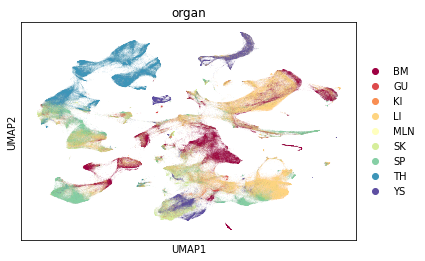

In [41]:
sc.pl.umap(adata, color="organ", palette="Spectral")

In [42]:
## Filter maternal contaminants
mat_barcodes = pd.read_csv("~/Pan_fetal_immune/metadata/souporcell_results/maternal_barcodes.csv", index_col=0)
mat_barcodes["x"] = pd.Series([x.split("-1")[0] for x in mat_barcodes['x']])

adata = adata[~adata.obs_names.isin(mat_barcodes["x"])]

### Make provisional unified annotation

In [43]:
anno_lymph = pd.read_csv("/home/jovyan/Pan_fetal_immune/metadata/manual_annotation/PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.csv", index_col=0)
obs_df = pd.concat([adata.obs, anno_lymph["anno_lvl_2"]],1)
obs_df["anno_lvl_2_LYMPHOID"] = obs_df["anno_lvl_2"]
obs_df = obs_df[["anno_lvl_2_LYMPHOID", "anno_lvl_2_MYELOID","anno_lvl_2_MEM_PROGENITORS"]]
obs_df[obs_df=="nan"] = np.nan

In [44]:
obs_df["updated_anno"] = np.nan
obs_df["updated_anno"][~obs_df.isna().all(1)] = obs_df[~obs_df.isna().all(1)].apply(lambda x: x[x.first_valid_index()], axis=1)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [45]:
adata.obs["updated_anno"] = obs_df["updated_anno"].copy()

Trying to set attribute `.obs` of view, copying.


In [46]:
adata.obs.loc[~adata.obs["updated_anno"].isna(),"updated_anno"] = [x.upper() for x in adata.obs["updated_anno"][~adata.obs["updated_anno"].isna()] ]

In [47]:
adata.obs["updated_anno"] = adata.obs["updated_anno"].astype("str")
adata.obs.loc[adata.obs["leiden_150"]=="41", "updated_anno"] = "PDC"

In [48]:
adata.obs["updated_anno"] = ["ERY_MAC" if x=="ERYTHROID_MACROPHAGE" else x for x in adata.obs["updated_anno"].astype("str")]
adata.obs["updated_anno"] = ["ILC3" if x in ["ILCP", "NCR2+ILC3", "NCR2-ILC3"] else x for x in adata.obs["updated_anno"].astype("str")]

In [49]:
anno_groups = {
    "NK/ILC/T CELLS" : [ "DN(P)_DN(EARLY) T CELL",  "DN(Q) T CELL", "DP(Q) T CELL" ,  "DP(P) T CELL", "ABT(ENTRY)", "CD4+T", "CD8+T", "CD8AA","TREG","TH17",  "NK T", "NK", "ILCP","ILC2", "ILC3","CYCLING ILC"],
    "B CELLS" :["PRE PRO B CELL", "PRO B CELL","LATE PRO B CELL", "PRO TO PRE B CELL","SMALL PRE B CELL","LARGE PRE B CELL", "PRE B CELL", "IMMATURE B CELL", "MATURE B CELL", "B1 CELL", "PLASMA B CELL"],
    "EO/BASO/MAST":["BASOPHIL", "EOSINOPHIL_MOP","MAST_CELL"],
    "MYELOID":[
    "PROMYELOCYTE","MYELOCYTE", "NEUTROPHIL",
    "MONO_MAC", "ERY_MAC", "KUPFFER", "LANGERHAN CELLS", "LYMPHOID_SCAVENGING_MAC","MAC", "MZM", "MZM_(BAFF)",
                   "RP_MAC", "STROMAL_MAC","PROMONOCYTE", "CD14_MONOCYTE",
    'PDC_PROGEN',"MYELOID_DC_PROGEN","DC_PROGEN","DC1", "DC2","DC3", "PDC"],
    "PROGENITORS" : ["HSC_MPP","CMP","MEMP","GMP","MPP_MYE","CLP", "ELP", "PROGENITOR"],
    "ERYTHROID":["EARLY_ERYTHROID","MID_ERYTHROID", "LATE_ERYTHROID","GOWER1_ERY"],
    "MK":["EARLY_MK","MK"]
    }

In [50]:
anno_groups_df = pd.concat([pd.DataFrame.from_dict({"anno_group":k, "updated_anno":v})for k,v in anno_groups.items()])

In [51]:
anno_groups_df.to_csv("/home/jovyan/Pan_fetal_immune/metadata/manual_annotation/annotation_groups_HSC_IMMUNE_20210609.csv")

# anno_groups_df = pd.read_csv("/home/jovyan/Pan_fetal_immune/metadata/manual_annotation/annotation_groups_HSC_IMMUNE_20210609.csv", index_col=0)

In [52]:
obs_names = adata.obs_names.copy()

In [53]:
if "anno_group" in adata.obs.columns:
    adata.obs = adata.obs.drop("anno_group",1)
new_obs_df = pd.merge(adata.obs, anno_groups_df, how="left").copy()
new_obs_df.index = obs_names

In [54]:
adata.obs = new_obs_df.copy()

In [55]:
del new_obs_df

## Accounting for bias in FACS sorting
Load CD45+/- proportions, provided by Isaac

In [58]:
facs_prop_df = pd.read_csv("/home/jovyan/mount/gdrive/Pan_fetal/meta_share/220621_FACs_gating_proportions_correct.csv")

## Keep only CD45+ and CD45- cells
facs_prop_df = facs_prop_df[facs_prop_df["sort.ids"].isin(["CD45+", "CD45-"])]

## Distinguish tissues where there have been multiple sorts by the no of total events 
facs_prop_df["sort_sample_id"] = facs_prop_df.origin + "_" + facs_prop_df["orig.ident"] + "_" + facs_prop_df.total_live_events.astype("str")

In [27]:
facs_prop_df.head()

,orig.ident,Sample.lanes,age,sort.ids,origin,count,total_live_events,parent_Multiplier,remarks,sort_sample_id
0,F19,FCAImmP7241242,10,CD45+,liver,209476,306627,0.683162,NaN,liver_F19_306627
1,F19,FCAImmP7241243,10,CD45-,liver,96687,306627,0.315324,NaN,liver_F19_306627
2,F19,FCAImmP7241241,10,CD45+,skin,22826,919270,0.024831,NaN,skin_F19_919270
3,F19,FCAImmP7241240,10,CD45-,skin,895669,919270,0.974326,NaN,skin_F19_919270
4,F21,FCAImmP7179367,16,CD45+,fbm,2500,48874,0.410000,NaN,fbm_F21_48874


Add to obs and visualize on UMAP

In [59]:
obs_names = adata.obs.index.copy()
new_obs = pd.merge(adata.obs, facs_prop_df, how="left", indicator=True)
new_obs.index = obs_names

In [60]:
adata.obs = new_obs.drop("_merge", 1).copy()

... storing 'Sample.lanes' as categorical
... storing 'updated_anno' as categorical
... storing 'anno_group' as categorical
... storing 'orig.ident' as categorical
... storing 'sort.ids' as categorical
... storing 'origin' as categorical
... storing 'count' as categorical
... storing 'total_live_events' as categorical
... storing 'sort_sample_id' as categorical


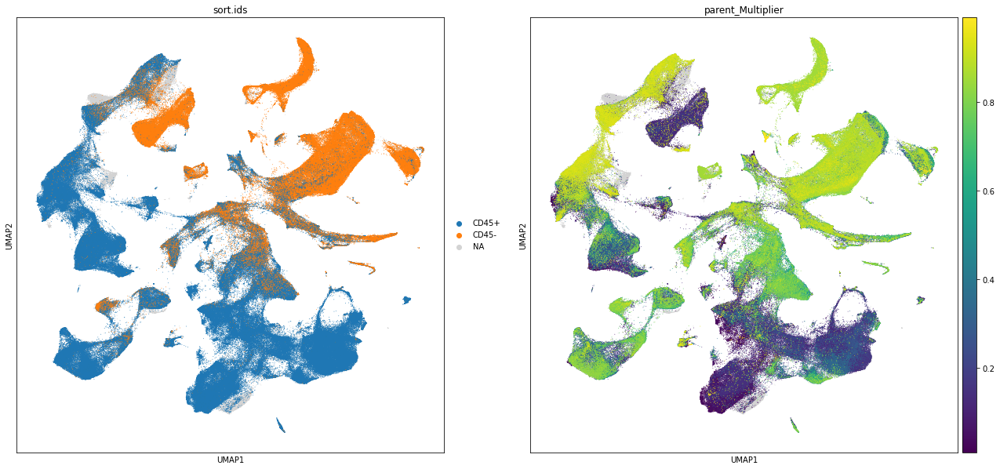

In [30]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.umap(adata, color=["sort.ids","parent_Multiplier"], size=3)

### Is the sorting proportion related to age?

In [31]:
smp_metadata = adata.obs[["sort.ids", "parent_Multiplier", "organ", "age", 'Sample.lanes', "donor"]].drop_duplicates()

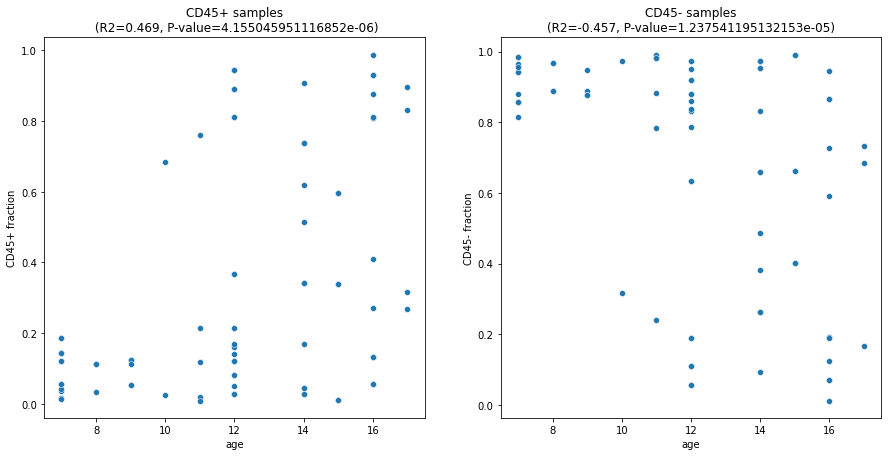

In [32]:
plt.rcParams["figure.figsize"] = [15,7]
plt.subplot(121);
r2,p_val = scipy.stats.pearsonr(smp_metadata[smp_metadata["sort.ids"]=="CD45+"]["age"], smp_metadata[smp_metadata["sort.ids"]=="CD45+"]["parent_Multiplier"])
sns.scatterplot(data=smp_metadata[smp_metadata["sort.ids"]=="CD45+"], x="age", y="parent_Multiplier");
plt.ylabel("CD45+ fraction");
plt.title("CD45+ samples\n (R2={r}, P-value={p})".format(r=round(r2,3), p=p_val));
plt.subplot(122);
# sns.scatterplot(data=smp_metadata[smp_metadata["sort.ids"]=="CD45-"], x="age", y="parent_Multiplier", hue="sort.ids");
r2,p_val = scipy.stats.pearsonr(smp_metadata[smp_metadata["sort.ids"]=="CD45-"]["age"], smp_metadata[smp_metadata["sort.ids"]=="CD45-"]["parent_Multiplier"])
sns.scatterplot(data=smp_metadata[smp_metadata["sort.ids"]=="CD45-"], x="age", y="parent_Multiplier");
plt.ylabel("CD45- fraction");
plt.title("CD45- samples\n(R2={r}, P-value={p})".format(r=round(r2,3), p=p_val));
# plt.show();

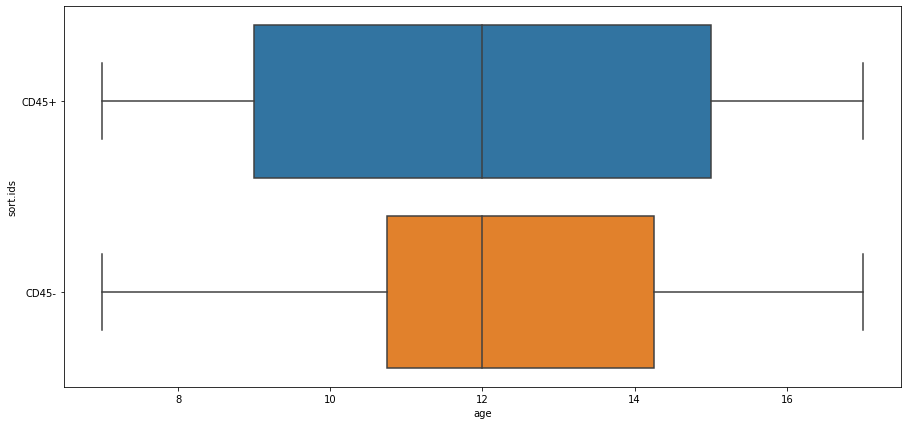

In [33]:
sns.boxplot(data=smp_metadata, x="age", y="sort.ids");
plt.show()

### Pre-processing for differential abundance testing

We bin gestational ages in 6 windows of 2 weeks length.

In [61]:
cut_labels_4 = ['< 8pcw', '< 10pcw', '< 12pcw', '< 14pcw', '< 16pcw', '< 18pcw']
cut_bins = [0, 8, 10, 12, 14, 16, 18]
adata.obs["age_bins"] = pd.cut(adata.obs["age"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata.obs["age_bins"] = pd.Categorical(adata.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata.obs["age_bins"]

## Convert covariate to continous
adata.obs['age_bins'] = adata.obs['age_bins'].cat.codes

We keep cells sorted for CD45+, CD45- or total.

In [62]:
### Fix sort ids
adata.obs["Sort_id"] = ["CD45P" if x == "CD45P_CD45N" else x for x in adata.obs["Sort_id"]]
adata.obs["Sort_id"] = ["CD45N" if x == "CD45EN" else x for x in adata.obs["Sort_id"]]

### Exclude cells from unconventional sorts
adata = adata[adata.obs["Sort_id"].isin(["CD45P", "CD45N", "TOT"])]
### Exclude CD45P/N cells that don't have true fraction quantification
# (mainly Gut, ask Rasa)
adata = adata[~(adata.obs["Sort_id"].isin(["CD45P", "CD45N"]) & adata.obs["sort.ids"].isna())]

In [63]:
## Recompute KNN graph
sc.pp.neighbors(adata, use_rep = "X_scvi", n_neighbors = 30, key_added="scvi")

### Calculate correction factor for each sample

We define the correction factor as 

$$ f_{n} = \log \frac{p_n \cdot \sum_n{S_n}}{S_n} $$

where $p_n$ represents the true proportion of cells from sort $n$ in the tissue samples (column `parent_Multiplier` in FACS table), and $S_n$ represents the total number of cells in sort $n$ (of note, this doesn't coincide with the sum of all $c_{n,i}$ since the same cell can be included in multiple neighbourhoods).

For the unsorted samples we set the correction factor to 0.

In [37]:
import milopy
def _add_FACS_correction_factor(adata):
    milopy.utils.add_covariate_to_nhoods_var(adata,["parent_Multiplier", "sort.ids", 'donor', 'sort_sample_id'])
    nhood_adata = adata.uns["nhood_adata"].copy()
    ## Keep only samples with CD45+/CD45- ratio information
    nhood_adata = nhood_adata[:,nhood_adata.var["sort.ids"].isin(["CD45+", "CD45-"])]
    ## Exclude neighbourhoods that are empty after filtering
    nhood_adata = nhood_adata[nhood_adata.X.sum(1) > 0]
    ## Apply correction
    X_counts = nhood_adata.X.toarray()
    adata.obs["n_sort"] = adata.obs["sort_sample_id"].astype("str") + "_" + adata.obs["sort.ids"].astype("str")
    nhood_adata.var["n_sort"] = nhood_adata.var["sort_sample_id"].astype("str") + "_" + nhood_adata.var["sort.ids"].astype("str")
    sum_i_c_n = adata.obs["n_sort"].value_counts()[nhood_adata.var["n_sort"]].values
    p = nhood_adata.var["parent_Multiplier"].astype("float").values
    sum_S = adata.obs["sort_sample_id"].value_counts()[nhood_adata.var["sort_sample_id"]].values
    count_correction_fact = (p * sum_S)/sum_i_c_n
    fact_correction_df = pd.DataFrame([count_correction_fact, nhood_adata.var_names]).T
    
    fact_correction_df.columns = ["correction_factor", "Sample.lanes"]
    new_obs = pd.merge(adata.obs, fact_correction_df,how="left")
    new_obs.index = adata.obs_names
    adata.obs = new_obs.copy()
    adata.obs["correction_factor"]= adata.obs["correction_factor"].astype("float64")
    adata.obs["correction_factor"] = np.log10(adata.obs["correction_factor"])
    return(adata, count_correction_fact)

In [64]:
## Construct neighbourhoods
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

## Count cells in neighbourhoods
milo.count_nhoods(adata, sample_col="Sample.lanes")

In [39]:
## Add correction factor
if "correction_factor" in adata.obs.columns:
    adata.obs = adata.obs.drop("correction_factor",1)
    del adata.uns["nhood_adata"].var["correction_factor"]
adata,fact = _add_FACS_correction_factor(adata)
## Set factor to 0 for unsorted samples
adata.obs.loc[adata.obs["Sort_id"]=="TOT","correction_factor"] = 0

Trying to set attribute `.var` of view, copying.


... storing 'Sample.lanes' as categorical
... storing 'Sort_id' as categorical
... storing 'n_sort' as categorical


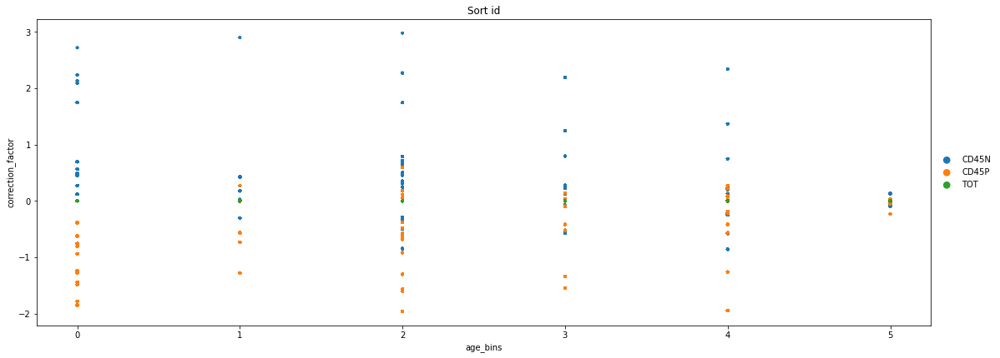

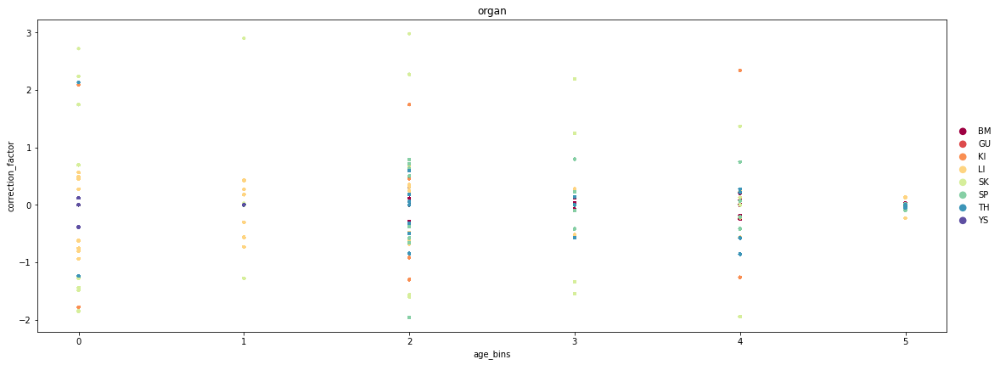

In [40]:
sc.pl.scatter(adata, "age_bins", "correction_factor", size=50, color="Sort_id");
sc.pl.scatter(adata, "age_bins", "correction_factor", size=50, color="organ")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


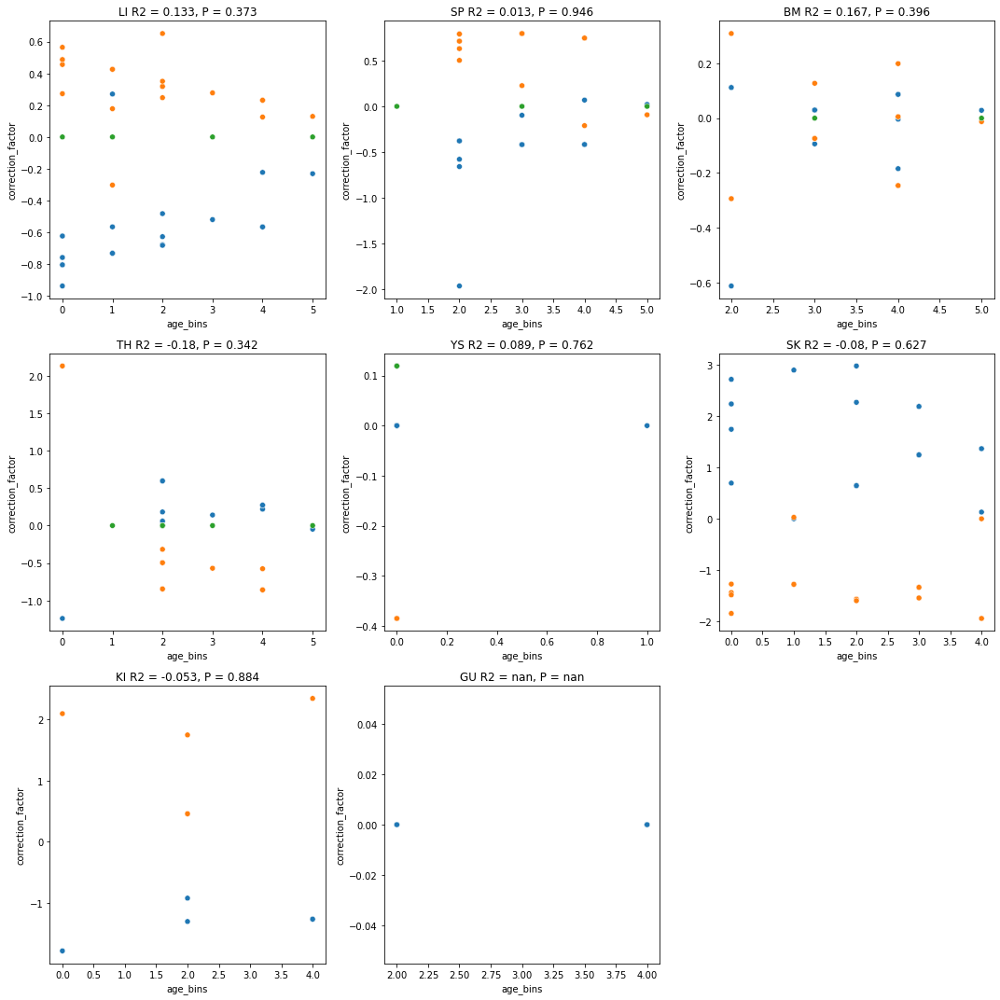

In [41]:
milopy.utils.add_covariate_to_nhoods_var(adata,["correction_factor", "organ", "Sort_id","sort.ids", "age_bins"])

nhood_adata =adata.uns["nhood_adata"].copy()
df = nhood_adata.var.copy()
df["correction_factor"] = df["correction_factor"].astype("float")
df["age_bins"] = df["age_bins"].astype("float")

all_organs = nhood_adata.var.organ.unique()
plt.rcParams["figure.figsize"] = [15,15]
for i in range(len(all_organs)):
    r2, p_val = scipy.stats.pearsonr(df[df['organ']==all_organs[i]]["correction_factor"].astype("float").values, df[df['organ']==all_organs[i]]["age_bins"].astype("float").values)
    plt.subplot(3, 3, i+1);
    sns.scatterplot(data=df[df['organ']==all_organs[i]], y="correction_factor", x="age_bins", hue="sort.ids");
    plt.title("{o} R2 = {r}, P = {p}".format(o=all_organs[i],r=np.round(r2, 3), p=np.round(p_val, 3)));
    plt.legend([],[], frameon=False)
    plt.tight_layout()

### Test for differences in age using the correction factor as a confounding covariate

In [42]:
import milopy.core as milo
def _milo_test_by_organ(adata, design="~ Sort_id + age_bins", sample_col="Sample.lanes", test_organs = None):  
    if test_organs is None:
        ## Keep organs covering at least two time-points
        df = adata.obs[["organ",sample_col, "age_bins"]].drop_duplicates()
        df = df.groupby(["organ","age_bins"]).count().reset_index().pivot("organ",columns="age_bins")
        sampled_organs = df.index[(df > 0).sum(1) > 2]
    else:
        sampled_organs = test_organs

    ## Calculate logFC and SpatialFDR within each organ
    milo_res_dict = {}
    for org in sampled_organs:
        print(org)
        org_samples = adata.obs[adata.obs["organ"] == org][sample_col].unique()
        milo.DA_nhoods(adata, design=design, subset_samples=org_samples)
        milo_res_dict[org] = adata.uns["nhood_adata"].obs.copy()

    ## Collapse results
    logFC_df_ls = [v["logFC"] for k,v in milo_res_dict.items()]
    for k,v in milo_res_dict.items():
        milo_res_dict[k]["logFC_" + k] = milo_res_dict[k]["logFC"].copy()
        milo_res_dict[k]["SpatialFDR_" + k] = milo_res_dict[k]["SpatialFDR"].copy()

    org_fc = pd.concat([v[["logFC_" + k]] for k,v in milo_res_dict.items()], 1)
    org_fdr = pd.concat([v[["SpatialFDR_" + k]] for k,v in milo_res_dict.items()], 1)
    return(milo_res_dict, org_fc, org_fdr)

In [43]:
milo_res_2, org_fc_2, org_fdr_2 = _milo_test_by_organ(adata, 
                                                      design="~ correction_factor + age_bins",
                                                      test_organs = ["BM", "LI", "SK", "SP", "TH"]
                                                     )

BM


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


LI
SK
SP
TH


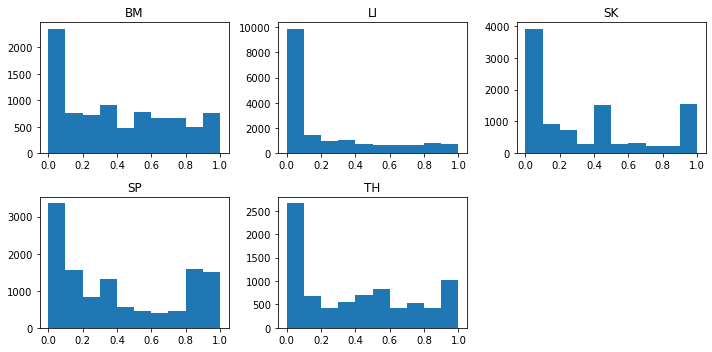

In [44]:
plt.rcParams["figure.figsize"] = [10,5]
i=1
for k in milo_res_2.keys():
    plt.subplot(2,3,i)
    plt.hist(milo_res_2[k].PValue);
    plt.title(k);
    plt.tight_layout();
    i+=1

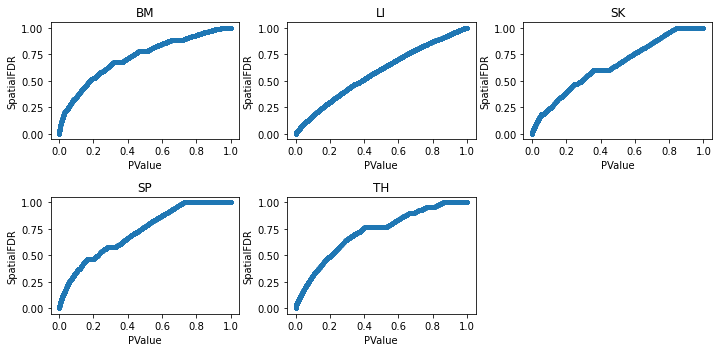

In [45]:
plt.rcParams["figure.figsize"] = [10,5]
i=1
for k in milo_res_2.keys():
    plt.subplot(2,3,i)
    plt.plot(milo_res_2[k].PValue, milo_res_2[k].SpatialFDR, '.');
    plt.title(k);
    plt.tight_layout();
    plt.xlabel("PValue");
    plt.ylabel("SpatialFDR");
    i+=1

### Sanity checks on FACS correction

In [155]:
## Test regressing out sorting label
milo_res_2a, org_fc_2a, org_fdr_2a = _milo_test_by_organ(adata, 
                                                         design="~ Sort_id + age_bins",
                                                         test_organs = ["BM", "LI", "SP", "TH"]
                                                        )

## Test without accounting for sort
milo_res_2b, org_fc_2b, org_fdr_2b = _milo_test_by_organ(adata, 
                                                         design="~ age_bins",
                                                         test_organs = ["BM", "LI", "SP", "TH"]
                                                        )

## Test on unsorted samples only
design="~ age_bins"
sampled_organs = [ "LI", "SP", "TH"]

## Calculate logFC and SpatialFDR within each organ
milo_res_dict = {}
for org in sampled_organs:
    print(org)
    org_samples = adata.obs[(adata.obs["organ"] == org) & (adata.obs["Sort_id"]=="TOT")][sample_col].unique()
    milo.DA_nhoods(adata, design=design, subset_samples=org_samples)
    milo_res_dict[org] = adata.uns["nhood_adata"].obs.copy()

## Collapse results
logFC_df_ls = [v["logFC"] for k,v in milo_res_dict.items()]
for k,v in milo_res_dict.items():
    milo_res_dict[k]["logFC_" + k] = milo_res_dict[k]["logFC"].copy()
    milo_res_dict[k]["SpatialFDR_" + k] = milo_res_dict[k]["SpatialFDR"].copy()
#         milo_res_dict[k].loc[milo_res_dict[k]["FDR"] > 0.1, "logFC_" + k] = np.nan

org_fc = pd.concat([v[["logFC_" + k]] for k,v in milo_res_dict.items()], 1)
org_fdr = pd.concat([v[["SpatialFDR_" + k]] for k,v in milo_res_dict.items()], 1)

milo_res_unsorted, org_fc_unsorted, org_fdr_unsorted = milo_res_dict, org_fc,org_fdr

We compare the p-values after FDR correction for different experimental designs. We can see that using the continuous sorting fraction removes some false positives.

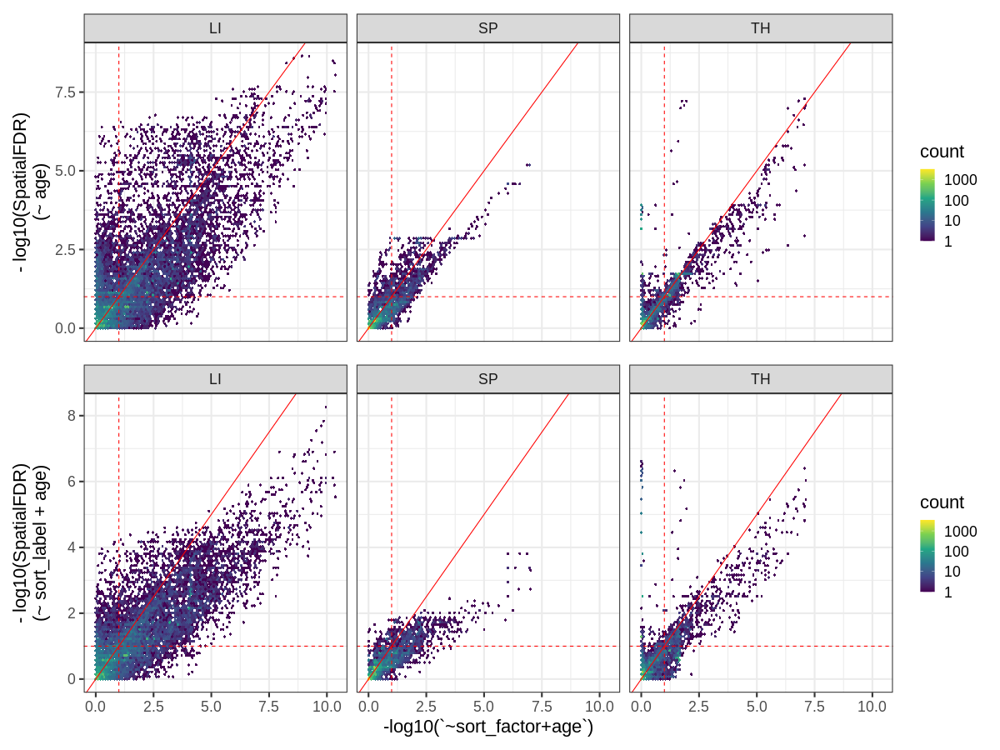

In [159]:
%%R -i org_fdr_2a -i org_fdr_2b -i org_fdr_unsorted -i org_fdr_2 -i figdir -w 1200 -h 900
library(tidyr)
library(patchwork)

pl_df <- bind_rows(
    pivot_longer(org_fdr_2a %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~sort_label+age"),
    pivot_longer(org_fdr_2b %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~age"),
    pivot_longer(org_fdr_2 %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~sort_factor+age"),
    pivot_longer(org_fdr_unsorted %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="unsorted")
) %>%
    filter(!name %in% c("SpatialFDR_SK", "SpatialFDR_BM")) %>%
    drop_na() %>%
    pivot_wider(id_cols=c(nhood, name), names_from="design", values_from="value") %>%
    mutate(name=str_remove(name, "SpatialFDR_"))

p_top <- pl_df %>%
    ggplot(aes(-log10(`~sort_factor+age`), -log10(`~sort_label+age`))) +
    geom_hex(bins=100) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    scale_fill_viridis_c(trans = "log10") +
    theme_bw(base_size=22) +
    geom_vline(color="red", linetype=2, xintercept=1) +
    geom_hline(color="red", linetype=2, yintercept=1) +
    ylab("- log10(SpatialFDR)\n(~ sort_label + age)")

p_middle <- pl_df %>%
    ggplot(aes(-log10(`~sort_factor+age`), -log10(`~age`))) +
    geom_hex(bins=100) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    scale_fill_viridis_c(trans = "log10") +
    theme_bw(base_size=22) +
    geom_vline(color="red", linetype=2, xintercept=1) +
    geom_hline(color="red", linetype=2, yintercept=1) +
    ylab("- log10(SpatialFDR)\n(~ age)") +
    xlab("- log10(SpatialFDR) (~ sort_factor + age)")
    
(p_middle + remove_x_axis()) / p_top +
    ggsave(paste0(figdir, "FACS_correction_FDR_scatter.pdf"), width=15, height=10) +
    ggsave(paste0(figdir, "FACS_correction_FDR_scatter.png"), width=15, height=10)
    

We compare the inferred fold-changes with different experimental designs to the fold-changes estimated on the unsorted samples only.

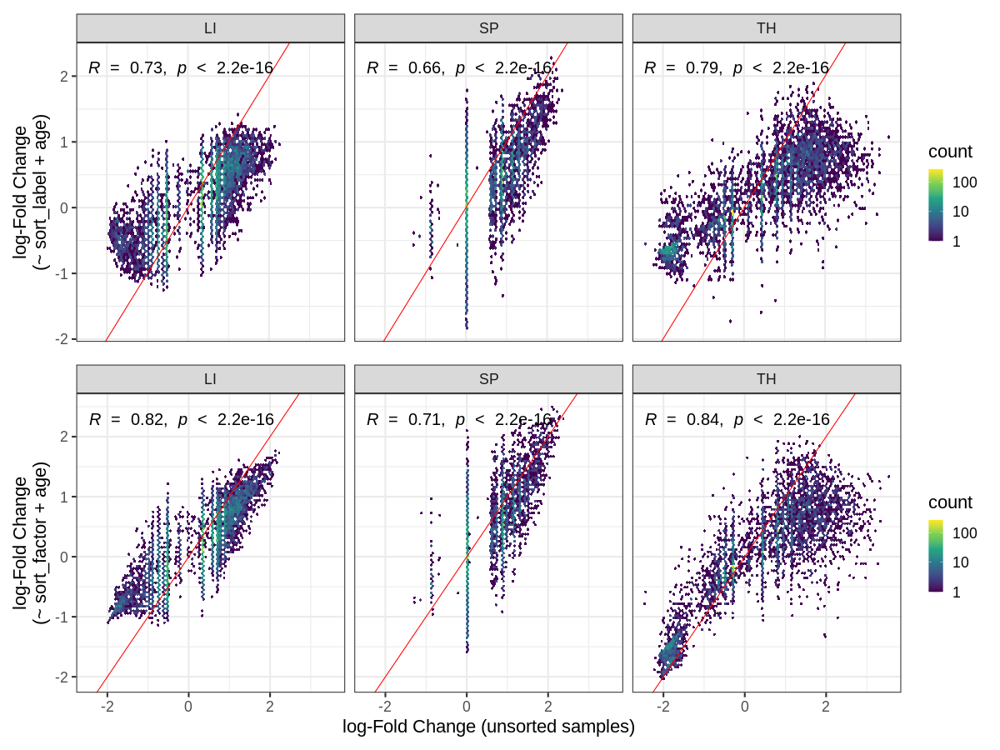

In [161]:
%%R -i org_fc_2a -i org_fc_2b -i org_fc_unsorted -i org_fc_2 -w 1200 -h 900
library(tidyr)
library(patchwork)

pl_df <- bind_rows(
    pivot_longer(org_fc_2a %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~sort_label+age"),
    pivot_longer(org_fc_2b %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~age"),
    pivot_longer(org_fc_2 %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="~sort_factor+age"),
    pivot_longer(org_fc_unsorted %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="unsorted")
) %>%
    filter(!name %in% c("logFC_SK", "logFC_BM")) %>%
    drop_na() %>%
    pivot_wider(id_cols=c(nhood, name), names_from="design", values_from="value") %>%
    mutate(name=str_remove(name, "logFC_"))



p_top <- pl_df %>%
    ggplot(aes(unsorted, `~sort_label+age`)) +
    geom_hex(bins=100) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    scale_fill_viridis_c(trans = "log10") +
    ggpubr::stat_cor(size=7) +
    theme_bw(base_size=22) +
    remove_x_axis() +
    ylab("log-Fold Change\n(~ sort_label + age)") 

# p_middle <- pl_df %>%
#     ggplot(aes(unsorted, `~age`)) +
#     geom_hex(bins=100) +
#     facet_wrap(name~.) +
#     geom_abline(color="red") +
#     scale_fill_viridis_c(trans = "log10")+
#     ggpubr::stat_cor(size=7) +
#     theme_bw(base_size=22) +
#     remove_x_axis()

    
p_bottom <- pl_df %>%
    ggplot(aes(unsorted, `~sort_factor+age`)) +
    geom_hex(bins=100) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    scale_fill_viridis_c(trans = "log10") +
    ggpubr::stat_cor(size=7) +
    theme_bw(base_size=22) +
    ylab("log-Fold Change\n(~ sort_factor + age)") +
    xlab("log-Fold Change (unsorted samples)")
    
(p_top / p_bottom) +
    ggsave(paste0(figdir, "FACS_correction_logFC_scatter.pdf"), width=15, height=10) +
    ggsave(paste0(figdir, "FACS_correction_logFC_scatter.png"), width=15, height=10)
    


### Visualize DA results by lineage

In [80]:
org_fc_filtered = org_fc_2.copy()

## Add annotation
annotate_nhoods(adata, anno_col="updated_anno")
org_fc_filtered["nhood_anno"] = adata.uns["nhood_adata"].obs["nhood_annotation"]
org_fc_filtered.loc[adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.5, "nhood_anno"] = "Mixed"

anno_groups_df['nhood_anno'] = anno_groups_df['updated_anno']
org_fc_filtered = pd.merge(org_fc_filtered, anno_groups_df, how="left")
org_fc_filtered = org_fc_filtered.drop(["updated_anno"], 1)

In [47]:
%%R -i org_fc_filtered -i org_fdr_2 -h 1000 -w 800

long_org_fc <- org_fc_filtered %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(nhood_anno, anno_group, Nhood), names_to="organ", values_to="logFC") %>%
    mutate(organ=str_remove(organ, "logFC_")) 

long_org_fdr <- org_fdr_2 %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(Nhood), names_to="organ", values_to="SpatialFDR") %>%
    mutate(organ=str_remove(organ, "SpatialFDR_")) 
    
plot_df <- left_join(long_org_fc, long_org_fdr) %>%
    filter(!is.na(logFC)) %>%
    filter(nhood_anno!="nan") %>%
    filter(nhood_anno!="Mixed") %>%
    ## Fix organ naming and order 
    mutate(organ=factor(organ, levels=c("YS", "LI", "SK", "TH", "SP", "BM", "MLN", "KI", "GU"))) %>%
    ## Fix some names
    mutate(nhood_anno=ifelse(str_detect(nhood_anno, "NK$"), "NK", nhood_anno)) %>%
    ## Reorder by fold-change 
    group_by(organ, nhood_anno, Nhood) %>%
    mutate(mean_logFC = mean(logFC)) %>%
    ungroup() %>%
    group_by(organ, nhood_anno) %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    mutate(Nhood=factor(Nhood, levels=unique(Nhood))) %>%
    group_by(nhood_anno) %>%
    filter(length(unique(Nhood)) > 20) %>%
    ungroup()

head(plot_df)

Joining, by = c("Nhood", "organ")
  Nhood     nhood_anno anno_group organ    logFC  SpatialFDR mean_logFC
1  7899  CD14_MONOCYTE    MYELOID    BM 3.110251 0.009714522   3.110251
2 24654  CD14_MONOCYTE    MYELOID    BM 3.002999 0.009929549   3.002999
3 10448 LATE_ERYTHROID  ERYTHROID    BM 2.845385 0.010979300   2.845385
4 24642    PROMONOCYTE    MYELOID    BM 2.797862 0.010806048   2.797862
5 10420 LATE_ERYTHROID  ERYTHROID    BM 2.785137 0.011284476   2.785137
6  7880  CD14_MONOCYTE    MYELOID    BM 2.767909 0.009967483   2.767909


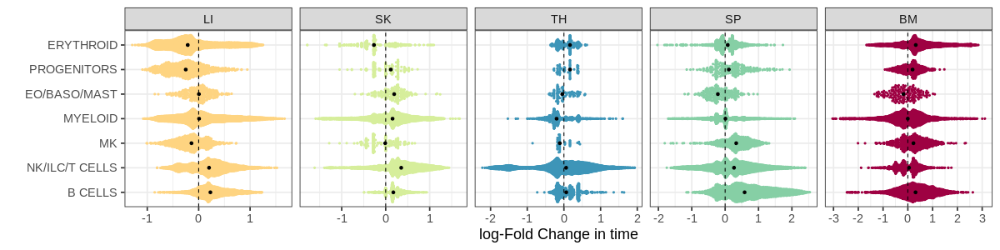

In [48]:
%%R -w 1200 -h 300 
library(ggbeeswarm)
organ_colors_df <- read.csv("~/Pan_fetal_immune/metadata/organ_colors.csv")
organ_palette <- setNames(organ_colors_df$color, organ_colors_df$organ)

plot_df %>%
    filter(!is.na(anno_group)) %>%
    group_by(anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(anno_group=factor(anno_group, levels=unique(anno_group))) %>%
    ggplot(aes(anno_group, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, anno_group, mean_logFC), aes(x=anno_group, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 
#     ggsave(paste0(figdir, "milo_results_overview.png"), height=4, width=15) +
#     ggsave(paste0(figdir, "milo_results_overview.pdf"), height=4, width=15) 

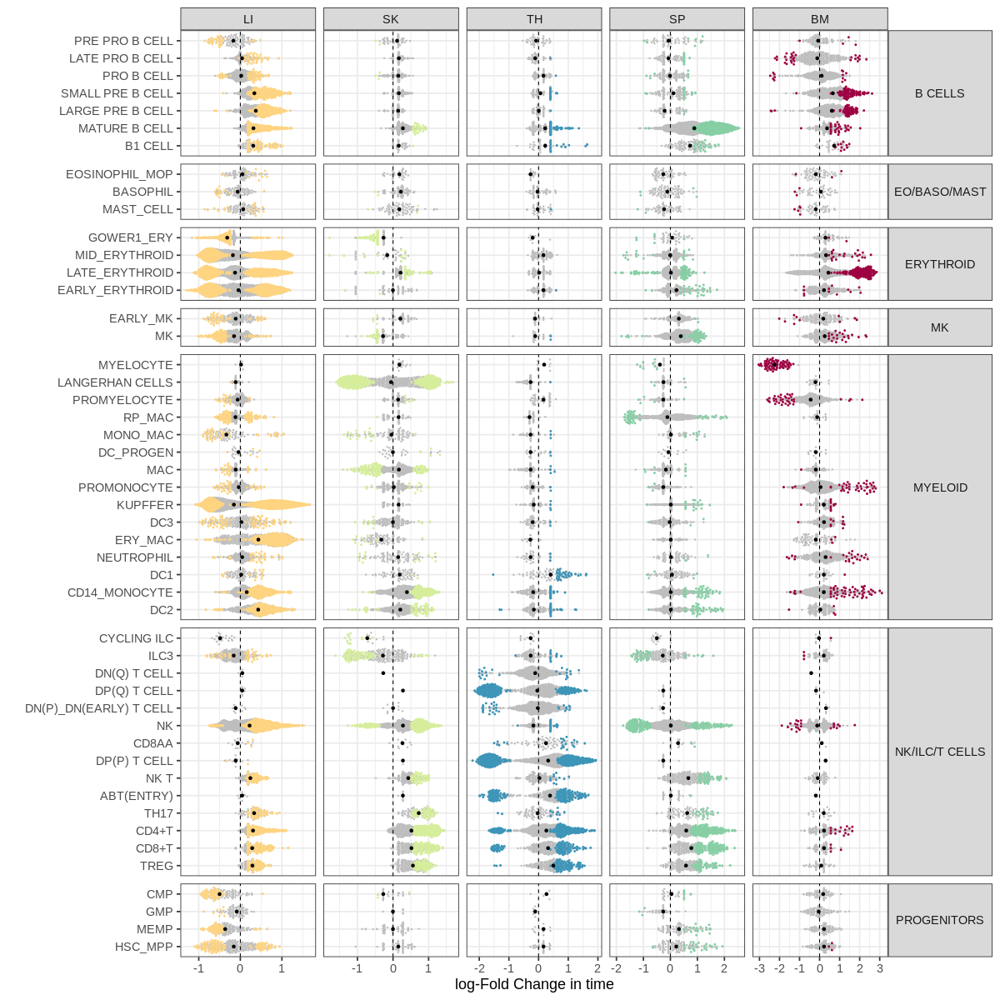

In [49]:
%%R -w 1200 -h 1200 -i figdir
pl_df <- plot_df %>%
    ## Reorder annotation names by median FC
    group_by(nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    mutate(nhood_anno=factor(nhood_anno, levels=unique(nhood_anno))) %>%
    ## Calculate median per organ, to plot
    group_by(organ, nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    filter(!is.na(anno_group))

alpha=0.1
set.seed(12345)
pl1 <- pl_df %>%
    mutate(organ_color=ifelse(SpatialFDR < alpha, as.character(organ), NA)) %>%
    ggplot(aes(nhood_anno, logFC)) +
    geom_quasirandom(size=0.5, color="grey") +
    geom_quasirandom(data=. %>% filter(SpatialFDR < alpha), size=0.7, aes(color=organ_color)) +
    geom_point(data= . %>% distinct(organ, nhood_anno, anno_group, mean_logFC), aes(x=nhood_anno, y=mean_logFC), color="black")  +
    facet_grid(anno_group~organ, scales="free", space="free_y") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) +
    theme(strip.text.y=element_text(angle=0))
    
pl1 +
    ggsave(paste0(figdir, "milo_results_overview_beeswarm.pdf"), width=15, height=15) +
    ggsave(paste0(figdir, "milo_results_overview_beeswarm.png"), width=15, height=15)

Visualize first appearance of cell types in organs

In [50]:
df_ncells = adata.obs.value_counts(["updated_anno","age", "organ", "anno_group"])
# df["n_cells"] = df['age_bins']
# df = df.drop(["updated_anno"],1).reset_index()
df_ncells = df_ncells.reset_index()
df_ncells["n_cells"] = df_ncells[0]
df_ncells["updated_anno"] = df_ncells["updated_anno"].astype("str")

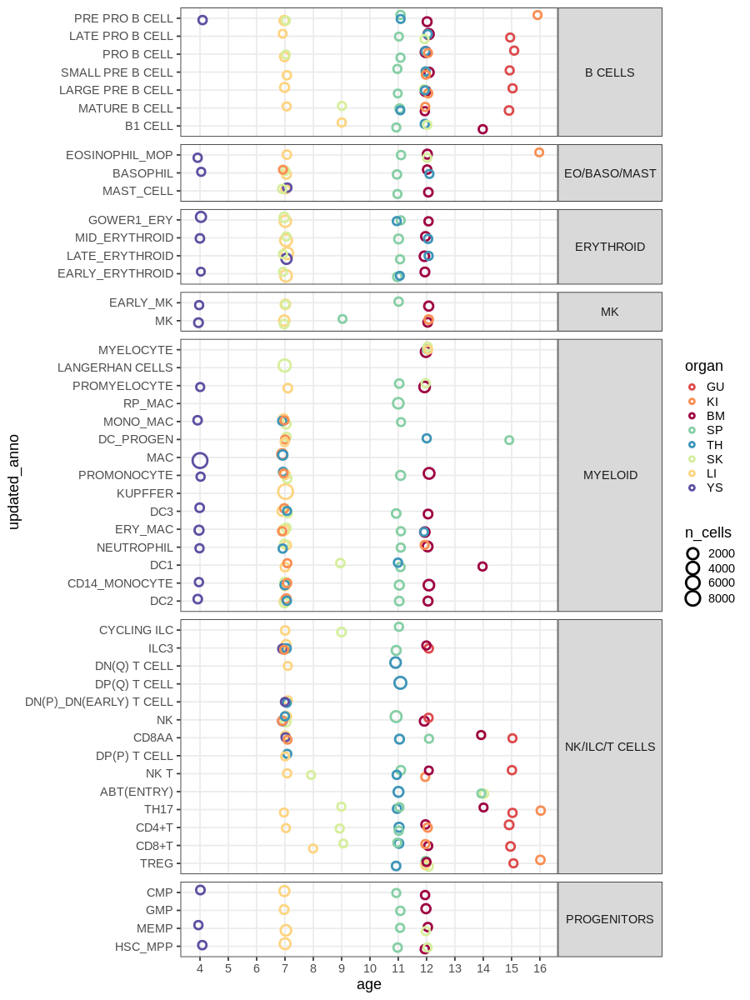

In [51]:
%%R -i df_ncells  -w 900 -h 1200

anno_order <- unique(as.character(pl1$data$nhood_anno))
df_ncells_pl <- df_ncells %>%
    ## Fix some names
    mutate(updated_anno=ifelse(str_detect(updated_anno, "NK$"), "NK", updated_anno)) %>%
    ## Fix organ naming and order 
    mutate(organ=factor(organ, levels=c("YS", "LI", "SK", "TH", "SP", "BM", "MLN", "KI", "GU") %>% rev())) %>%
    filter(n_cells > 10) %>%
    group_by(organ, updated_anno) %>%
    filter(age==min(age)) %>%
    ungroup() %>%
    mutate(updated_anno=factor(updated_anno, levels=anno_order)) %>%
    filter(!is.na(updated_anno)) 

pl_min_age <- df_ncells_pl %>%
#     group_by(anno_group, updated_anno) %>%
#     mutate(min_age = min(age)) %>%
#     ungroup() %>%
#     group_by(anno_group) %>%
#     arrange(- min_age) %>%
#     mutate(updated_anno = factor(updated_anno, levels=unique(updated_anno))) %>%
#     ungroup() %>%
    ggplot(aes( y=age, x=updated_anno, color=organ)) +
    geom_point(width=0.1, aes(size=n_cells), 
               shape=1, stroke=2,
               position = position_jitter(width=0.2, height=0.1)
              ) +
#     geom_linerange(aes(ymax=17, ymin=age), position = position_dodge(.5), size=0.5) +
#     geom_segment(aes(xend=17, yend=updated_anno), position="dodge") +
    coord_flip() +
    facet_grid(anno_group~., scales="free_y", space="free_y") +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    scale_y_continuous(breaks=seq(4,17,by=1)) +
    scale_size(range=c(3,7)) +
    theme_bw(base_size=18) +
    theme(panel.grid.minor=element_blank(), strip.text.y=element_text(angle=0))
    
pl_min_age +
    ggsave(paste0(figdir, "celltype_min_age.pdf"), width=10, height=14) +
    ggsave(paste0(figdir, "celltype_min_age.png"), width=10, height=14)

#### Visualize significant results in heatmaps

In [52]:
# alpha=0.1
# org_fc_signif = org_fc_2.copy()

# org_fc_signif["nhood_anno"] = adata.uns["nhood_adata"].obs["nhood_annotation"]
# org_fc_signif.loc[adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.5, "nhood_anno"] = "Mixed"

# anno_groups_df['nhood_anno'] = anno_groups_df['updated_anno']
# org_fc_signif = pd.merge(org_fc_signif, anno_groups_df, how="left")
# org_fc_signif = org_fc_signif.drop(["updated_anno"], 1)


In [84]:
%%R -h 300 -w 1000 -i org_fc_filtered -i org_fdr_2 -o long_org_fc
alpha=0.1

long_org_fc <- org_fc_filtered %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(nhood_anno, anno_group, Nhood), names_to="organ", values_to="logFC") %>%
    mutate(organ=str_remove(organ, "logFC_")) 
    
long_org_fdr <- org_fdr_2 %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(Nhood), names_to="organ", values_to="SpatialFDR") %>%
    mutate(organ=str_remove(organ, "SpatialFDR_")) 
    
long_org_fc <- long_org_fc %>%
     left_join(long_org_fdr) %>%
    filter(SpatialFDR < alpha)
    
plot_annotation_nhoods <- function(anno){
    long_org_fc %>%
        filter(!is.na(logFC)) %>%
        filter(nhood_anno==anno) %>%
        group_by(Nhood) %>%
        mutate(mean_FC=mean(logFC)) %>%
        ungroup() %>%
        arrange(mean_FC) %>%
        mutate(rank=rank(mean_FC)) %>%
        ggplot(aes(rank, organ, fill=logFC)) +
        geom_tile() +
        scale_fill_gradient2(midpoint=0, high="red", low="blue") +
        xlab("Milo neighbourhoods") +
        theme_classic(base_size=22) +
        theme(axis.text.x = element_blank(), axis.ticks.x = element_blank()) +
        ggtitle(anno)    
}


Joining, by = c("Nhood", "organ")


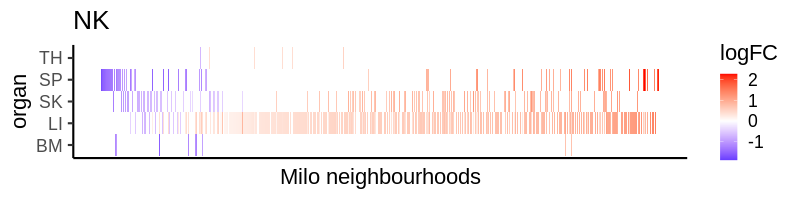

In [85]:
%%R -h 200 -w 800 
plot_annotation_nhoods("NK") 

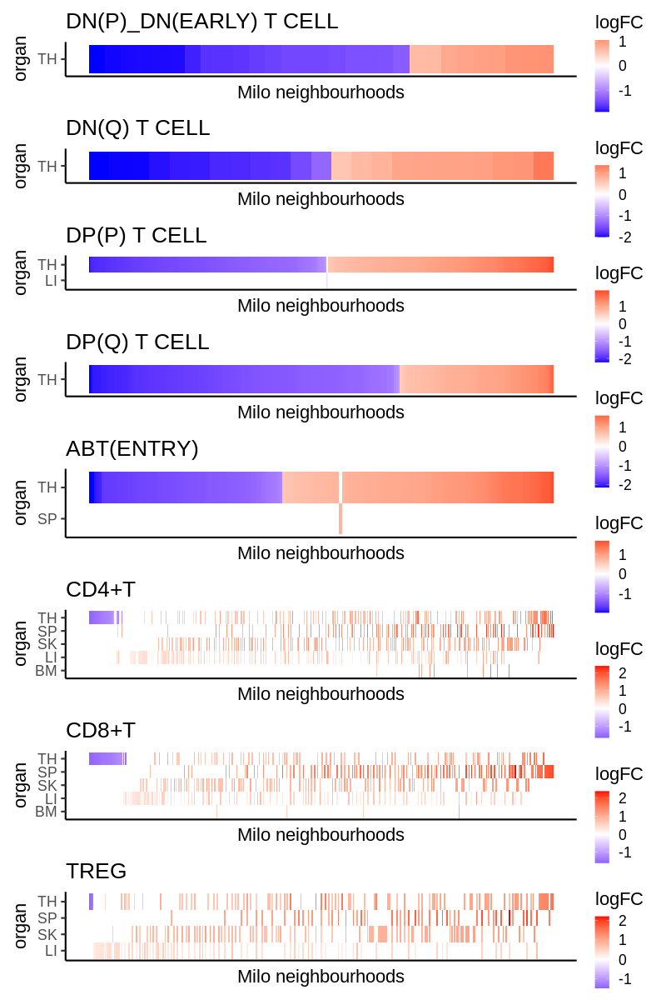

In [277]:
%%R -h 1200 -w 800 
plot_annotation_nhoods("DN(P)_DN(EARLY) T CELL") +
plot_annotation_nhoods("DN(Q) T CELL") +
plot_annotation_nhoods("DP(P) T CELL") +
plot_annotation_nhoods("DP(Q) T CELL") +
plot_annotation_nhoods("ABT(ENTRY)") +
plot_annotation_nhoods("CD4+T") +
plot_annotation_nhoods("CD8+T") +
plot_annotation_nhoods("TREG") +
plot_layout(ncol=1, guides="collect", heights=c(1,1,1,1,2,2,2,2)) +
ggsave(paste0(figdir, "milo_results_hm_allT.png"), width=7, height=12)

### Assign cells to early-late neighbourhoods

1. Group neighbourhoods as significantly early/significantly late and not significant for each lineage
2. Assign cells to neighbourhoods
3. Pseudobulk cells by nhood group and sample: how many cells are ambiguously assigned?
4. DGE test between early and late within same annotation: make design matrix with list of contrasts
5. Validate top markers testing for differential expression across age (use trendSeq)


In [278]:
milopy.utils.build_nhood_graph(adata)

In [279]:
## Add mean expression for each neighbourhood
nhood_adata = adata.uns["nhood_adata"].copy()
X = adata.X
expr_id = "expr" 
## Aggregate over nhoods -- taking the mean
nhoods_X = X.T.dot(adata.obsm["nhoods"])

from scipy.sparse import csr_matrix
nhoods_X = csr_matrix(nhoods_X / adata.obsm["nhoods"].toarray().sum(0))
adata.uns["nhood_adata"].obsm[expr_id] = nhoods_X.T

In [336]:
import rpy2.robjects.pandas2ri
import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import STAP

def _test_lognormal_dge_limma(test_adata):
    r_fct_string = '''
    library(limma)
    perform_lognormal_dge <- function(exprs.data, 
                                      covariate, 
                                      design = "~test_label",
                                      gene.offset=TRUE,
                                      model.contrasts=NULL, 
                                      n.coef=NULL){

        test.model = model.matrix(as.formula(design), data=as.data.frame(covariate))

        if(isTRUE(gene.offset)){
            n.gene <- apply(exprs.data, 2, function(X) sum(X > 0))
            old.col <- colnames(test.model)
            if(all(test.model[, 1] == 1)){
                test.model <- cbind(test.model[, 1], n.gene, test.model[, c(2:ncol(test.model))])
                colnames(test.model) <- c(old.col[1], "NGenes", old.col[c(2:length(old.col))])
            } else{
                test.model <- cbind(n.gene, test.model)
                colnames(test.model) <- c("NGenes", old.col)
            }
        }

        i.fit <- lmFit(exprs.data, test.model)
        if(!is.null(model.contrasts)){
            mod.constrast <- makeContrasts(contrasts=model.contrasts, levels=test.model)
            i.fit <- contrasts.fit(i.fit, contrasts=mod.constrast)
            i.fit <- eBayes(i.fit, trend=TRUE)
            i.res <- as.data.frame(topTreat(i.fit, number = Inf, sort.by = "p", p.value = 1))
        } else{
            i.fit <- eBayes(i.fit, trend=TRUE)
            if(is.null(n.coef)){
                n.coef <- ncol(test.model)
            }

            i.res <- as.data.frame(topTreat(i.fit, coef=ncol(test.model), number = Inf, sort.by = "none", p.value = 1))
        }
        return(data.frame(i.res))
    }
    '''

    r_pkg = STAP(r_fct_string, "r_pkg")

    expr = test_adata.X.toarray()
    covariate = test_adata.obs[["test_label"]]
    gene_names = test_adata.var_names

    # CONVERT PYTHON NUMPY MATRICES TO R OBJECTS
    r_X = map(rpy2.robjects.numpy2ri, expr)
    r_cov = map(rpy2.robjects.pandas2ri, covariate)

    # PASS R OBJECTS INTO FUNCTION (WILL NEED TO EXTRACT DFs FROM RESULT)
    p_res = r_pkg.perform_lognormal_dge(expr.T, covariate)

    results = pd.DataFrame(p_res)
    results.index = gene_names

    return(results.sort_values("adj.P.Val"))

def label_early_and_late_nhoods(long_org_fc, subset_anno, 
                                subset_organ=None,
                                fc_cutoff = 0
                               ):
    if subset_organ is not None:
        keep_nhoods = long_org_fc['nhood_anno'].isin(subset_anno) & long_org_fc['organ'].isin(subset_organ)
    else:
        keep_nhoods = long_org_fc['nhood_anno'].isin(subset_anno)
    ## Take mean fold change across organs
    mean_fc = long_org_fc[keep_nhoods].groupby('Nhood').mean()["logFC"]

    ## Split based on fold-change cutoff
    late_nhoods = mean_fc > fc_cutoff
    early_nhoods = mean_fc < - fc_cutoff
    
    late_ixs = mean_fc.index[late_nhoods]
    early_ixs = mean_fc.index[early_nhoods]

    return(late_ixs, early_ixs, mean_fc)
    

In [337]:
def run_early_late_dge(long_org_fc, 
                       subset_anno,
                       subset_organ=None,
                       min_lfc=0.25,
                       min_n_nhoods=50):

    late,early,_ = label_early_and_late_nhoods(long_org_fc, subset_anno=subset_anno, subset_organ=subset_organ)
    nhood_adata = adata.uns["nhood_adata"].copy()
    anno_nhood_adata = nhood_adata[nhood_adata.obs["nhood_annotation"].isin(subset_anno)]

    test_label = ["early" if int(x) in (early -1 ) else "late" if int(x) in (late - 1) else np.nan for x in anno_nhood_adata.obs_names]
    anno_nhood_adata.obs["test_label"] = pd.Series(test_label).astype("category").values

    X_mat = anno_nhood_adata.obsm["expr"]
    test_adata = anndata.AnnData(X=X_mat, obs=anno_nhood_adata.obs, var=adata.var)
    test_adata = test_adata[~test_adata.obs["test_label"].isna()]

    ## Test differential expression
    dge_limma_df = _test_lognormal_dge_limma(test_adata)

    ## Extract top genes
    top_dge = dge_limma_df[(dge_limma_df['logFC'].abs() > min_lfc) & (dge_limma_df["adj.P.Val"] < 0.01)]

    top_early = top_dge[top_dge.logFC < 0].index
    top_late = top_dge[top_dge.logFC > 0].index
    
    params = {'subset_anno':subset_anno, "subset_organ":subset_organ, "min_lfc":min_lfc, 'min_n_nhoods':min_n_nhoods}
    return(top_early, top_late, params)

Test for DGE in interesting cell types

In [ ]:
import json

query_sets = [
    (["NK"],None), 
    (["ILC3"],None), 
    (["HSC_MPP"], ["LI"]), 
    (["CD4+T", 'CD8+T'], ["TH"]),
    (['TREG'], ["TH"]),
    (['ABT(ENTRY)'], ["TH"]),
    (["DP(Q) T CELL", 'DP(P) T CELL'], ["TH"]),
    (["DN(Q) T CELL", 'DN(P)_DN(EARLY) T CELL'], ["TH"]),
    (["LATE_ERYTHROID", "MID_ERYTHROID", "EARLY_ERYTHROID"], ["LI"])
]

dge_results = []
for anno,org in query_sets:
    print(anno)
    early,late,params = run_early_late_dge(long_org_fc, anno, subset_organ=org, min_lfc=0.5)
    params["early_genes"] = early
    params["late_genes"] = late
    dge_results.append(params)

## Save to json
for i in range(len(dge_results)):
    dge_results[i]["early_genes"] = dge_results[i]["early_genes"].tolist()
    dge_results[i]["late_genes"] = dge_results[i]["late_genes"].tolist()
with open(data_dir + 'tmp/DGE_early_late_nhoods.json', 'w') as fout:
    json.dump(dge_results, fout)

['NK']


Trying to set attribute `.obs` of view, copying.


['ILC3']


Trying to set attribute `.obs` of view, copying.


#### GO enrichment analysis

Prepare

In [27]:
%%R
library(clusterProfiler)
library(msigdbr)

m_df <- msigdbr(species = "Homo sapiens")
m_t2g <- msigdbr(species = "Homo sapiens", category = "C5", subcategory = "BP")  %>% 
  select(gs_name, gene_symbol)

m_t2g_immune <- msigdbr(species = "Homo sapiens", category = "C7", subcategory = "IMMUNESIGDB")  %>% 
  select(gs_name, gene_symbol)

In [67]:
%%R -o m_t2g -o m_t2g_immune
head(m_t2g)
head(m_t2g_immune)

                              gs_name gene_symbol
1 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN       ABCA2
2 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN       ABCC5
3 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN     ABHD14A
4 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN       ACADM
5 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN        ACP5
6 GOLDRATH_EFF_VS_MEMORY_CD8_TCELL_DN        ACP6


In [68]:
m_t2g

,gs_name,gene_symbol
1,GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,ALDH1L1
2,GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,ALDH1L2
3,GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,MTHFD1
4,GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,MTHFD1L
5,GOBP_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS,MTHFD2L
...,...,...
722227,GOBP_ZYMOGEN_INHIBITION,CARD18
722228,GOBP_ZYMOGEN_INHIBITION,CARD8
722229,GOBP_ZYMOGEN_INHIBITION,CAST
722230,GOBP_ZYMOGEN_INHIBITION,CST7


In [98]:
def test_gene_enrichment(dge_res, min_expressing_cells = 20, gene_set='early_genes'):
    from rpy2.robjects.packages import STAP
    ## Get gene set to test
    gs = dge_res[gene_set]

    ## Define universe for enr analysis from cells expressed in annotation/organ subset
    var = adata.var.copy()
    if dge_res['subset_organ'] is None:
        keep_obs = (adata.obs.updated_anno.isin(dge_res["subset_anno"]))
    else:
        keep_obs = (adata.obs.updated_anno.isin(dge_res["subset_anno"])) & (adata.obs.organ.isin(dge_res["subset_organ"]))

    universe = var["GeneName"][np.array((adata[keep_obs].X!=0).sum(0)).ravel() > min_expressing_cells]

    # Run enrichment with msidbr
    r_fct_string = '''
        run_enrichment <- function(gs, universe, m_t2g, fdr_alpha=0.1){
            enr <- enricher(gs, 
                           TERM2GENE=m_t2g, 
                           pAdjustMethod = "fdr", 
                          universe = universe)
            enr_res <- enr@result[enr@result$qvalue < fdr_alpha,]
            return(enr_res)
            }
        '''

    r_pkg = STAP(r_fct_string, "r_pkg")
    enr_res = r_pkg.run_enrichment(gs, universe, m_t2g)

    enr_res["subset_anno"] = ",".join(dge_res["subset_anno"])
    if dge_res['subset_organ'] is None:
            enr_res["subset_organ"] = np.nan
    else:
        enr_res["subset_organ"] = ",".join(dge_res["subset_organ"])
    return(enr_res)

Load DGE results

In [86]:
import json
with open(data_dir + 'tmp/DGE_early_late_nhoods.json', 'r') as fin:
    dge_results = json.load(fin)


In [105]:
enr_results = []
for dge_res in dge_results:
    enr_results.append(test_gene_enrichment(dge_res))

enr_results_late = []
for dge_res in dge_results:
    enr_results_late.append(test_gene_enrichment(dge_res, gene_set="late_genes"))

In [110]:
pd.concat(enr_results).to_csv(data_dir + 'tmp/DGE_early_late_GOenr_early.csv')
pd.concat(enr_results_late).to_csv(data_dir + 'tmp/DGE_early_late_GOenr_late.csv')

In [119]:
enr_results = pd.read_csv(data_dir + 'tmp/DGE_early_late_GOenr_early.csv', index_col=0)
enr_results_late = pd.read_csv(data_dir + 'tmp/DGE_early_late_GOenr_late.csv', index_col=0)

In [228]:

enr_results[(enr_results["subset_anno"] == "CD4+T,CD8+T")][["geneID", "qvalue"]][0:50]
# enr_results[(enr_results["subset_anno"] == "HSC_MPP")][["geneID", "qvalue"]][0:40]
# enr_results_late[(enr_results_late["subset_anno"] == "HSC_MPP")][["geneID", "qvalue"]][0:20]

,geneID,qvalue
GOBP_ATP_METABOLIC_PROCESS,ALDOA/SDHD/ATP6V0C/GPI/MT-ND4L/NDUFA11/NDUFC2/...,1.228064e-16
GOBP_OXIDATIVE_PHOSPHORYLATION,SDHD/MT-ND4L/NDUFA11/NDUFC2/COX6A1/ATP5MC3/ATP...,8.926835e-11
GOBP_NAD_METABOLIC_PROCESS,ALDOA/GPI/PGAM1/PGK1/TPI1/CD38/LDHA/GAPDH/PKM/...,6.269092e-09
GOBP_ATP_SYNTHESIS_COUPLED_ELECTRON_TRANSPORT,SDHD/MT-ND4L/NDUFA11/NDUFC2/COX6A1/COX5A/NDUFA...,1.691064e-08
GOBP_GLYCOLYTIC_PROCESS_THROUGH_FRUCTOSE_6_PHOSPHATE,ALDOA/GPI/PGAM1/PGK1/TPI1/GAPDH/PKM/ENO1,2.314543e-08
GOBP_RESPIRATORY_ELECTRON_TRANSPORT_CHAIN,SDHD/MT-ND4L/NDUFA11/NDUFC2/COX6A1/COX5A/NDUFA...,7.279993e-08
GOBP_GLUCOSE_CATABOLIC_PROCESS,ALDOA/GPI/PGAM1/PGK1/TPI1/GAPDH/PKM/ENO1,1.109028e-07
GOBP_CELLULAR_RESPIRATION,SDHD/MT-ND4L/NDUFA11/NDUFC2/COX6A1/BNIP3/ATP5F...,1.164033e-07
GOBP_NUCLEOTIDE_PHOSPHORYLATION,ALDOA/NME2/GPI/CMPK1/PGAM1/PGK1/TPI1/LDHA/GAPD...,2.165372e-07
GOBP_NUCLEOSIDE_TRIPHOSPHATE_BIOSYNTHETIC_PROCESS,ALDOA/NME2/ATP6V0C/CMPK1/ATP5MC3/ATP5F1D/ATP5M...,3.207999e-07


Trying to set attribute `.obs` of view, copying.
... storing 'Sample.lanes' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Sort_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'updated_anno' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'anno_group' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'orig.ident' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sort.ids' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'origin' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'count' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'total_live_events' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sort_sample_id' as categorical


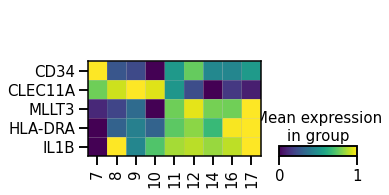

In [214]:

keep_obs = (adata.obs.updated_anno.isin(["HSC_MPP"])) & (adata.obs.organ.isin(["LI"]))

sns.set_context("talk")
sc.pl.matrixplot(adata[keep_obs], ["CD34", "CLEC11A", "MLLT3", "HLA-DRA", "IL1B"], groupby="age", swap_axes=True, 
                 standard_scale="var"
                );

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Tight lay

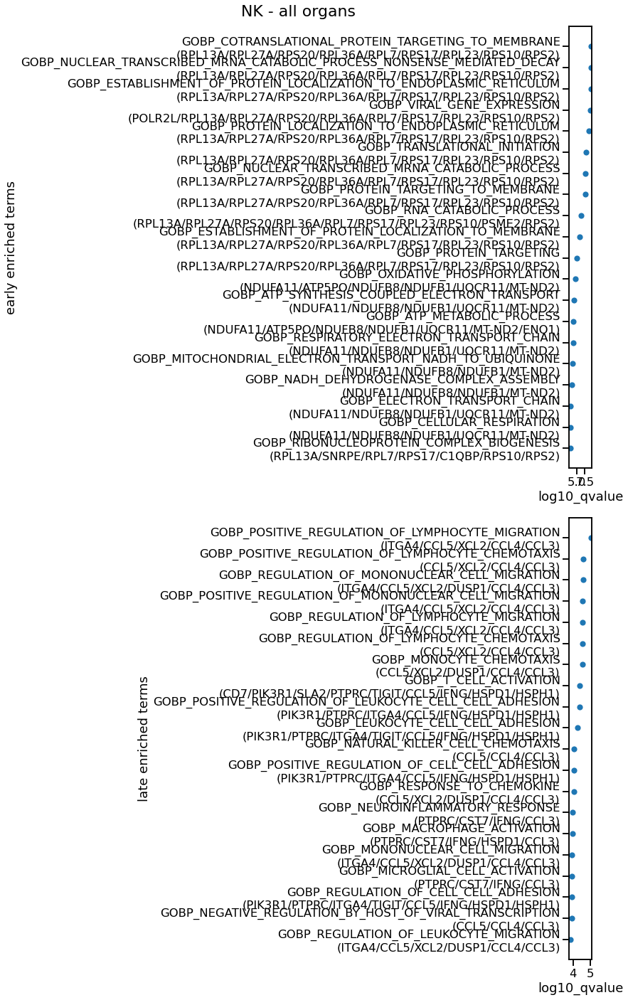

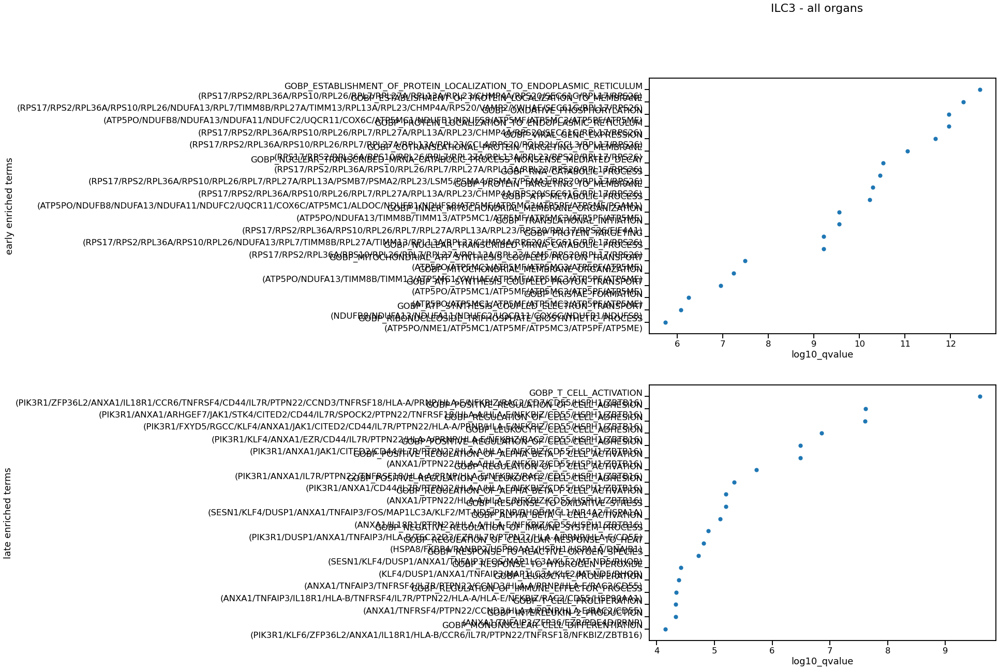

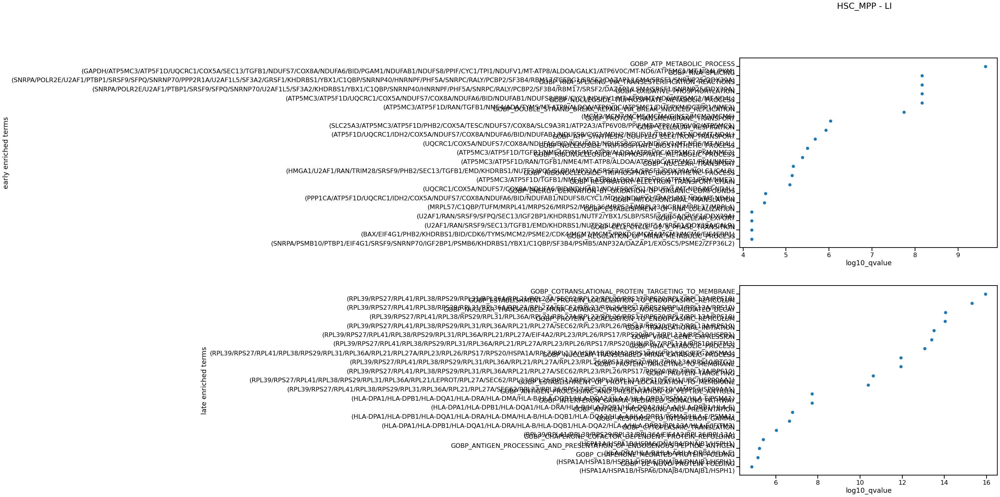

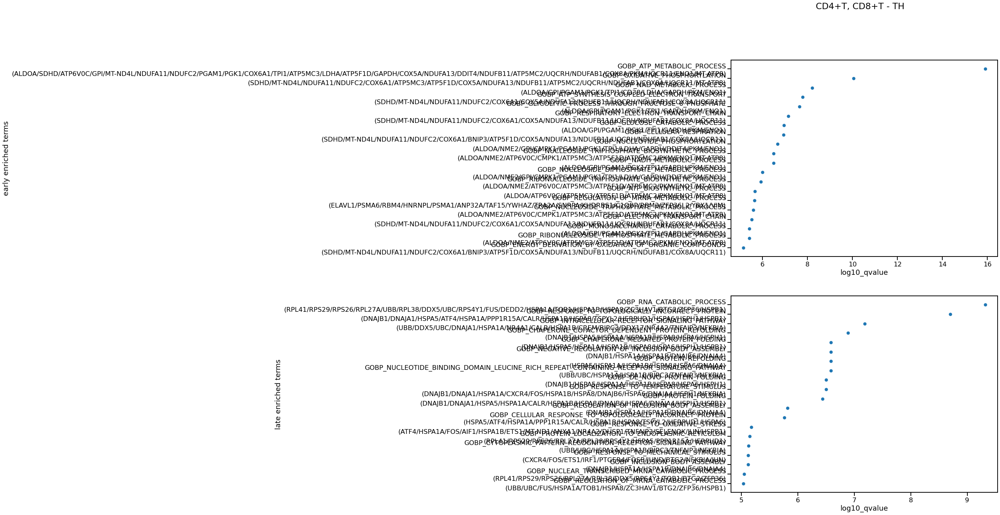

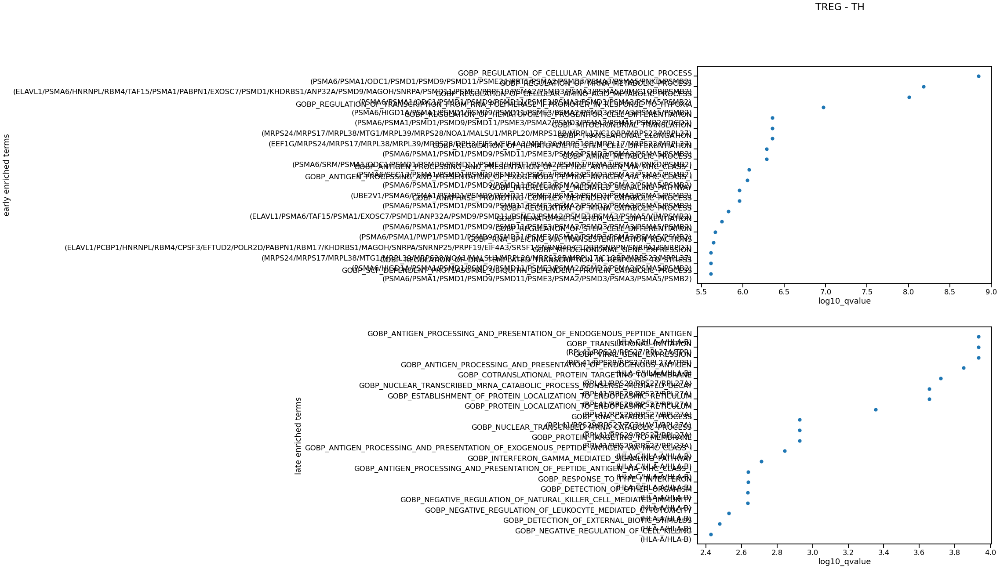

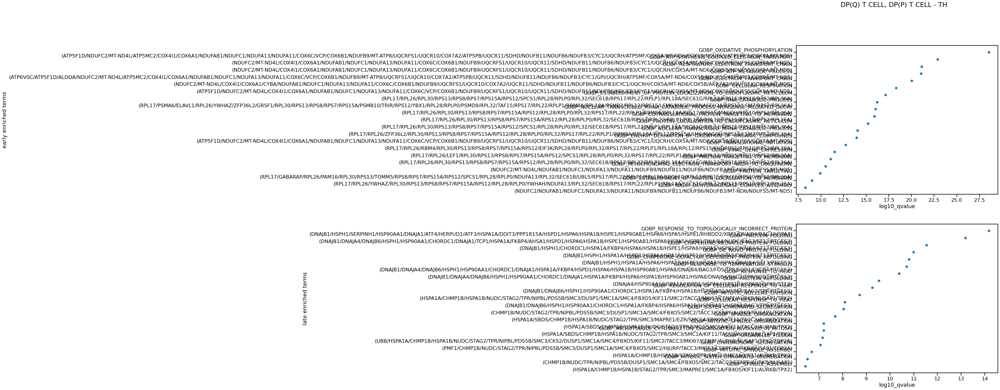

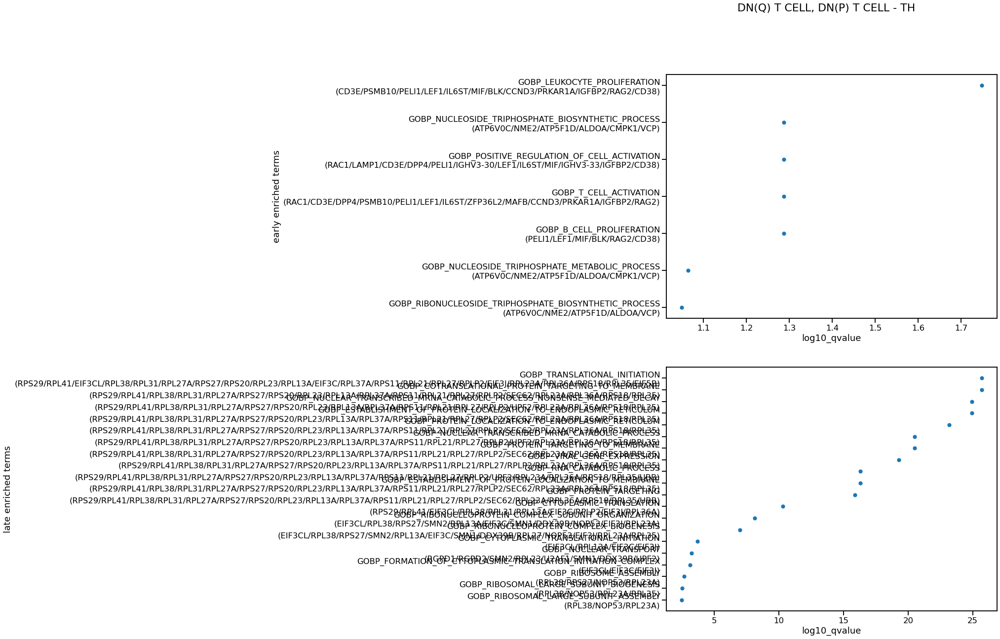

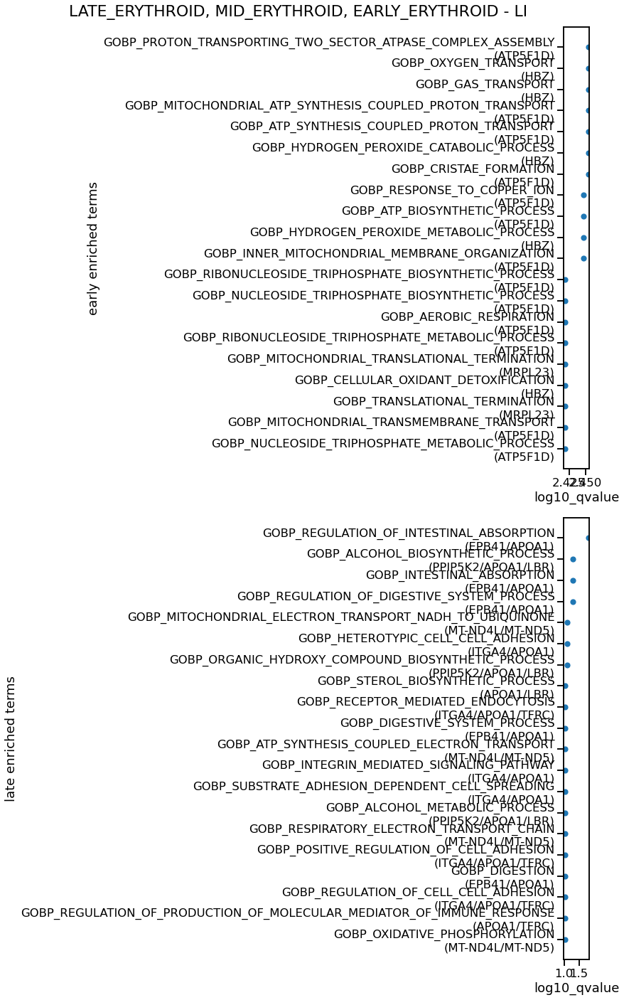

In [161]:
max_n_terms=20

for dge_res in dge_results:
    if dge_res['subset_organ'] is None:
        plot_title = ', '.join(dge_res["subset_anno"]) + " - all organs"
    else:
        plot_title = ', '.join(dge_res["subset_anno"]) + " - " + ', '.join(dge_res["subset_organ"])

    plt.rcParams['figure.figsize'] = [15,20]
    fig, ax = plt.subplots(2,1, figsize=(12,max_n_terms))
    if dge_res['subset_organ'] is not None:
        subset_enr_res = enr_results[(enr_results["subset_anno"] == ",".join(dge_res["subset_anno"])) & (enr_results["subset_organ"] == ",".join(dge_res["subset_organ"]))].copy()
    else:
        subset_enr_res = enr_results[(enr_results["subset_anno"] == ",".join(dge_res["subset_anno"]))].copy()
    subset_enr_res['label'] = subset_enr_res["ID"] + "\n(" +  subset_enr_res.geneID + ")"
    subset_enr_res['log10_qvalue'] =  - np.log10(subset_enr_res["qvalue"])
    sns.scatterplot(data=subset_enr_res[0:max_n_terms], x='log10_qvalue', y="label", ax=ax[0]);
    ax[0].set_ylabel("early enriched terms");
    if dge_res['subset_organ'] is not None:
        subset_enr_res = enr_results_late[(enr_results_late["subset_anno"] == ",".join(dge_res["subset_anno"])) & (enr_results_late["subset_organ"] == ",".join(dge_res["subset_organ"]))].copy()
    else:
        subset_enr_res = enr_results_late[(enr_results_late["subset_anno"] == ",".join(dge_res["subset_anno"]))].copy()
    subset_enr_res['label'] = subset_enr_res["ID"] + "\n(" +  subset_enr_res.geneID + ")"
    subset_enr_res['log10_qvalue'] =  - np.log10(subset_enr_res["qvalue"])
    sns.scatterplot(data=subset_enr_res[0:max_n_terms], x='log10_qvalue', y="label", ax=ax[1]);
    ax[1].set_ylabel("late enriched terms");
    fig.suptitle(plot_title, fontsize=22)
    plt.tight_layout();
    plt.savefig(figdir + "DGE_GO_enrichment_" + dge_res["subset_anno"][0] + ".png", bbox_inches="tight");
    plt.savefig(figdir + "DGE_GO_enrichment_" + dge_res["subset_anno"][0] + ".pdf", bbox_inches="tight");
    # plt.plot(subset_enr_res["qvalue"],'.')



### Visualize expression of DE genes in time

In [103]:
adata.obs["age"] = adata.obs["age"].astype("category")

In [90]:
dge_res = dge_results[1]

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1229: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Sample.lanes' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Sort_id' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'updated_anno' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'anno_group' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'orig.ident' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sort.ids' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'origin' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'count' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'total_live_events' as

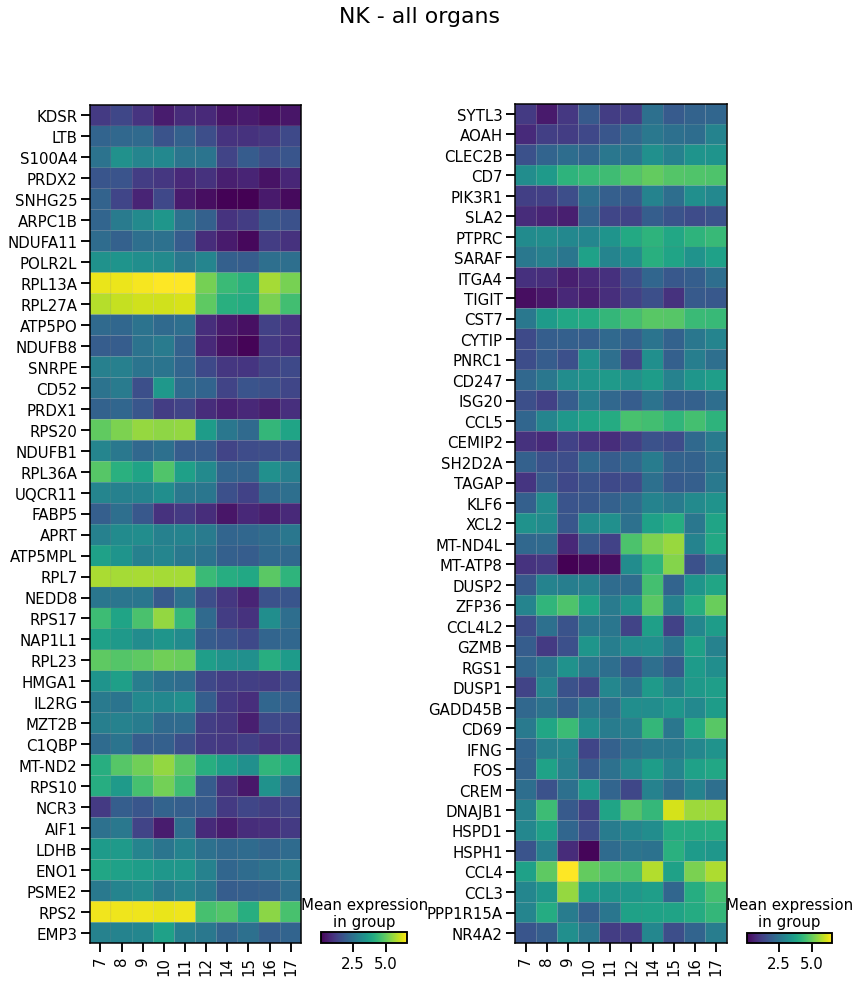

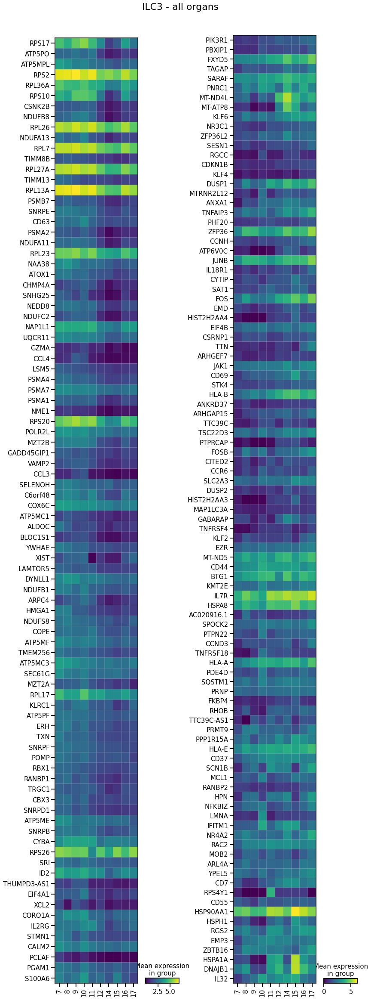

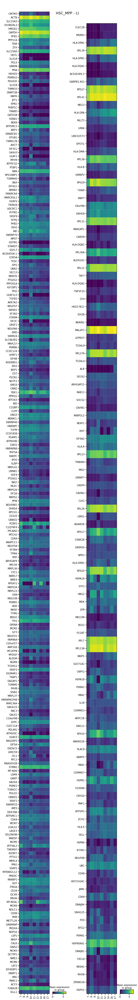

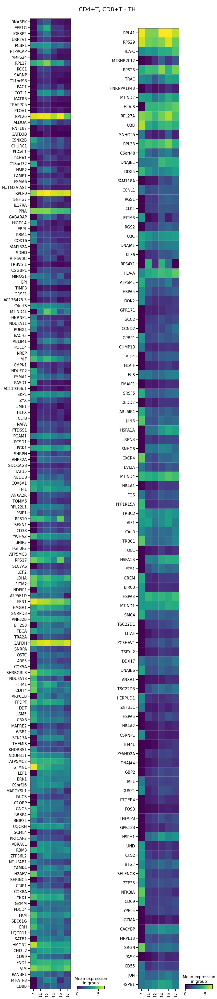

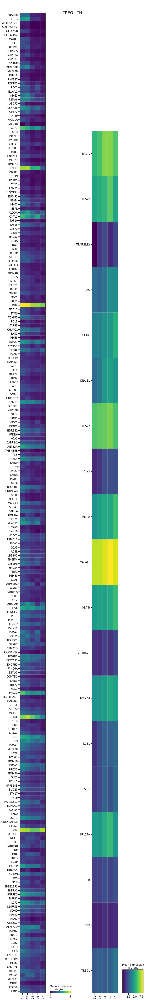

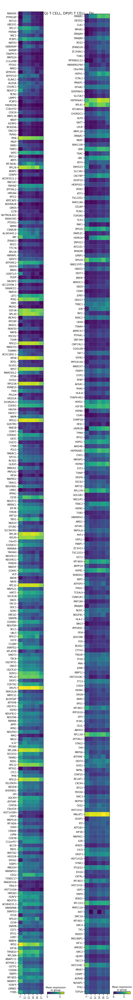

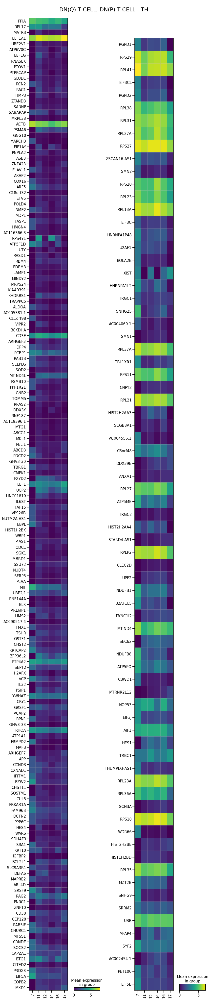

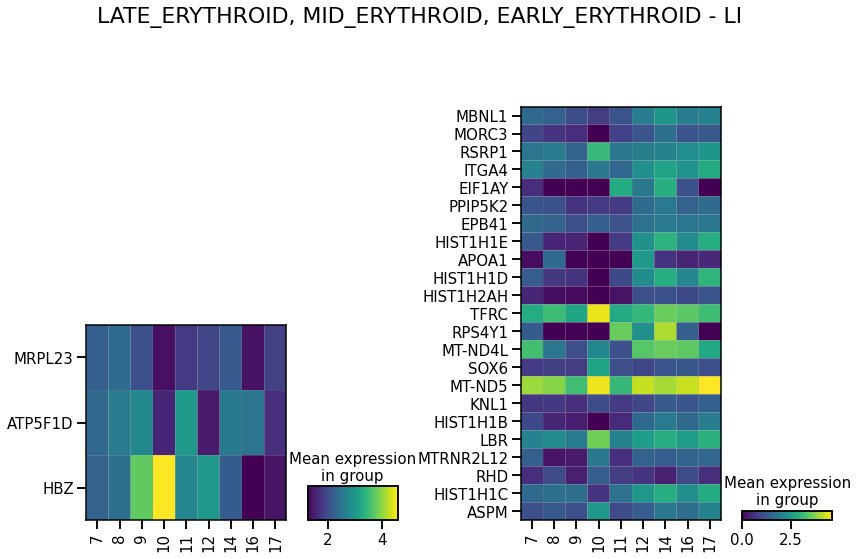

In [118]:
for dge_res in dge_results:
    if dge_res['subset_organ'] is None:
        keep_obs = (adata.obs.updated_anno.isin(dge_res["subset_anno"]))
        plot_title = ', '.join(dge_res["subset_anno"]) + " - all organs"
    else:
        keep_obs = (adata.obs.updated_anno.isin(dge_res["subset_anno"])) & (adata.obs.organ.isin(dge_res["subset_organ"]))
        plot_title = ', '.join(dge_res["subset_anno"]) + " - " + ', '.join(dge_res["subset_organ"])

    sns.set_context("talk")
    max_n_genes = max(len(dge_res["late_genes"]),len(dge_res["early_genes"]))
    fig, ax = plt.subplots(1,2, figsize=(12,round(max_n_genes/3)))
    sc.pl.matrixplot(adata[keep_obs], dge_res["early_genes"], groupby="age", swap_axes=True, ax=ax[0], show=False);
    sc.pl.matrixplot(adata[keep_obs], dge_res["late_genes"], groupby="age", swap_axes=True,  ax=ax[1], show=False);
    fig.suptitle(plot_title, fontsize=22)
    plt.tight_layout()
    plt.savefig(figdir + "DGE_expression_" + dge_res["subset_anno"][0] + ".png");
    plt.savefig(figdir + "DGE_expression_" + dge_res["subset_anno"][0] + ".pdf");

    

In [169]:
subset_annos_ls = [i["subset_anno"] for i in dge_results]

In [184]:
%%R -i subset_annos_ls -w 800 -h 300 -i figdir
for (i in subset_annos_ls){
    pl_ls <- lapply(i, function(x) plot_annotation_nhoods(x))
    wrap_plots(pl_ls) +
    plot_layout(ncol=1) +
    ggsave(paste0(figdir ,"milo_results_hm_" , i[[1]] , ".png"), width=8, height=3*length(i)) +
    ggsave(paste0(figdir , "milo_results_hm_" , i[[1]] , ".pdf"), width=8, height=3*length(i))
}

#  

Notable:
- TREG: early upregulation of GNG10, putative target of FOXP3 and upregulated in fetal Tregs compared to adult,
- HSCs: genes related to DNA replication, response to IL12, B cell activation, TGFB1 is upregulated (https://www.sciencedirect.com/science/article/pii/S0006497120315731?via%3Dihub, https://cshperspectives.cshlp.org/content/9/9/a027987.full) 

In [284]:
[x["subset_anno"] for x in dge_results[3:7]]

[['CD4+T', 'CD8+T'],
 ['TREG'],
 ['DP(Q) T CELL', 'DP(P) T CELL'],
 ['DN(Q) T CELL', 'DN(P) T CELL']]

In [317]:
## Intersect TH early genes
early_T_dict = {','.join(x["subset_anno"]):set(x["early_genes"]) for x in dge_results[3:7]}
early_T_ls = [x["early_genes"] for x in dge_results[3:7]]
early_T_ls_names = [','.join(x["subset_anno"]) for x in dge_results[3:7]]
# set.intersection(*early_T_ls)
anno_pairs = list(itertools.permutations([x for x in early_T_dict.keys()], 2))
for p in anno_pairs:
    int_genes = set.intersection(early_T_dict[p[0]], early_T_dict[p[1]])
    print(len(int_genes))

62
100
50
62
91
48
100
91
88
50
48
88


In [318]:
%%R
library('UpSetR')

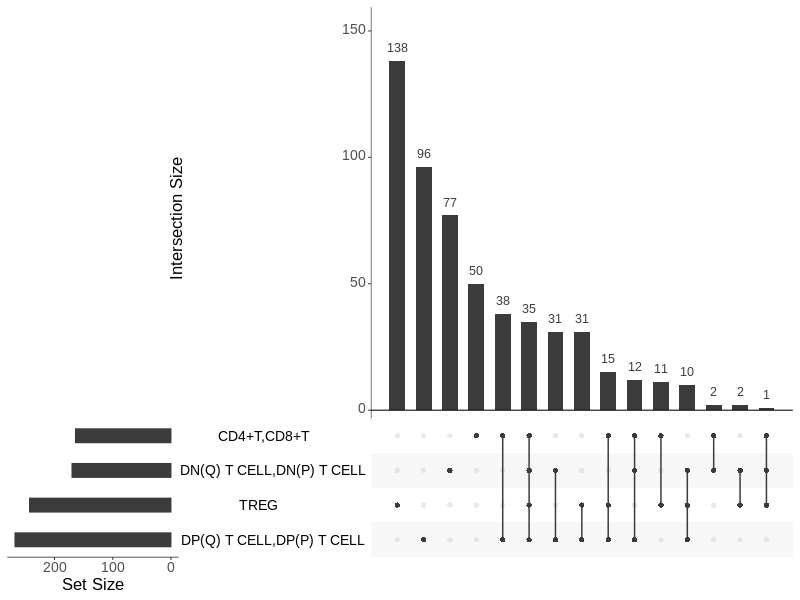

In [333]:
%%R -i early_T_ls -i early_T_ls_names -w 800 -h 600
early_T_ls <- setNames(early_T_ls, early_T_ls_names)
upset(fromList(early_T_ls), order.by = "freq", text.scale = c(2,2, 2, 2, 2, 2))

## Save outputs

In [601]:
## Save anndata with milo outputs
# adata.write_h5ad(data_dir + "milo_anndata_{s}_02072021.h5ad".format(s=split))

## Save test results
org_fc_2.to_csv(data_dir + "milo_logFC_{s}_02072021.csv".format(s=split))
org_fdr_2.to_csv(data_dir + "milo_SpatialFDR_{s}_02072021.csv".format(s=split))

In [77]:
org_fc_2 = pd.read_csv(data_dir + "milo_logFC_{s}_02072021.csv".format(s=split), index_col=0)
org_fdr_2 = pd.read_csv(data_dir + "milo_SpatialFDR_{s}_02072021.csv".format(s=split), index_col=0)

org_fc_2.index = org_fc_2.index.astype("str")
org_fdr_2.index = org_fdr_2.index.astype("str")

---

In [345]:
%%R 
perform_lognormal_dge <- function(exprs.data, 
                                  test.model, 
                                  gene.offset=TRUE,
                                  model.contrasts=NULL, 
                                  n.coef=NULL){

    if(isTRUE(gene.offset)){
        n.gene <- apply(exprs.data, 2, function(X) sum(X > 0))
        old.col <- colnames(test.model)
        if(all(test.model[, 1] == 1)){
            test.model <- cbind(test.model[, 1], n.gene, test.model[, c(2:ncol(test.model))])
            colnames(test.model) <- c(old.col[1], "NGenes", old.col[c(2:length(old.col))])
        } else{
            test.model <- cbind(n.gene, test.model)
            colnames(test.model) <- c("NGenes", old.col)
        }
    }

    i.fit <- lmFit(exprs.data, test.model)
    if(!is.null(model.contrasts)){
        mod.constrast <- makeContrasts(contrasts=model.contrasts, levels=test.model)
        i.fit <- contrasts.fit(i.fit, contrasts=mod.constrast)
        i.fit <- eBayes(i.fit, trend=TRUE)
        i.res <- as.data.frame(topTreat(i.fit, number = Inf, sort.by = "p", p.value = 1))
    } else{
        i.fit <- eBayes(i.fit, trend=TRUE)
        if(is.null(n.coef)){
            n.coef <- ncol(test.model)
        }

        i.res <- as.data.frame(topTreat(i.fit, coef=ncol(test.model), number = Inf, sort.by = "p", p.value = 1))
    }
    return(i.res)
}

In [390]:
%%R -i covariate -i expr -i gene_names
design = "~test_label"
mod_mat = model.matrix(as.formula(design), data=as.data.frame(covariate))


colnames(expr) <- gene_names

results <- perform_lognormal_dge(t(expr), mod_mat)

In [400]:
%%R
head(rownames(results[results$logFC < 0,]), 40)
# head(rownames(results), 50)

 [1] "AC004585.1" "KDSR"       "LTB"        "S100A4"     "PRDX2"     
 [6] "LST1"       "SNHG25"     "MT1X"       "TMEM14B"    "ARPC1B"    
[11] "NDUFA11"    "TSPAN4"     "POLR2L"     "RPLP2"      "CCR7"      
[16] "NME1"       "RPL13A"     "DNPH1"      "IGFBP4"     "RPL27A"    
[21] "MRPL12"     "ATOX1"      "DMAC1"      "RPL35"      "RPL10A"    
[26] "ATP5PO"     "RPL37A"     "NAA10"      "NDUFB8"     "RPL15"     
[31] "SNRPE"      "MRPL23"     "RPL4"       "RPL21"      "TIMM13"    
[36] "NDUFC2"     "RPL23A"     "CD52"       "MINOS1"     "PRAM1"     


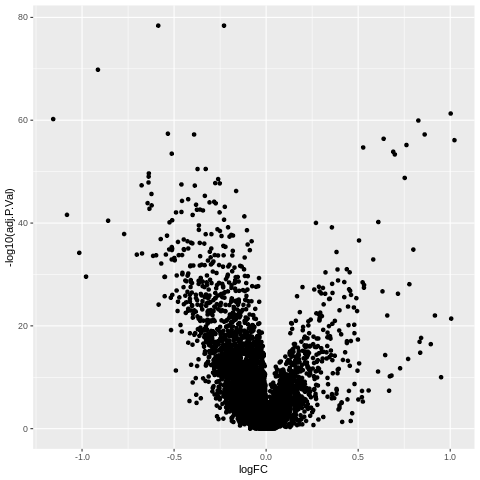

In [395]:
%%R 
ggplot(results, aes(logFC, -log10(adj.P.Val))) + 
    geom_point()

In [195]:

# if (len(early) > min_n_nhoods) & (len(late) > min_n_nhoods):
## Get cells in nhoods

early_cells = (adata.obsm["nhoods"][:, early_ixs - 1].toarray().sum(1)!=0).astype("int")
late_cells = (adata.obsm["nhoods"][:, late_ixs - 1].toarray().sum(1)!=0).astype("int")

In [205]:
np.where((late_cells == 1) & (early_cells ==1 ))[0].shape

(2176,)

In [106]:
signif_nhoods = long_org_fc.Nhood[long_org_fc['nhood_anno'] == anno].unique() - 1
anno_nhood_adata = nhood_adata[signif_nhoods]

In [107]:
anno_nhood_adata.obsp["nhood_connectivities"]

<1080x1080 sparse matrix of type '<class 'numpy.float32'>'
	with 30892 stored elements in Compressed Sparse Column format>

In [108]:

sc.tl.louvain(anno_nhood_adata, neighbors_key="nhood",resolution=0.5)

Trying to set attribute `.obs` of view, copying.


In [109]:
sc.tl.draw_graph(anno_nhood_adata, neighbors_key="nhood")

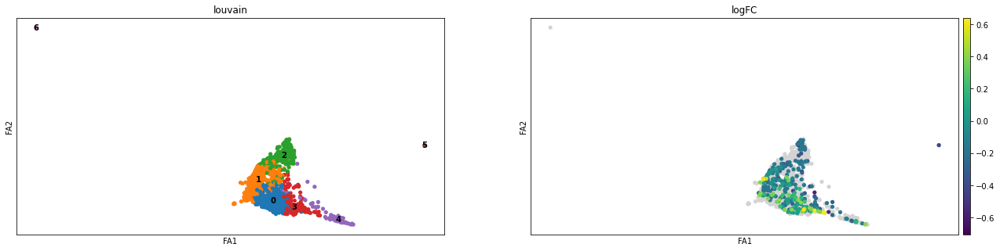

In [113]:
sc.pl.draw_graph(anno_nhood_adata, color=["louvain", "logFC"], legend_loc="on data")

---
---

# Junk n snippets

## Different ways of testing for differential abundance accounting for FACS

1. Test on corrected counts
2. Test using the avg correction per sample as a confounding covariate
3. Testing on donors instead of samples

### (1) Test on corrected counts

In [1441]:
milopy.utils.add_covariate_to_nhoods_var(adata,["parent_Multiplier", "sort.ids", 'donor', 'sort_sample_id', "Sort_id"])
nhood_adata = adata.uns["nhood_adata"].copy()
# ## Keep only samples with CD45+/CD45- ratio information
# nhood_adata = nhood_adata[:,nhood_adata.var["sort.ids"].isin(["CD45+", "CD45-"])]
# ## Exclude neighbourhoods that are empty after filtering
# nhood_adata = nhood_adata[nhood_adata.X.sum(1) > 0]

In [ ]:
## Apply correction
X_counts = nhood_adata.X.toarray()
adata.obs["n_sort"] = adata.obs["sort_sample_id"].astype("str") + "_" + adata.obs["sort.ids"].astype("str")
nhood_adata.var["n_sort"] = nhood_adata.var["sort_sample_id"].astype("str") + "_" + nhood_adata.var["sort.ids"].astype("str")
sum_i_c_n = adata.obs["n_sort"].value_counts()[nhood_adata.var["n_sort"]].values
p = nhood_adata.var["parent_Multiplier"].astype("float").values
sum_S = adata.obs["sort_sample_id"].value_counts()[nhood_adata.var["sort_sample_id"]].values
X_counts_corrected = ((X_counts/sum_i_c_n) * p * sum_S)
X_correction_delta = X_counts - X_counts_corrected

## Save in adata layers
nhood_adata.layers["X_counts_corrected"] = X_counts_corrected
nhood_adata.layers["X_correction_delta"] = X_counts - X_counts_corrected

nhood_adata.layers["X_counts"] = nhood_adata.X
nhood_adata.X = scipy.sparse.csr_matrix(nhood_adata.layers["X_counts_corrected"].astype("int"))
adata.uns["nhood_adata"] = nhood_adata.copy()

new_ixs = adata.obs_names[adata.obs["nhood_ixs_refined"]==1][nhood_adata.obs_names.astype("int")]
adata.obs["nhood_ixs_refined"] = [1 if x in new_ixs else 0 for x in adata.obs_names]

adata.obsm["nhoods"] = adata.obsm["nhoods"][:,nhood_adata.obs_names.astype("int")]

In [1434]:
def _FACS_correct_counts(adata):
    milopy.utils.add_covariate_to_nhoods_var(adata,["parent_Multiplier", "sort.ids", 'donor', 'sort_sample_id'])
    nhood_adata = adata.uns["nhood_adata"].copy()
    ## Keep only samples with CD45+/CD45- ratio information
    nhood_adata = nhood_adata[:,nhood_adata.var["sort.ids"].isin(["CD45+", "CD45-"])]
    ## Exclude neighbourhoods that are empty after filtering
    nhood_adata = nhood_adata[nhood_adata.X.sum(1) > 0]
    ## Apply correction
    X_counts = nhood_adata.X.toarray()
    adata.obs["n_sort"] = adata.obs["sort_sample_id"].astype("str") + "_" + adata.obs["sort.ids"].astype("str")
    nhood_adata.var["n_sort"] = nhood_adata.var["sort_sample_id"].astype("str") + "_" + nhood_adata.var["sort.ids"].astype("str")
    sum_i_c_n = adata.obs["n_sort"].value_counts()[nhood_adata.var["n_sort"]].values
    p = nhood_adata.var["parent_Multiplier"].astype("float").values
    sum_S = adata.obs["sort_sample_id"].value_counts()[nhood_adata.var["sort_sample_id"]].values
    X_counts_corrected = ((X_counts/sum_i_c_n) * p * sum_S)
    X_correction_delta = X_counts - X_counts_corrected

    ## Save in adata layers
    nhood_adata.layers["X_counts_corrected"] = X_counts_corrected
    nhood_adata.layers["X_correction_delta"] = X_counts - X_counts_corrected

    nhood_adata.layers["X_counts"] = nhood_adata.X
    nhood_adata.X = scipy.sparse.csr_matrix(nhood_adata.layers["X_counts_corrected"].astype("int"))
    adata.uns["nhood_adata"] = nhood_adata.copy()

    new_ixs = adata.obs_names[adata.obs["nhood_ixs_refined"]==1][nhood_adata.obs_names.astype("int")]
    adata.obs["nhood_ixs_refined"] = [1 if x in new_ixs else 0 for x in adata.obs_names]

    adata.obsm["nhoods"] = adata.obsm["nhoods"][:,nhood_adata.obs_names.astype("int")]
    return(adata)

#     return(count_correction_fact)

import milopy.core as milo
def _milo_test_by_organ(adata, design="~ Sort_id + age_bins", sample_col="Sample.lanes"):
    ## Keep organs covering at least two time-points
    df = adata.obs[["organ",sample_col, "age_bins"]].drop_duplicates()
    df = df.groupby(["organ","age_bins"]).count().reset_index().pivot("organ",columns="age_bins")
    sampled_organs = df.index[(df > 0).sum(1) > 2]

    ## Calculate logFC and SpatialFDR within each organ
    milo_res_dict = {}
    for org in sampled_organs:
        print(org)
#         org_samples = adata.obs[adata.obs["organ"] == org][sample_col].unique()
        ## Exclude age bins with less than 2 donors/samples
        count_bins = adata.obs[adata.obs["organ"] == org][[sample_col,'age_bins']].drop_duplicates().value_counts('age_bins')
        keep_bins = count_bins.index[count_bins > 1]
        org_samples = adata.obs[(adata.obs["organ"] == org) & (adata.obs["age_bins"].isin(keep_bins))][sample_col].unique()
        if len(keep_bins) > 1:
            milo.DA_nhoods(adata, design=design, subset_samples=org_samples)
            milo_res_dict[org] = adata.uns["nhood_adata"].obs.copy()

    ## Collapse results
    logFC_df_ls = [v["logFC"] for k,v in milo_res_dict.items()]
    for k,v in milo_res_dict.items():
        milo_res_dict[k]["logFC_" + k] = milo_res_dict[k]["logFC"].copy()
        milo_res_dict[k]["FDR_" + k] = milo_res_dict[k]["FDR"].copy()
        milo_res_dict[k].loc[milo_res_dict[k]["FDR"] > 0.1, "logFC_" + k] = np.nan

    org_fc = pd.concat([v[["logFC_" + k]] for k,v in milo_res_dict.items()], 1)
    org_fdr = pd.concat([v[["FDR_" + k]] for k,v in milo_res_dict.items()], 1)
    
#     ## Add annotation
#     annotate_nhoods(adata, anno_col="updated_anno")
#     org_fc["nhood_anno"] = adata.uns["nhood_adata"].obs["nhood_annotation"]

#     anno_groups_df['nhood_anno'] = anno_groups_df['updated_anno']
#     org_fc = pd.merge(org_fc, anno_groups_df, how="left")
#     org_fc = org_fc.drop(["updated_anno"], 1)
    return(milo_res_dict, org_fc, org_fdr)

In [1460]:
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


ValueError: Found array with 0 sample(s) (shape=(0, 20)) while a minimum of 1 is required by check_pairwise_arrays.

In [ ]:
milo.count_nhoods(adata, sample_col="Sample.lanes")

In [1272]:
adata = _FACS_correct_counts(adata)

Trying to set attribute `.var` of view, copying.


In [636]:
adata.uns['nhood_adata'].X = scipy.sparse.csr_matrix(adata.uns['nhood_adata'].layers["X_counts_corrected"].astype("int"))

In [637]:
milo_res_1, org_fc_1, org_fdr_1 = _milo_test_by_organ(adata)

BM


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


KI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


LI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


SK


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


SP


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


TH


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


In [591]:
milopy.utils.add_covariate_to_nhoods_var(adata, ["organ"])

In [592]:
signif_nhoods_1 = ~org_fc_1["logFC_SK"].isna()

In [593]:
nhoods_sk_corrected = adata.uns["nhood_adata"].layers["X_counts_corrected"][:,adata.uns["nhood_adata"].var["organ"] == "SK"]
nhoods_sk_counts = adata.uns["nhood_adata"].layers["X_counts"][:,adata.uns["nhood_adata"].var["organ"] == "SK"].toarray()

plt.rcParams["figure.figsize"] = [10,10]
sns.heatmap(nhoods_sk_corrected[~signif_nhoods_1,:]);
plt.show();
sns.heatmap(nhoods_sk_corrected[signif_nhoods_1,:])


AttributeError: 'numpy.ndarray' object has no attribute 'toarray'

In [285]:
## Filter
org_fc_filtered = org_fc.copy() 
org_fc_filtered[org_fdr > 0.01] = np.nan

In [224]:
%%R -i org_fc_filtered -h 1000 -w 800
library(tidyverse)
long_org_fc <- org_fc_filtered %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(nhood_anno, anno_group, Nhood), names_to="organ", values_to="logFC")
    
plot_df <- long_org_fc %>%
    filter(!is.na(logFC)) %>%
    filter(nhood_anno!="nan") %>%
    ## Fix organ naming and order 
    mutate(organ=str_remove(organ, "logFC_")) %>%
    mutate(organ=factor(organ, levels=c("YS", "LI", "SK", "TH", "SP", "BM", "MLN", "KI", "GU"))) %>%
    ## Fix some names
    mutate(nhood_anno=ifelse(str_detect(nhood_anno, "NK$"), "NK", nhood_anno)) %>%
    ## Reorder by fold-change 
    group_by(organ, nhood_anno, Nhood) %>%
    mutate(mean_logFC = mean(logFC)) %>%
    ungroup() %>%
    group_by(organ, nhood_anno) %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    mutate(Nhood=factor(Nhood, levels=unique(Nhood))) %>%
    group_by(nhood_anno) %>%
    filter(length(unique(Nhood)) > 20) %>%
    ungroup()


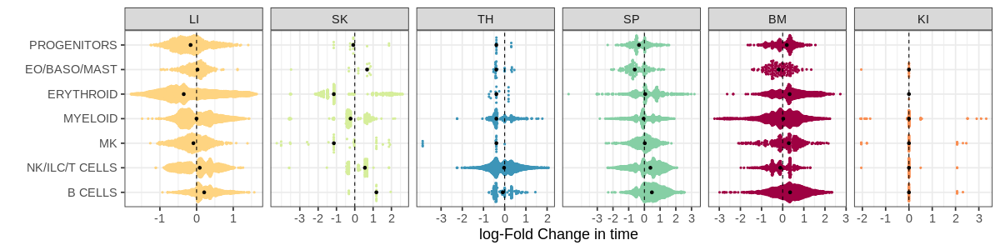

In [232]:
%%R -w 1200 -h 300 
library(ggbeeswarm)
organ_colors_df <- read.csv("~/Pan_fetal_immune/metadata/organ_colors.csv")
organ_palette <- setNames(organ_colors_df$color, organ_colors_df$organ)

plot_df %>%
filter(!is.na(anno_group)) %>%
    group_by(anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(anno_group=factor(anno_group, levels=unique(anno_group))) %>%
    ggplot(aes(anno_group, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, anno_group, mean_logFC), aes(x=anno_group, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 
#     ggsave(paste0(figdir, "milo_results_overview.png"), height=4, width=15) +
#     ggsave(paste0(figdir, "milo_results_overview.pdf"), height=4, width=15) 

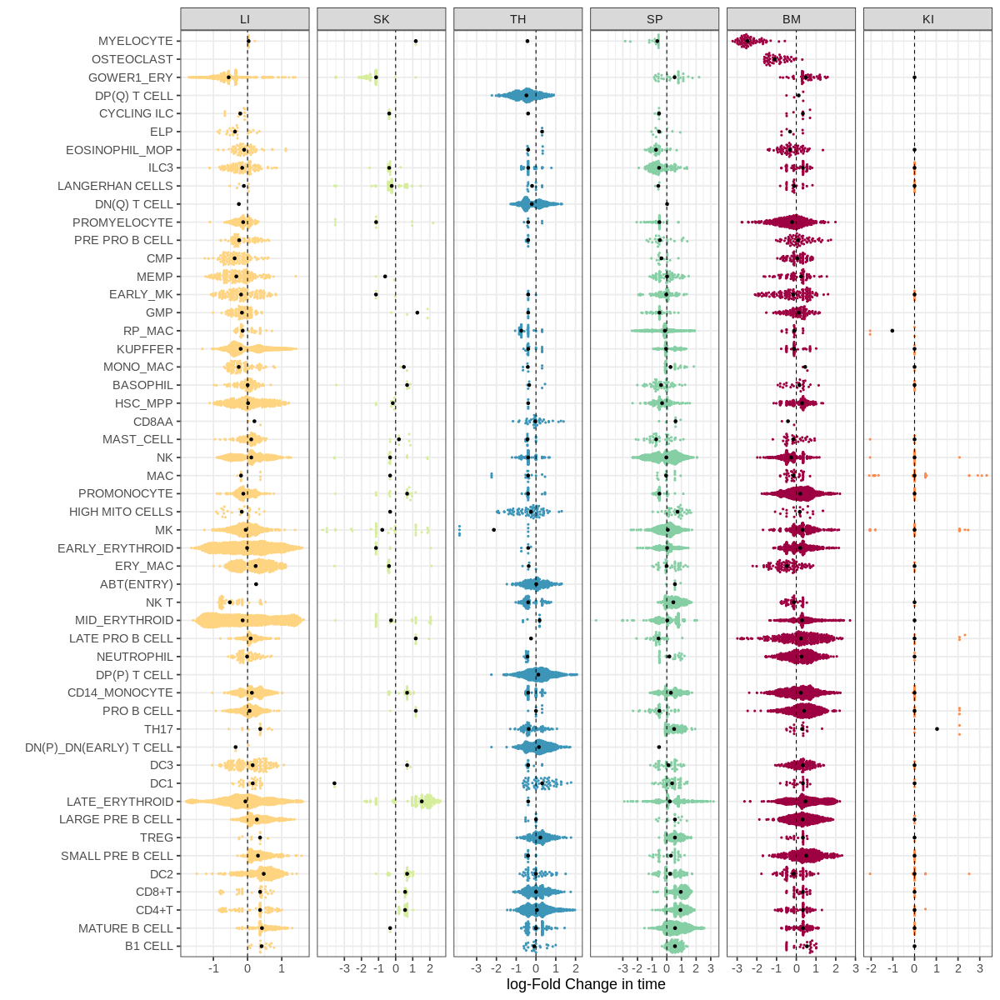

In [235]:
%%R -w 1200 -h 1200
plot_df %>%
group_by(nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(nhood_anno=factor(nhood_anno, levels=unique(nhood_anno))) %>%
    ggplot(aes(nhood_anno, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, nhood_anno, mean_logFC), aes(x=nhood_anno, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 

### (2) Use mean correction/correction factor as confounding covariate

In [41]:
import milopy

def _add_mean_correction(adata):
    nhood_adata = adata.uns["nhood_adata"].copy()
#     ## Save mean correction applied to each sample
#     nhood_adata.layers["X_correction_delta"] = X_counts - X_counts_corrected
    mean_correction_df = pd.DataFrame([nhood_adata.layers["X_correction_delta"].mean(0), nhood_adata.var_names]).T
    mean_correction_df.columns = ["mean_correction_sample", "Sample.lanes"]
    new_obs = pd.merge(adata.obs, mean_correction_df,how="left")
    new_obs.index = adata.obs_names
    adata.obs = new_obs.copy()
    adata.obs["mean_correction_sample"]= adata.obs["mean_correction_sample"].astype("float64")
    return(adata)

def _add_FACS_correction_factor(adata):
    milopy.utils.add_covariate_to_nhoods_var(adata,["parent_Multiplier", "sort.ids", 'donor', 'sort_sample_id'])
    nhood_adata = adata.uns["nhood_adata"].copy()
    ## Keep only samples with CD45+/CD45- ratio information
    nhood_adata = nhood_adata[:,nhood_adata.var["sort.ids"].isin(["CD45+", "CD45-"])]
    ## Exclude neighbourhoods that are empty after filtering
    nhood_adata = nhood_adata[nhood_adata.X.sum(1) > 0]
    ## Apply correction
    X_counts = nhood_adata.X.toarray()
    adata.obs["n_sort"] = adata.obs["sort_sample_id"].astype("str") + "_" + adata.obs["sort.ids"].astype("str")
    nhood_adata.var["n_sort"] = nhood_adata.var["sort_sample_id"].astype("str") + "_" + nhood_adata.var["sort.ids"].astype("str")
    sum_i_c_n = adata.obs["n_sort"].value_counts()[nhood_adata.var["n_sort"]].values
    p = nhood_adata.var["parent_Multiplier"].astype("float").values
    sum_S = adata.obs["sort_sample_id"].value_counts()[nhood_adata.var["sort_sample_id"]].values
    count_correction_fact = (p * sum_S)/sum_i_c_n
    fact_correction_df = pd.DataFrame([count_correction_fact, nhood_adata.var_names]).T
    
    fact_correction_df.columns = ["correction_factor", "Sample.lanes"]
    new_obs = pd.merge(adata.obs, fact_correction_df,how="left")
    new_obs.index = adata.obs_names
    adata.obs = new_obs.copy()
    adata.obs["correction_factor"]= adata.obs["correction_factor"].astype("float64")
    adata.obs["correction_factor"] = np.log10(adata.obs["correction_factor"])
    return(adata, count_correction_fact)

In [34]:
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

In [42]:
milo.count_nhoods(adata, sample_col="Sample.lanes")

In [43]:
# adata.obs = adata.obs.drop("correction_factor", 1)
adata,fact = _add_FACS_correction_factor(adata)

Trying to set attribute `.var` of view, copying.


In [1272]:
adata = _FACS_correct_counts(adata)

Trying to set attribute `.var` of view, copying.


In [1276]:
adata = _add_mean_correction(adata)

In [1315]:
adata.obs["mean_correction_sample"]adata.obs["mean_correction_sample"].astype("float64")

In [1363]:
milopy.utils.add_covariate_to_nhoods_var(adata, ["mean_correction_sample", "sort.ids", 'age_bins', "organ","correction_factor"])

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


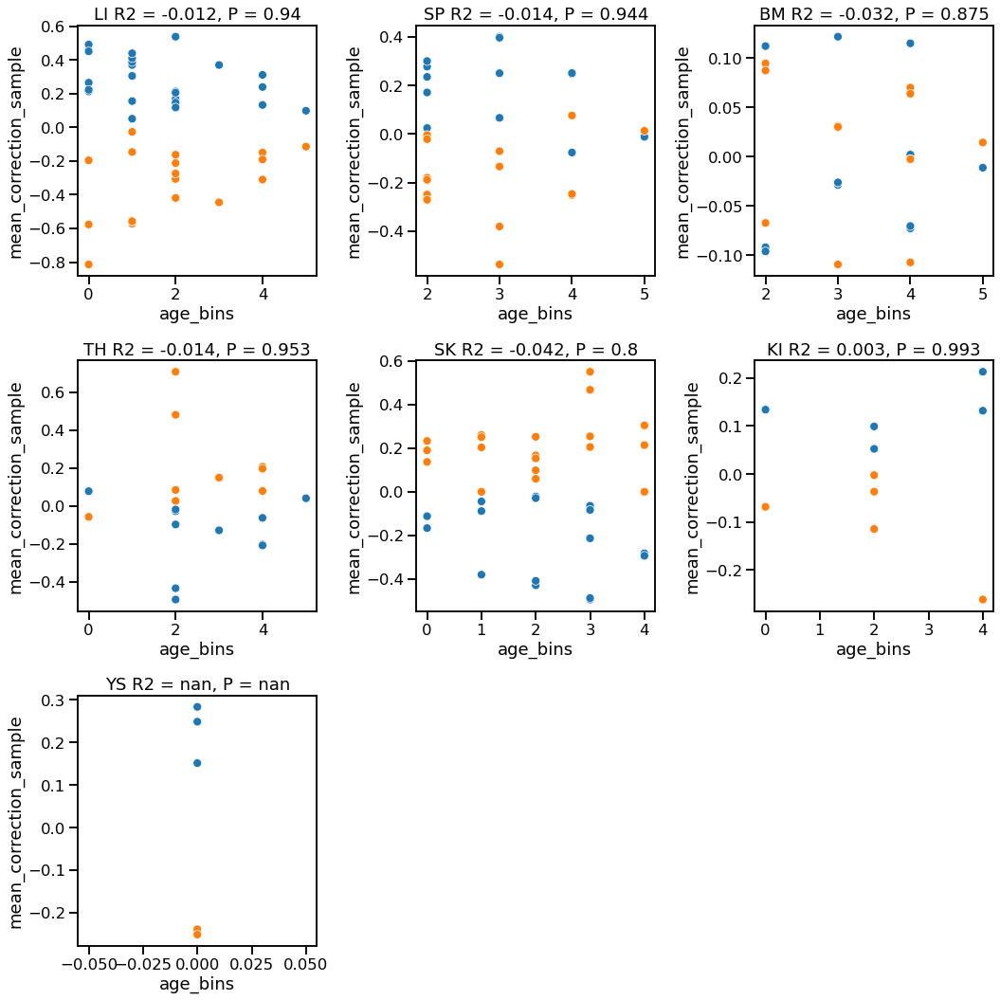

In [1364]:
nhood_adata =adata.uns["nhood_adata"].copy()
df = nhood_adata.var.copy()
df["mean_correction_sample"] = df["mean_correction_sample"].astype("float")
df["age_bins"] = df["age_bins"].astype("float")

all_organs = nhood_adata.var.organ.unique()
plt.rcParams["figure.figsize"] = [15,15]
for i in range(len(all_organs)):
#     small_adata = nhood_adata[:,nhood_adata.var["organ"] == all_organs[i]]
    r2, p_val = scipy.stats.pearsonr(df[df['organ']==all_organs[i]]["mean_correction_sample"].astype("float").values, df[df['organ']==all_organs[i]]["age_bins"].astype("float").values)
    plt.subplot(3, 3, i+1);
    sns.scatterplot(data=df[df['organ']==all_organs[i]], y="mean_correction_sample", x="age_bins", hue="sort.ids");
    plt.title("{o} R2 = {r}, P = {p}".format(o=all_organs[i],r=np.round(r2, 3), p=np.round(p_val, 3)));
    plt.legend([],[], frameon=False)
    plt.tight_layout()

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


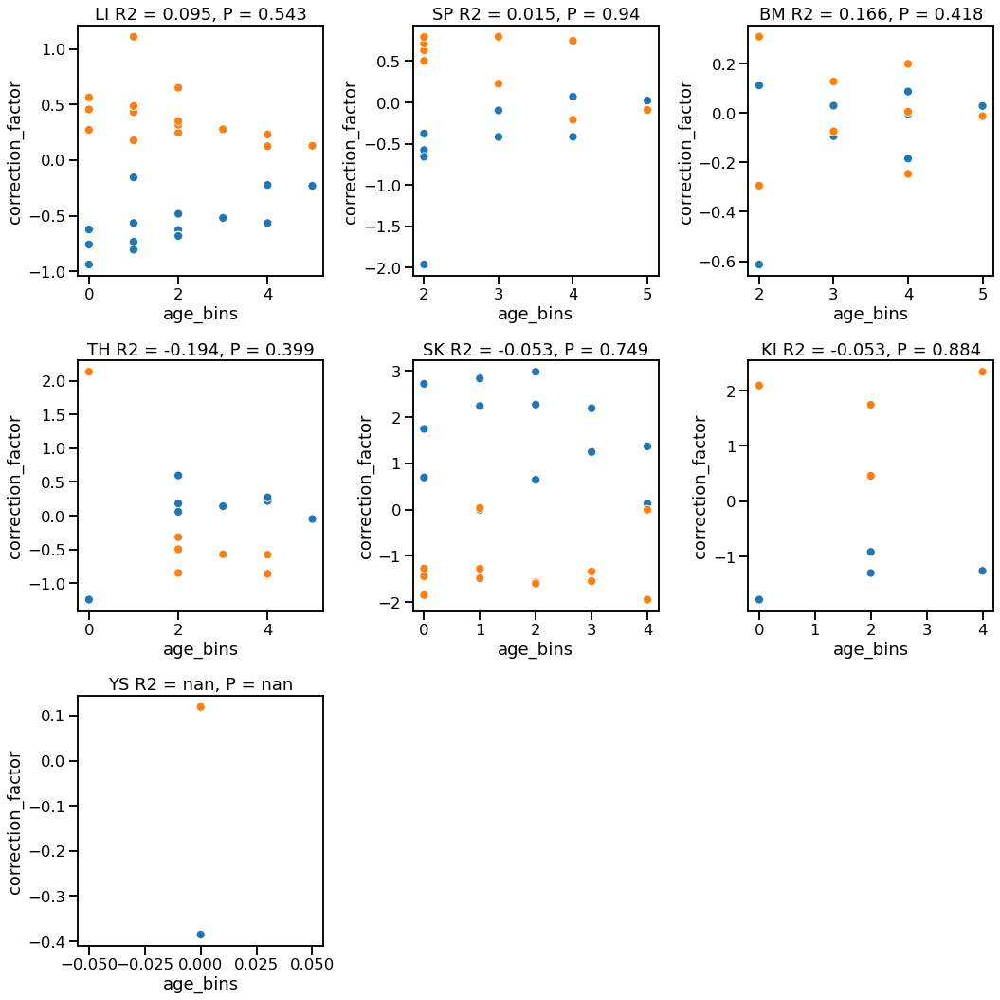

In [1365]:
nhood_adata =adata.uns["nhood_adata"].copy()
df = nhood_adata.var.copy()
df["correction_factor"] = df["correction_factor"].astype("float")
df["age_bins"] = df["age_bins"].astype("float")

all_organs = nhood_adata.var.organ.unique()
plt.rcParams["figure.figsize"] = [15,15]
for i in range(len(all_organs)):
#     small_adata = nhood_adata[:,nhood_adata.var["organ"] == all_organs[i]]
    r2, p_val = scipy.stats.pearsonr(df[df['organ']==all_organs[i]]["correction_factor"].astype("float").values, df[df['organ']==all_organs[i]]["age_bins"].astype("float").values)
    plt.subplot(3, 3, i+1);
    sns.scatterplot(data=df[df['organ']==all_organs[i]], y="correction_factor", x="age_bins", hue="sort.ids");
    plt.title("{o} R2 = {r}, P = {p}".format(o=all_organs[i],r=np.round(r2, 3), p=np.round(p_val, 3)));
    plt.legend([],[], frameon=False)
    plt.tight_layout()

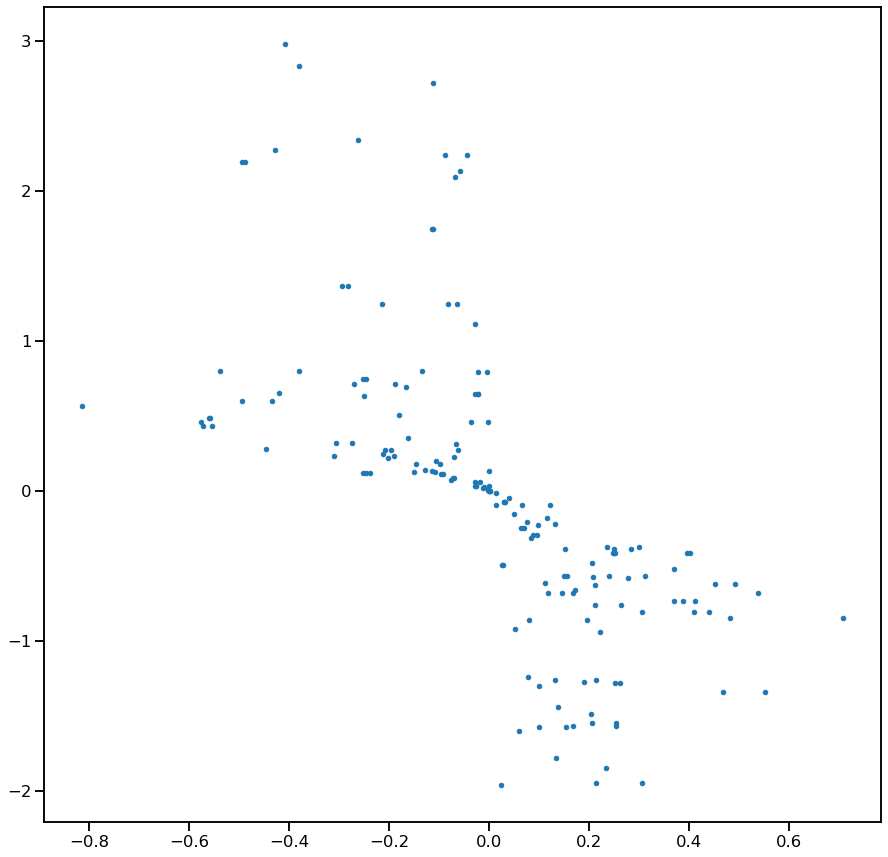

In [1366]:
df = adata.obs[["mean_correction_sample", "correction_factor"]].drop_duplicates()
plt.plot(df.iloc[:,0], df.iloc[:,1], '.')

In [1367]:
adata.uns["nhood_adata"].X = scipy.sparse.csr_matrix(adata.uns["nhood_adata"].layers["X_counts"])
milo_res_2, org_fc_2, org_fdr_2 = _milo_test_by_organ(adata, design="~ correction_factor + age_bins")

BM


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


KI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


LI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


SK


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


SP


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


TH


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


In [1399]:
milo_res_2["TH"][["logFC","PValue"]].dropna()
milo_res_2["TH"][milo_res_2["TH"]["PValue"] > 0.95]

,kth_distance,SpatialFDR,nhood_annotation,nhood_annotation_frac,logFC,logCPM,F,PValue,FDR,logFC_TH,FDR_TH
0,2.199904,0.002984,DC2,0.580645,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
20,1.770655,0.000163,LANGERHAN CELLS,0.893617,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
29,1.946271,0.000664,MONO_MAC,0.488889,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
138,1.696349,0.000163,DC2,1.000000,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
168,1.692731,0.000163,ILC3,1.000000,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...
23276,0.734744,0.000000,DC2,0.800000,-0.446176,8.731025,8.774246e-07,0.999723,1.0,NaN,1.0
23336,1.387677,0.000000,DN(Q) T CELL,0.800000,0.133156,10.287796,2.890307e-03,0.957125,1.0,NaN,1.0
23337,1.315399,0.000000,DN(Q) T CELL,1.000000,0.087914,10.292216,2.114067e-03,0.963327,1.0,NaN,1.0
23346,1.208002,0.000000,DN(Q) T CELL,1.000000,0.012457,9.647645,8.284283e-04,0.977038,1.0,NaN,1.0


In [1368]:
org_fc_filtered = org_fc_2.copy()
org_fc_filtered

,logFC_BM,logFC_KI,logFC_LI,logFC_SK,logFC_SP,logFC_TH
0,NaN,NaN,0.398639,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
23365,NaN,NaN,NaN,NaN,NaN,NaN
23366,NaN,NaN,NaN,NaN,NaN,NaN
23367,NaN,NaN,NaN,NaN,NaN,NaN
23368,NaN,NaN,NaN,1.261145,NaN,NaN


In [1369]:
## Add annotation
annotate_nhoods(adata, anno_col="updated_anno")
org_fc_filtered["nhood_anno"] = adata.uns["nhood_adata"].obs["nhood_annotation"]

anno_groups_df['nhood_anno'] = anno_groups_df['updated_anno']
org_fc_filtered = pd.merge(org_fc_filtered, anno_groups_df, how="left")
org_fc_filtered = org_fc_filtered.drop(["updated_anno"], 1)

In [1370]:
%%R -i org_fc_filtered -h 1000 -w 800
library(tidyverse)
long_org_fc <- org_fc_filtered %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(nhood_anno, anno_group, Nhood), names_to="organ", values_to="logFC")
    
plot_df <- long_org_fc %>%
    filter(!is.na(logFC)) %>%
    filter(nhood_anno!="nan") %>%
    ## Fix organ naming and order 
    mutate(organ=str_remove(organ, "logFC_")) %>%
    mutate(organ=factor(organ, levels=c("YS", "LI", "SK", "TH", "SP", "BM", "MLN", "KI", "GU"))) %>%
    ## Fix some names
    mutate(nhood_anno=ifelse(str_detect(nhood_anno, "NK$"), "NK", nhood_anno)) %>%
    ## Reorder by fold-change 
    group_by(organ, nhood_anno, Nhood) %>%
    mutate(mean_logFC = mean(logFC)) %>%
    ungroup() %>%
    group_by(organ, nhood_anno) %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    mutate(Nhood=factor(Nhood, levels=unique(Nhood))) %>%
    group_by(nhood_anno) %>%
    filter(length(unique(Nhood)) > 20) %>%
    ungroup()


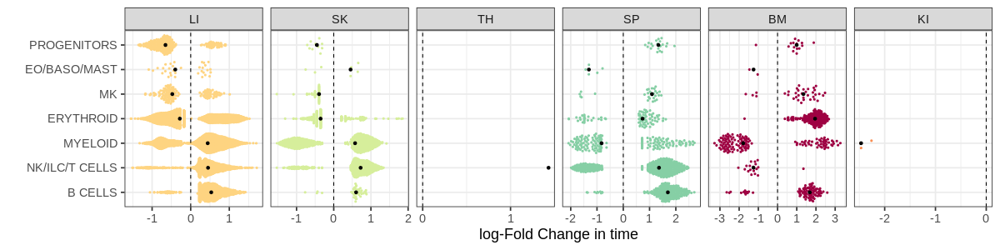

In [1371]:
%%R -w 1200 -h 300 
library(ggbeeswarm)
organ_colors_df <- read.csv("~/Pan_fetal_immune/metadata/organ_colors.csv")
organ_palette <- setNames(organ_colors_df$color, organ_colors_df$organ)

plot_df %>%
filter(!is.na(anno_group)) %>%
    group_by(anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(anno_group=factor(anno_group, levels=unique(anno_group))) %>%
    ggplot(aes(anno_group, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, anno_group, mean_logFC), aes(x=anno_group, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 
#     ggsave(paste0(figdir, "milo_results_overview.png"), height=4, width=15) +
#     ggsave(paste0(figdir, "milo_results_overview.pdf"), height=4, width=15) 

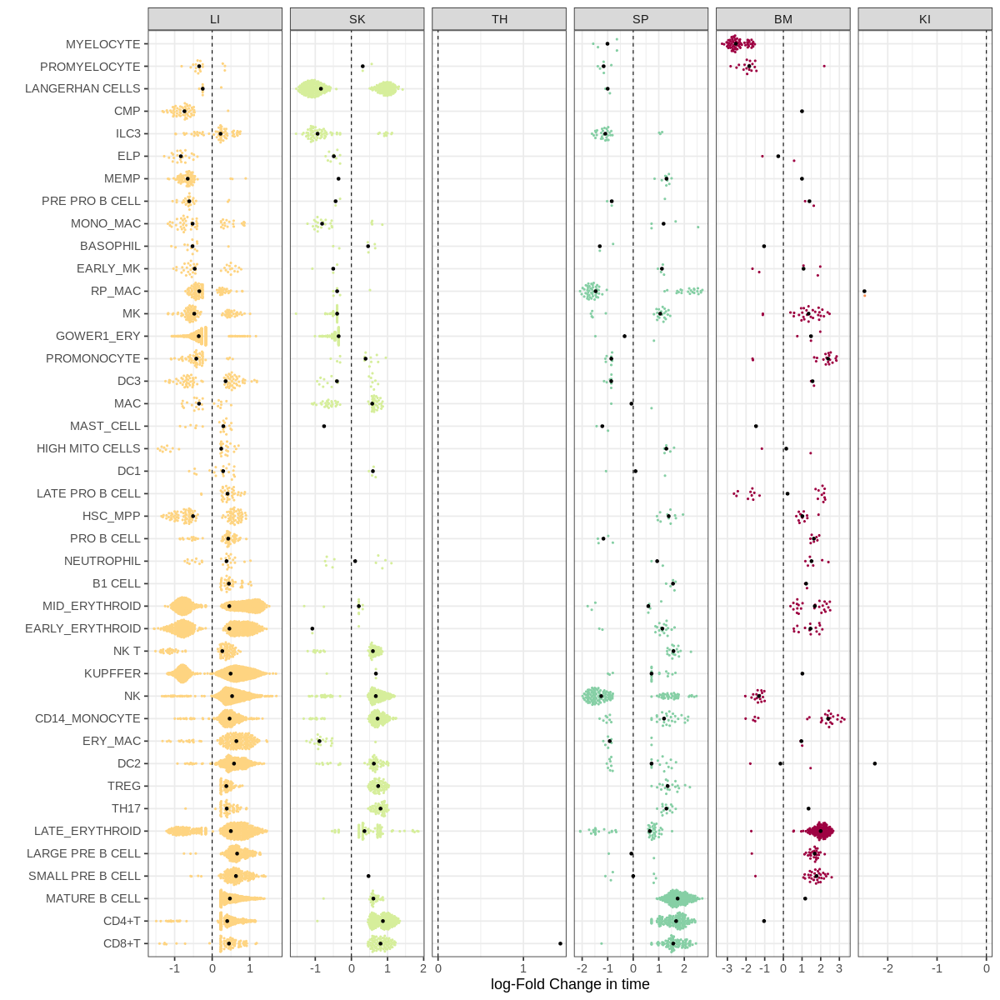

In [1372]:
%%R -w 1200 -h 1200
plot_df %>%
group_by(nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(nhood_anno=factor(nhood_anno, levels=unique(nhood_anno))) %>%
    ggplot(aes(nhood_anno, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, nhood_anno, mean_logFC), aes(x=nhood_anno, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 

Compare to just using the label

In [1337]:
adata.uns["nhood_adata"].X = scipy.sparse.csr_matrix(adata.uns["nhood_adata"].layers["X_counts"])
milo_res_2a, org_fc_2a, org_fdr_2a = _milo_test_by_organ(adata, design="~ Sort_id + age_bins")

BM


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


KI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


LI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


SK


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


SP


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


TH


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FCAImmP7179363', 'FCAImmP7179364', 'FCAImmP7179365', 'FCAImmP7179366', 'FCAImmP7179367']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


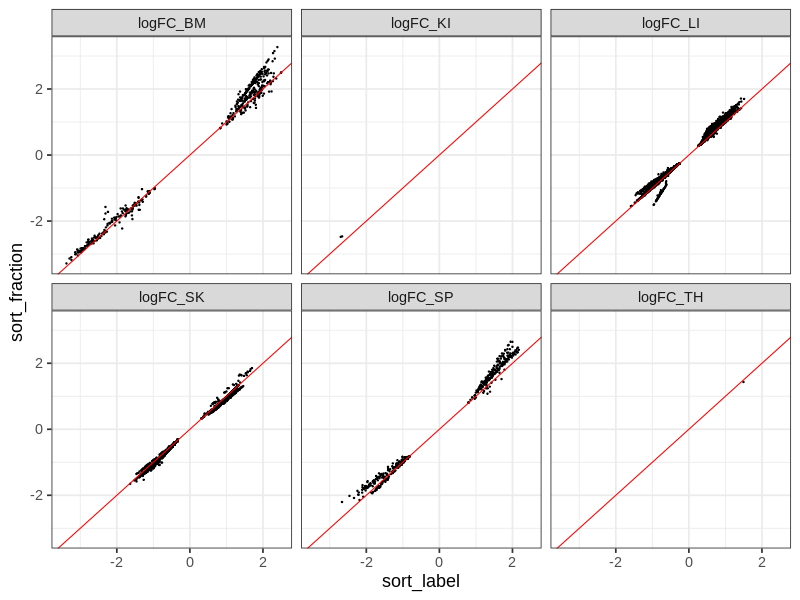

In [1376]:
%%R -i org_fc_2a -i org_fc_2 -i org_fdr_2a -i org_fdr_2 -w 800 -h 600
library(tidyr)
bind_rows(
    pivot_longer(org_fc_2a %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="sort_label"),
    pivot_longer(org_fc_2 %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="sort_fraction")
) %>%
    drop_na() %>%
    pivot_wider(id_cols=c(nhood, name), names_from="design", values_from="value") %>%
    ggplot(aes(sort_label, sort_fraction)) +
    geom_point(size=0.5) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    theme_bw(base_size=18)


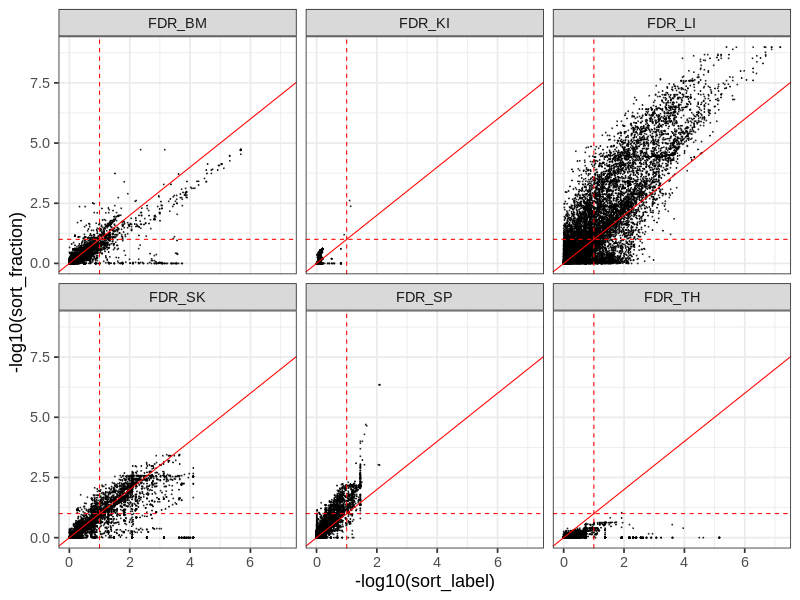

In [1378]:
%%R -w 800 -h 600
library(tidyr)
bind_rows(
    pivot_longer(org_fdr_2a %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="sort_label"),
    pivot_longer(org_fdr_2 %>% rownames_to_column("nhood"), cols=-nhood) %>% mutate(design="sort_fraction")
) %>%
    drop_na() %>%
    pivot_wider(id_cols=c(nhood, name), names_from="design", values_from="value") %>%
    ggplot(aes(-log10(sort_label), -log10(sort_fraction))) +
    geom_point(size=0.3, alpha=0.7) +
    facet_wrap(name~.) +
    geom_abline(color="red") +
    geom_vline(color="red", linetype=2, xintercept=1) +
    geom_hline(color="red", linetype=2, yintercept=1) +
    theme_bw(base_size=18)


### (3) count cells by donors+tissue instead of samples

One for each sorting event

Binning age

In [1119]:
cut_labels_4 = ['< 8pcw','< 10pcw','< 12pcw','< 14pcw', '< 16pcw', '< 18pcw']
cut_bins = [0, 8, 10, 12,14,16, 18]
adata.obs["age_bins"] = pd.cut(adata.obs["age"], bins=cut_bins, labels=cut_labels_4).astype("str")
adata.obs["age_bins"] = pd.Categorical(adata.obs["age_bins"], categories=cut_labels_4, ordered=True)
adata.obs["age_bins"]

## Convert covariate to continous
adata.obs['age_bins'] = adata.obs['age_bins'].cat.codes

<AxesSubplot:xlabel='age_bins', ylabel='sort_sample_id'>

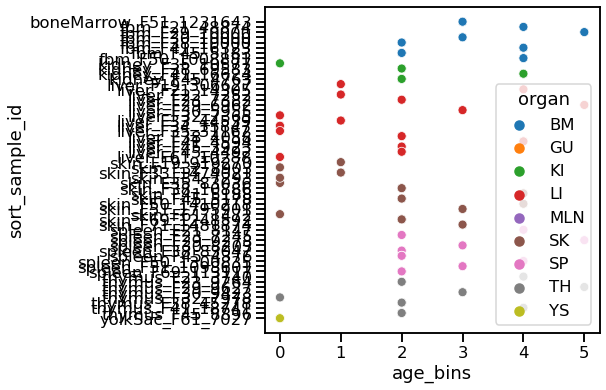

In [1120]:
smp_metadata = adata.obs[["sort.ids", "parent_Multiplier", "organ", "age_bins", 'Sample.lanes', "donor", "sort_sample_id"]].drop_duplicates()
sns.scatterplot(data=smp_metadata, x="age_bins", y="sort_sample_id", hue="organ")

In [1011]:
milo.count_nhoods(adata, sample_col="sort_sample_id")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [1045]:
## Extract CD45+ proportion for each sort_sample_id
df = adata.obs[["sort_sample_id","parent_Multiplier", "sort.ids"]]
df = df[df["sort.ids"] == "CD45+"].drop_duplicates()
df.index = df["sort_sample_id"]
cd45_prop = df["parent_Multiplier"]

adata.obs["CD45_fraction"] = [cd45_prop[x] if x!="nan" else np.nan for x in adata.obs["sort_sample_id"].astype("str")]

In [1153]:
milo_res_3, org_fc_3, org_fdr_3 = _milo_test_by_organ(adata, design="~ CD45_fraction + age_bins",sample_col="sort_sample_id")

BM


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


KI
LI


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


SK


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


SP


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


TH


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


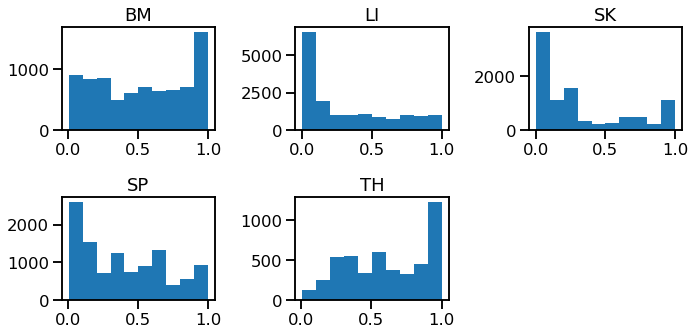

In [1154]:
plt.rcParams["figure.figsize"] = [10,5]
i=1
for k in milo_res_3.keys():
    plt.subplot(2,3,i)
    plt.hist(milo_res_3[k].PValue);
    plt.title(k);
    plt.tight_layout();
    i+=1

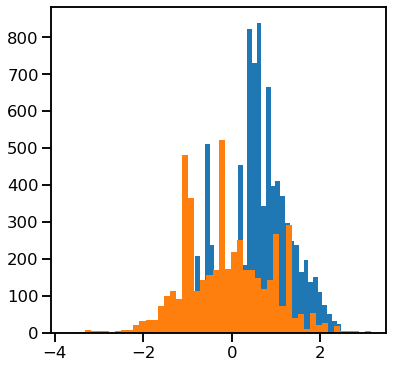

In [1155]:
plt.rcParams["figure.figsize"] = [6,6]
plt.hist(milo_res_3["SK"].logFC, bins=50);
plt.hist(milo_res_3["TH"].logFC, bins=50);
# plt.plot(milo_res_3["TH"].logFC, -np.log10(milo_res_3["TH"].FDR),'.')

In [1156]:
org_fc_filtered = org_fc_3.copy()

In [1157]:
## Add annotation
annotate_nhoods(adata, anno_col="updated_anno")
org_fc_filtered["nhood_anno"] = adata.uns["nhood_adata"].obs["nhood_annotation"]

anno_groups_df['nhood_anno'] = anno_groups_df['updated_anno']
org_fc_filtered = pd.merge(org_fc_filtered, anno_groups_df, how="left")
org_fc_filtered = org_fc_filtered.drop(["updated_anno"], 1)

In [1158]:
%%R -i org_fc_filtered -h 1000 -w 800
library(tidyverse)
long_org_fc <- org_fc_filtered %>%
    rowid_to_column("Nhood") %>%
    pivot_longer(cols= - c(nhood_anno, anno_group, Nhood), names_to="organ", values_to="logFC")
    
plot_df <- long_org_fc %>%
    filter(!is.na(logFC)) %>%
    filter(nhood_anno!="nan") %>%
    ## Fix organ naming and order 
    mutate(organ=str_remove(organ, "logFC_")) %>%
    mutate(organ=factor(organ, levels=c("YS", "LI", "SK", "TH", "SP", "BM", "MLN", "KI", "GU"))) %>%
    ## Fix some names
    mutate(nhood_anno=ifelse(str_detect(nhood_anno, "NK$"), "NK", nhood_anno)) %>%
    ## Reorder by fold-change 
    group_by(organ, nhood_anno, Nhood) %>%
    mutate(mean_logFC = mean(logFC)) %>%
    ungroup() %>%
    group_by(organ, nhood_anno) %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    mutate(Nhood=factor(Nhood, levels=unique(Nhood))) %>%
    group_by(nhood_anno) %>%
    filter(length(unique(Nhood)) > 20) %>%
    ungroup()


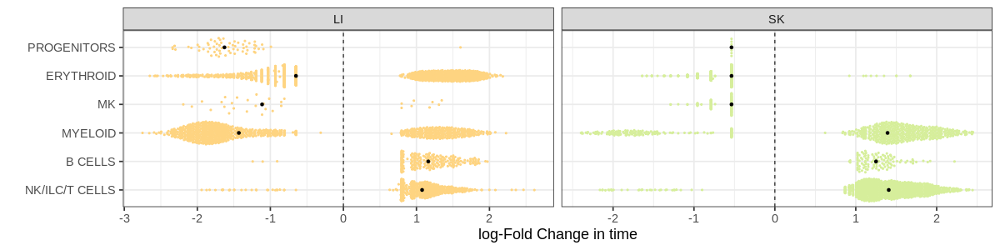

In [1159]:
%%R -w 1200 -h 300 
library(ggbeeswarm)
organ_colors_df <- read.csv("~/Pan_fetal_immune/metadata/organ_colors.csv")
organ_palette <- setNames(organ_colors_df$color, organ_colors_df$organ)

plot_df %>%
filter(!is.na(anno_group)) %>%
    group_by(anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, anno_group) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(anno_group=factor(anno_group, levels=unique(anno_group))) %>%
    ggplot(aes(anno_group, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, anno_group, mean_logFC), aes(x=anno_group, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 
#     ggsave(paste0(figdir, "milo_results_overview.png"), height=4, width=15) +
#     ggsave(paste0(figdir, "milo_results_overview.pdf"), height=4, width=15) 

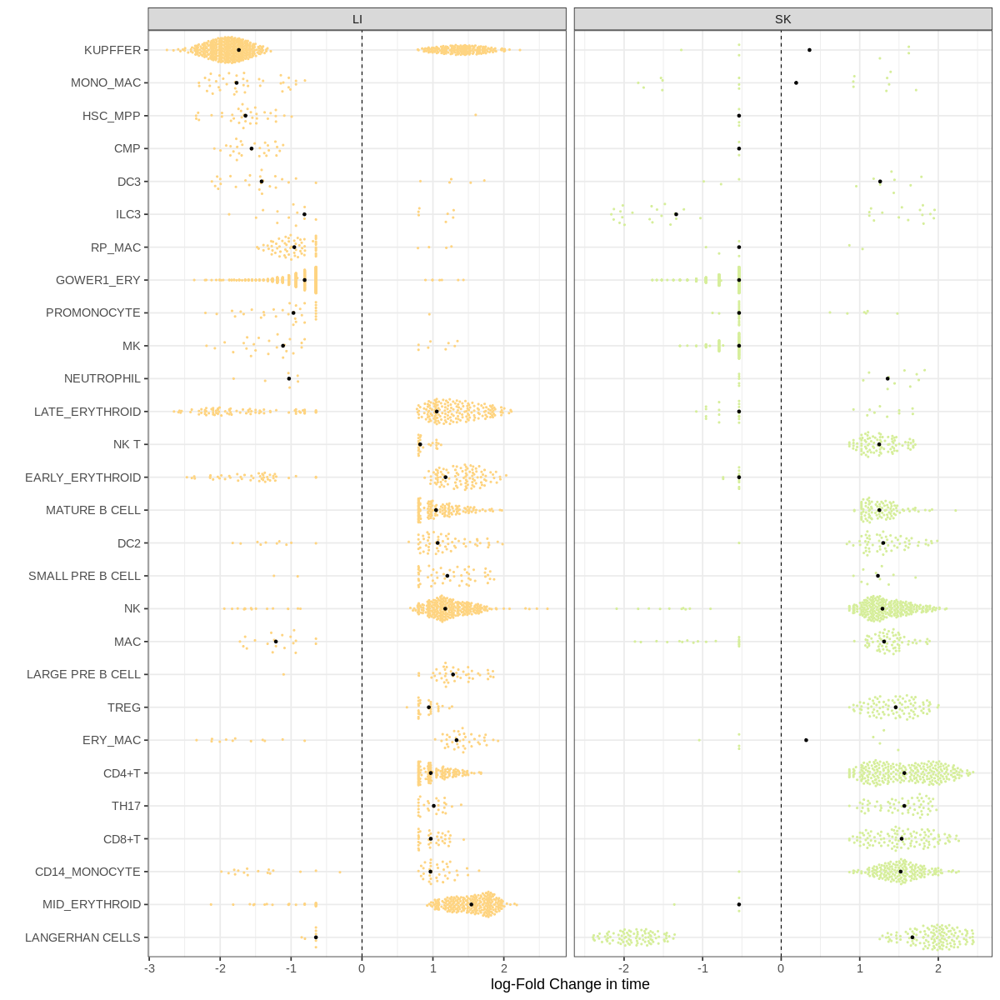

In [1160]:
%%R -w 1200 -h 1200
plot_df %>%
group_by(nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    arrange(- mean_logFC) %>%
    ungroup()  %>%
    group_by(organ, nhood_anno) %>%
    mutate(mean_logFC = median(logFC)) %>%
    ungroup() %>%
    mutate(nhood_anno=factor(nhood_anno, levels=unique(nhood_anno))) %>%
    ggplot(aes(nhood_anno, logFC,  fill=organ, color=organ)) +
    geom_quasirandom(size=0.8) +
    geom_point(data= . %>% distinct(organ, nhood_anno, mean_logFC), aes(x=nhood_anno, y=mean_logFC), color="black")  +
    facet_grid(.~organ, scales="free_x") +
    coord_flip() +
    scale_color_manual(values=organ_palette) +
    scale_fill_manual(values=organ_palette) +
    guides(color="none", fill="none") +
    geom_hline(yintercept=0, linetype=2) +
    theme_bw(base_size=18) +
    xlab("") + ylab("log-Fold Change in time") +
    scale_y_continuous(breaks=seq(-3,3, by=1)) 

In [1121]:
design="~ CD45_fraction + age_bins"

In [1122]:
from rpy2.robjects.packages import PackageNotInstalledError,importr
import rpy2.robjects.numpy2ri
from rpy2.robjects import pandas2ri
import rpy2.robjects as ro
from rpy2.robjects.conversion import localconverter

In [1123]:
import re
import rpy2

In [1124]:
## Set up rpy2 to run edgeR
rpy2.robjects.numpy2ri.activate()
rpy2.robjects.pandas2ri.activate()
edgeR = importr("edgeR")
stats = importr("stats")
base = importr("base")

nhood_adata = adata.uns["nhood_adata"]
covariates = list(set(re.split(' \\+ |\\*', design.lstrip("~ "))))

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '


In [1125]:
subset_samples = adata.obs[adata.obs["organ"] == "BM"][sample_col].unique()

In [1126]:
## Add covariates used for testing to nhood_adata.var
sample_col = nhood_adata.uns["sample_col"]
try:
    nhoods_var = adata.obs[covariates + [sample_col]].drop_duplicates()
except KeyError:
    missing_cov = [x for x in covariates if x not in nhood_adata.var.columns]
    raise KeyError(
        'Covariates {c} are not columns in adata.obs'.format(c=" ".join(missing_cov))
    )
## N.B. This might need some type adjustment!!
nhoods_var = nhoods_var[covariates + [sample_col]]
nhoods_var.index = nhoods_var[sample_col]

try:
    assert nhoods_var.loc[nhood_adata.var_names].shape[0] == len(nhood_adata.var_names)
except:
    raise ValueError("Covariates cannot be unambiguously assigned to each sample -- each sample value should match a single covariate value")
nhood_adata.var = nhoods_var.loc[nhood_adata.var_names]
## Get design dataframe
try:
    design_df = nhood_adata.var[covariates]
except KeyError:
    missing_cov = [x for x in covariates if x not in nhood_adata.var.columns]
    raise KeyError(
        'Covariates {c} are not columns in adata.uns["nhood_adata"].var'.format(c=" ".join(missing_cov))
    )

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


In [1109]:
## Get count matrix
count_mat = nhood_adata.X.toarray()
lib_size = count_mat.sum(0)

## Filter out samples with zero counts 
keep_smp = lib_size > 0

## Subset samples
if subset_samples is not None:
    keep_smp = keep_smp & nhood_adata.var_names.isin(subset_samples)

## Filter out nhoods with zero counts 
## (they can appear after sample filtering)
keep_nhoods = count_mat[:,keep_smp].sum(1) > 0

## Define model matrix
model = stats.model_matrix(object=stats.formula(design), data=design_df[keep_smp])
model = model[:,sum(model,0) > 0] # Exclude empty columns (they come from missing categorical labels)

In [1111]:
%%R -i design -i design_df -o keep_coefs
library(stats)
mod = model.matrix(as.formula(design), data=design_df)
mod = mod[,colSums(mod) > 0]
head(mod)

     [,1]      [,2] [,3]
[1,]    1 0.7380061    1
[2,]    1 0.4100000    2
[3,]    1 0.3160000    3
[4,]    1 0.5127733    1
[5,]    1 0.1410000    1
[6,]    1 0.8080000    2


In [1112]:
## Fit NB-GLM
dge = edgeR.DGEList(counts=count_mat[keep_nhoods,:][:,keep_smp], lib_size=lib_size[keep_smp])
dge = edgeR.calcNormFactors(dge, method="TMM")
dge = edgeR.estimateDisp(dge, model)
fit = edgeR.glmQLFit(dge, model, robust=True)

In [1113]:
%%R -i fit
# test_res_age =glmQLFTest(fit, coef=9)
test_res_cd45 =glmQLFTest(fit, coef=2)
test_res_th =glmQLFTest(fit, coef=3)

<AxesSubplot:xlabel='age_bins', ylabel='CD45_fraction'>

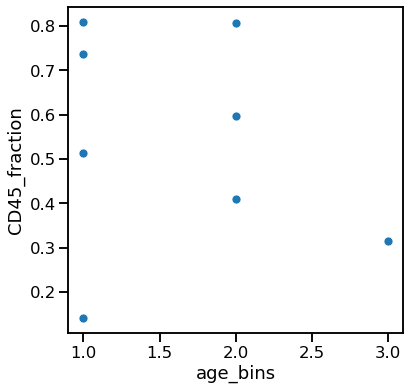

In [1118]:
sns.scatterplot(data=design_df[keep_smp],x="age_bins", y="CD45_fraction")

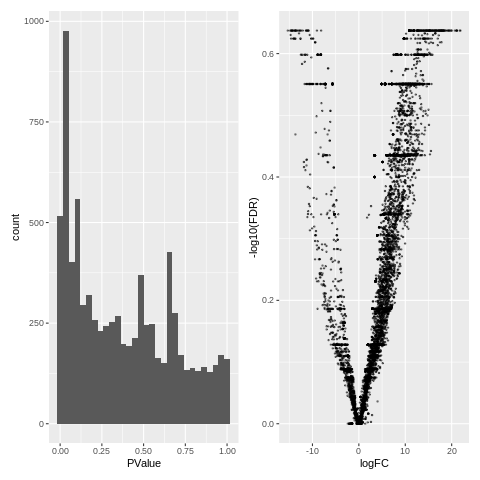

In [1115]:
%%R
library(patchwork)
# topTags(test_res_age, sort.by='PValue', n=20)
CD45_res = topTags(test_res_cd45, sort.by='PValue', n=Inf)

ggplot(as.data.frame(CD45_res), aes(PValue)) + geom_histogram() +
ggplot(as.data.frame(CD45_res), aes(logFC,-log10(FDR))) + geom_point(alpha=0.5, size=0.5)

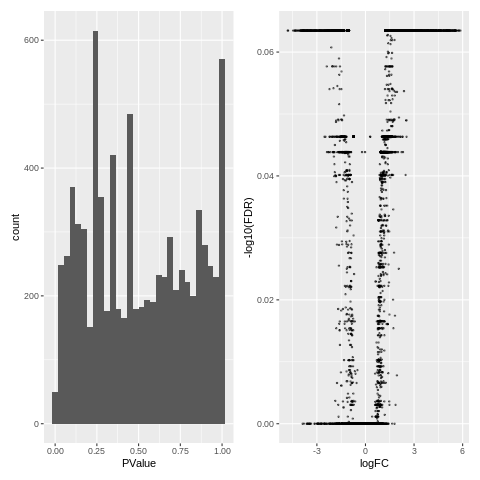

In [1116]:
%%R
# topTags(test_res_age, sort.by='PValue', n=20)
CD45_res = topTags(test_res_th, sort.by='PValue', n=Inf)

ggplot(as.data.frame(CD45_res), aes(PValue)) + geom_histogram() +
ggplot(as.data.frame(CD45_res), aes(logFC,-log10(FDR))) + geom_point(alpha=0.5, size=0.5)

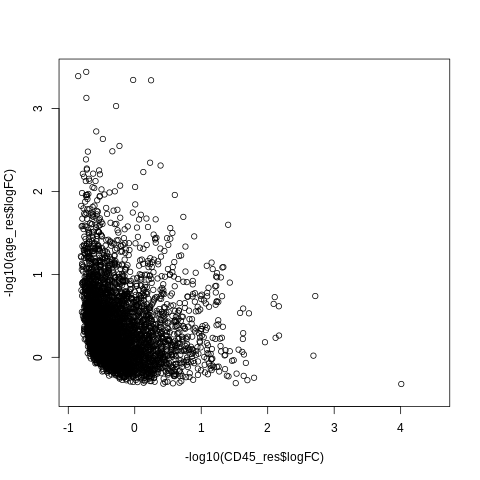

In [1083]:
%%R
CD45_res = as.data.frame(topTags(test_res_cd45, sort.by='none', n=Inf))
age_res = as.data.frame(topTags(test_res_th, sort.by='none', n=Inf))

plot(-log10(CD45_res$logFC),-log10(age_res$logFC))

In [876]:
milo.DA_nhoods(adata, design="~ CD45_fraction + organ*age_bins")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:794: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['boneMarrow_F51_1231643', 'fbm_F21_48874', 'fbm_F29_10000', 'fbm_F30_10000', 'fbm_F38_10000']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


RRuntimeError: Error in glmFit.default(sely, design, offset = seloffset, dispersion = 0.05,  : 
  Design matrix not of full rank.  The following coefficients not estimable:
 3 6 12 15 19


---
---
---

### Apply count correction based on FACS proportions

Following the strategy employed by Isaac for cell type proportions, we convert the observed cell counts in each neighbourhood to a corrected cell count based on the true CD45+/CD45- proportions extracted from FACS gates. For each tissue sample sorted independently, let $c_{n,i}$ be the number of cells from sample $n$ (either CD45+ or CD45-) in neighbourhood $i$, we estimate the corrected count $\hat{c}_{n,i}$ as:

<!-- $$ \hat{c_{n,i}} = p_n \cdot \frac{c_{n,i}}{\sum_n{c_{n,i}}} \cdot \sum_n{\sum_i{c_{n,i}}} $$ -->
$$ \hat{c_{n,i}} = \frac{c_{n,i}}{S_n} \cdot p_n \cdot \sum_n{S_n} $$

where $p_n$ represents the true proportion of cells from sort $n$ in the tissue samples (column `parent_Multiplier` in FACS table), and $S_n$ represents the total number of cells in sort $n$ (of note, this doesn't coincide with the sum of all $c_{n,i}$ since the same cell can be included in multiple neighbourhoods).

In [1195]:
# def _FACS_correct_counts(nhood_adata):
## Keep only CD45+ and CD45- cells
nhood_adata = nhood_adata[:,nhood_adata.var["sort.ids"].isin(["CD45+", "CD45-"])]
## Exclude neighbourhoods that are empty after filtering
nhood_adata = nhood_adata[nhood_adata.X.sum(1) > 0]

## Apply correction
X_counts = nhood_adata.X.toarray()
# sum_i_c_n = adata.obs["sort_n"].value_counts()[nhood_adata.var_names].values

adata.obs["n_sort"] = adata.obs["sort_sample_id"].astype("str") + "_" + adata.obs["sort.ids"].astype("str")
nhood_adata.var["n_sort"] = nhood_adata.var["sort_sample_id"].astype("str") + "_" + nhood_adata.var["sort.ids"].astype("str")
sum_i_c_n = adata.obs["n_sort"].value_counts()[nhood_adata.var["n_sort"]].values

p = nhood_adata.var["parent_Multiplier"].astype("float").values
sum_S = adata.obs["sort_sample_id"].value_counts()[nhood_adata.var["sort_sample_id"]].values
X_counts_corrected = ((X_counts/sum_i_c_n) * p * sum_S)
X_correction_delta = X_counts - X_counts_corrected

## Save in adata layers
nhood_adata.layers["X_counts_corrected"] = X_counts_corrected
nhood_adata.layers["X_correction_delta"] = X_counts - X_counts_corrected

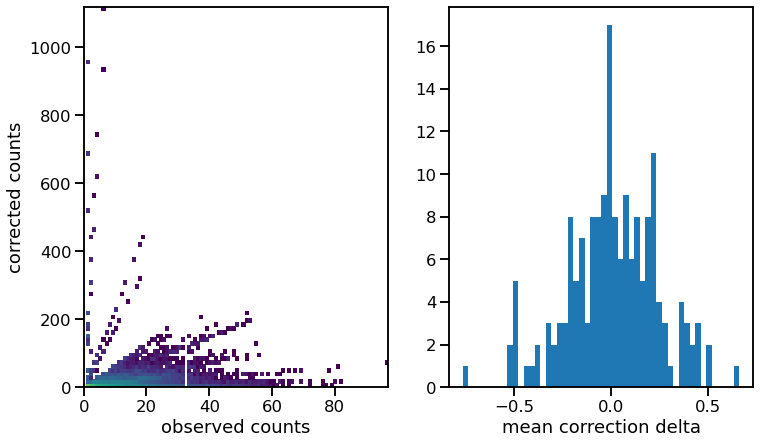

In [1196]:
plt.rcParams["figure.figsize"] = [12,7]
plt.subplot(1,2,1);
plt.hist2d(X_counts.flatten(), X_counts_corrected.flatten(), bins=100, norm=matplotlib.colors.LogNorm());
plt.xlabel("observed counts"); plt.ylabel("corrected counts");
plt.subplot(1,2,2);
plt.hist(nhood_adata.layers["X_correction_delta"].mean(0), bins=50);
plt.xlabel("mean correction delta");

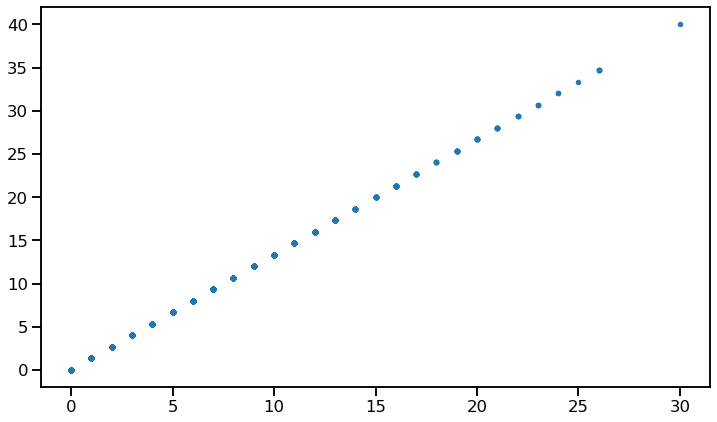

In [1197]:
plt.plot(X_counts[:,1], X_counts_corrected[:,1], '.');

In [1198]:
nhood_adata.var["mean_correction_sample"] = nhood_adata.layers["X_correction_delta"].mean(0)
nhood_adata.obs["mean_correction_nhood"] = nhood_adata.layers["X_correction_delta"].mean(1)

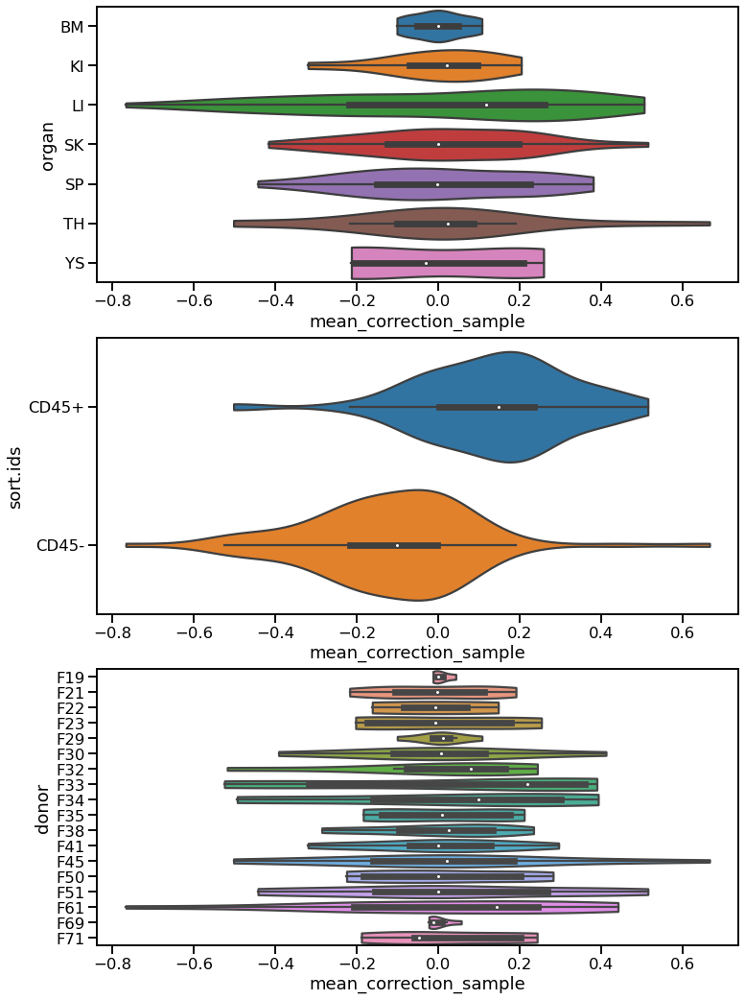

In [1199]:
df = nhood_adata.var[["organ","mean_correction_sample", "sort.ids", "donor", "sort_sample_id"]]

plt.rcParams["figure.figsize"] = [12,18]
pl_covs = ["organ","sort.ids", "donor"]
n_pl = len(pl_covs)
for i in range(n_pl):
    plt.subplot(n_pl,1,i+1)
    sns.violinplot(data=df, y=pl_covs[i], x="mean_correction_sample", scale="width", cut=0, orient="h");

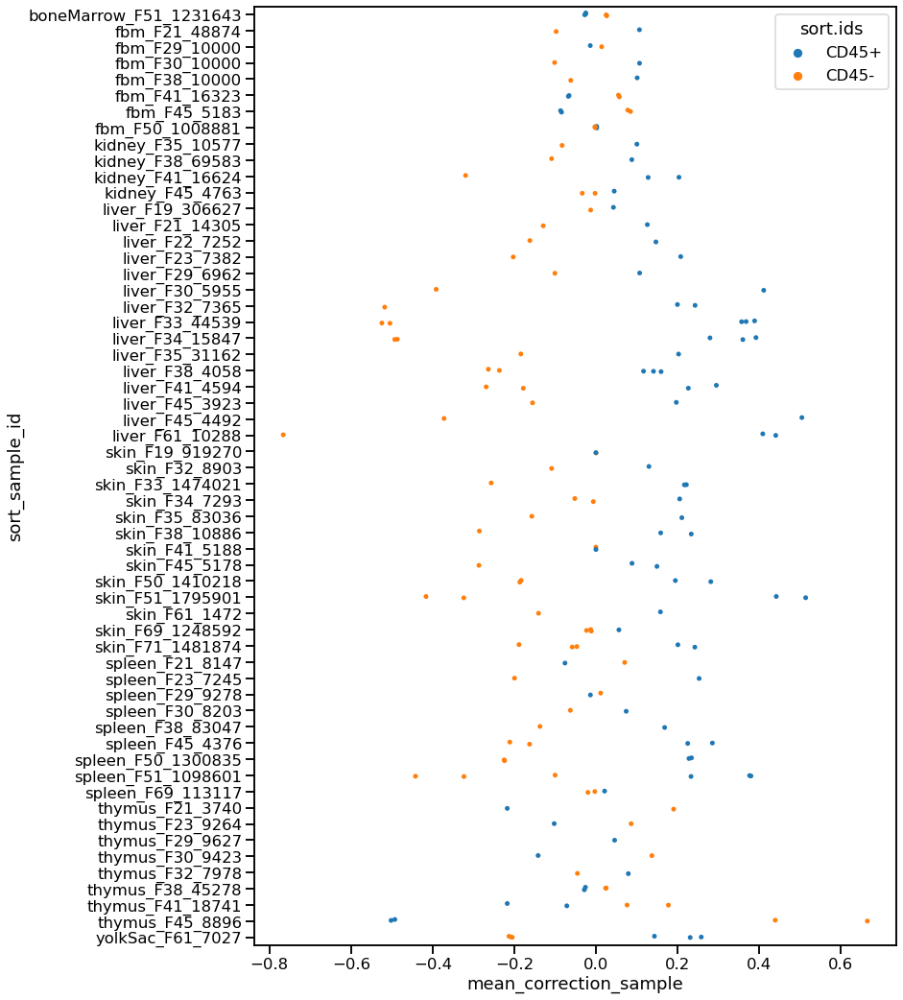

In [1200]:
sns.stripplot(data=df, y='sort_sample_id', x="mean_correction_sample", hue="sort.ids");

... storing 'n_sort' as categorical


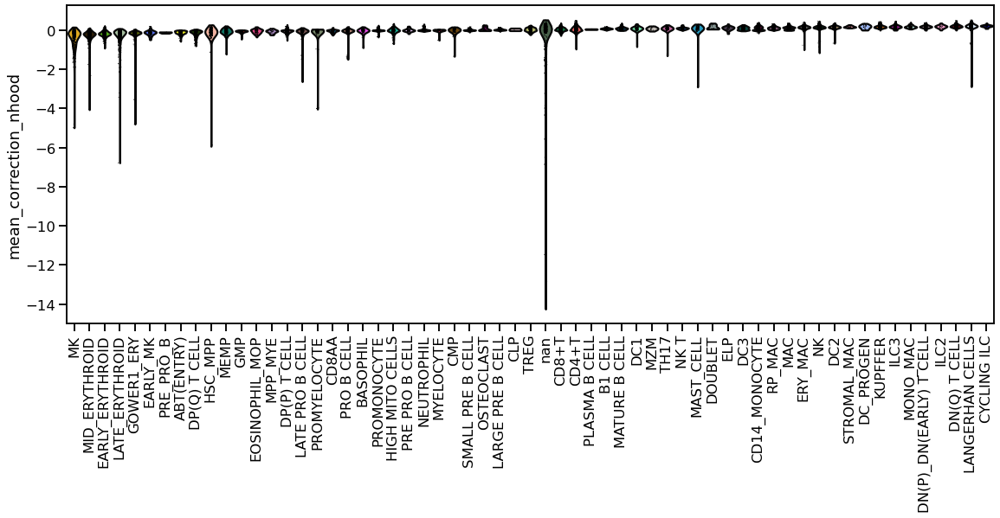

In [1201]:
label_order = nhood_adata.obs[["mean_correction_nhood", "nhood_annotation"]] \
    .groupby("nhood_annotation") \
    .median("mean_correction_nhood") \
    .sort_values("mean_correction_nhood").index

plt.rcParams["figure.figsize"] = [15,7]
sns.set_context("talk");
sc.pl.violin(nhood_adata, 'mean_correction_nhood', groupby="nhood_annotation", rotation=90, order=label_order)

<AxesSubplot:xlabel='age', ylabel='mean_correction_sample'>

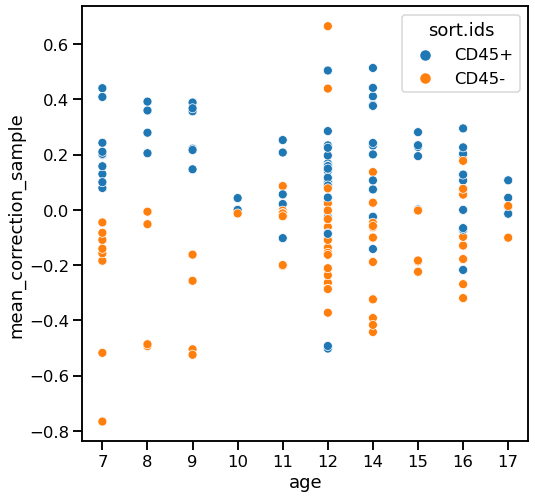

In [1202]:
plt.rcParams["figure.figsize"] = [8,8]
df = nhood_adata.var.copy()
df["parent_Multiplier"] = df["parent_Multiplier"].astype("float")
sns.scatterplot(data=df[df['organ']!="YS"], y="mean_correction_sample", x="age", hue="sort.ids")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/stats/stats.py:3845: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


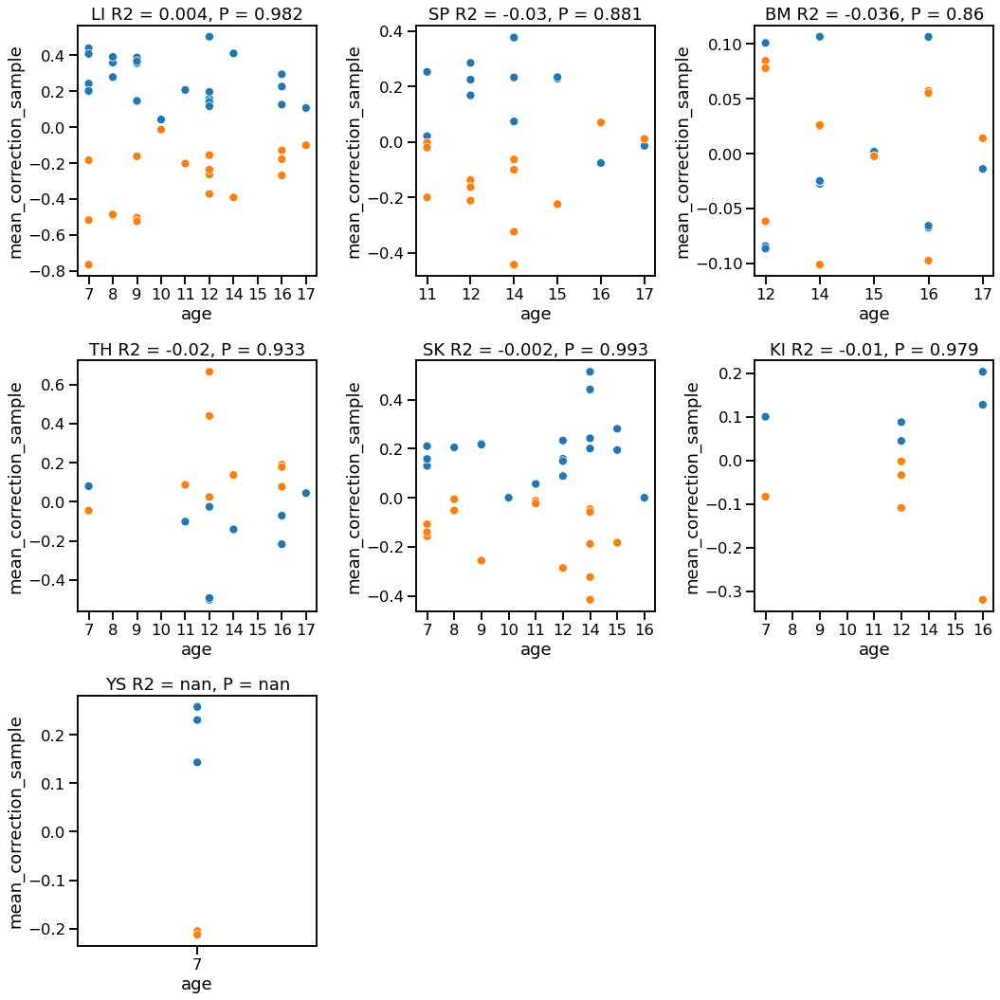

In [1203]:
df = nhood_adata.var.copy()
df["parent_Multiplier"] = df["parent_Multiplier"].astype("float")
 
all_organs = nhood_adata.var.organ.unique()
plt.rcParams["figure.figsize"] = [15,15]
for i in range(len(all_organs)):
#     small_adata = nhood_adata[:,nhood_adata.var["organ"] == all_organs[i]]
    r2, p_val = scipy.stats.pearsonr(df[df['organ']==all_organs[i]]["mean_correction_sample"].values, df[df['organ']==all_organs[i]]["age"].astype("float").values)
    plt.subplot(3, 3, i+1);
    sns.scatterplot(data=df[df['organ']==all_organs[i]], y="mean_correction_sample", x="age", hue="sort.ids");
    plt.title("{o} R2 = {r}, P = {p}".format(o=all_organs[i],r=np.round(r2, 3), p=np.round(p_val, 3)));
    plt.legend([],[], frameon=False)
    plt.tight_layout()

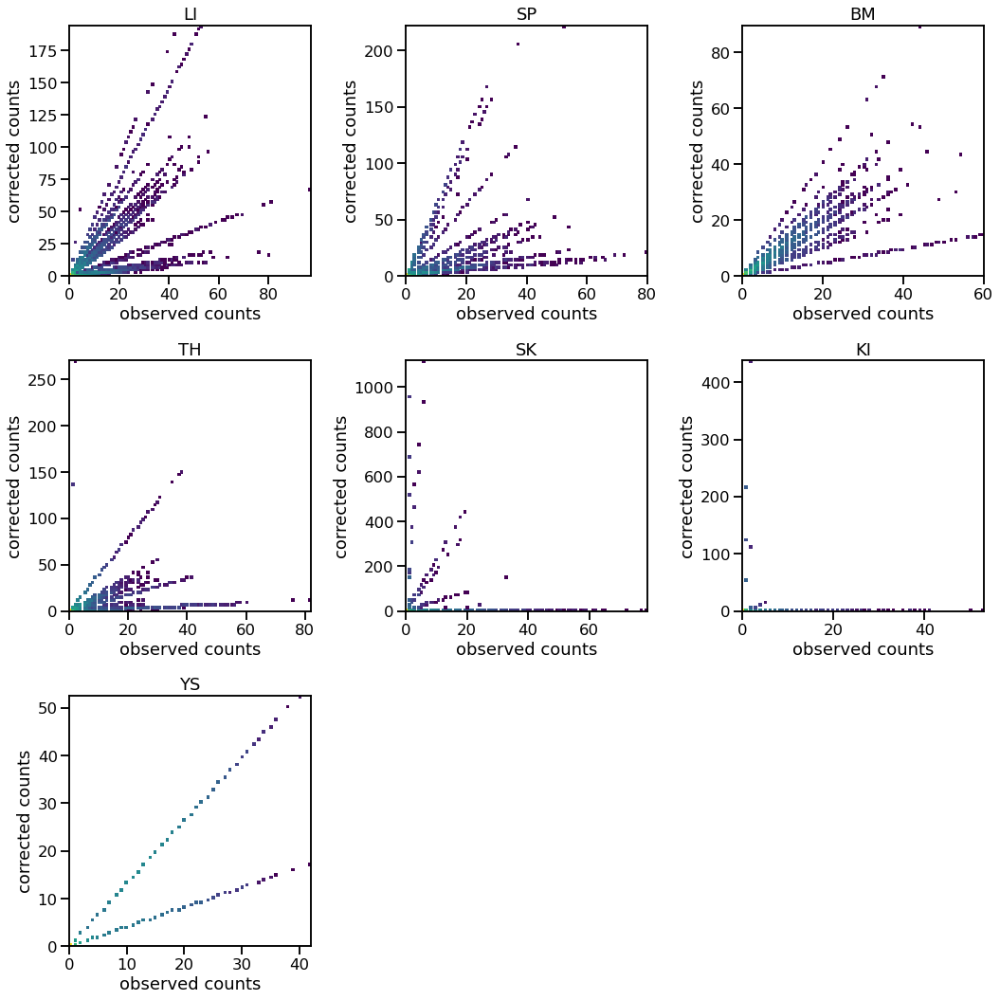

In [1204]:
all_organs = nhood_adata.var.organ.unique()
plt.rcParams["figure.figsize"] = [15,15]
for i in range(len(all_organs)):
    small_adata = nhood_adata[:,nhood_adata.var["organ"] == all_organs[i]]
    plt.subplot(3, 3, i+1);
    plt.hist2d(small_adata.X.toarray().flatten(), small_adata.layers['X_counts_corrected'].flatten(), bins=100, norm=matplotlib.colors.LogNorm());
    plt.xlabel("observed counts"); plt.ylabel("corrected counts");
    plt.title(all_organs[i]);
    plt.tight_layout();

Does it make sense to use this transformation for small cell numbers?

if the factor=0.5 


## Build neighbourhoods and count cells

In [15]:
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

In [30]:
milo.count_nhoods(adata, sample_col="Sample.lanes")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [31]:
import milopy
def annotate_nhoods(adata, anno_col):
    anno_dummies = pd.get_dummies(adata.obs[anno_col])
    anno_count = adata.obsm["nhoods"].T.dot(scipy.sparse.csr_matrix(anno_dummies.values))
    anno_frac = np.array(anno_count/anno_count.sum(1))

    anno_frac = pd.DataFrame(anno_frac, 
                             columns=anno_dummies.columns,
                             index=adata.uns["nhood_adata"].obs_names
                            )
    adata.uns["nhood_adata"].obsm["frac_annotation"] = anno_frac.values
    adata.uns["nhood_adata"].uns["annotation_labels"] = anno_frac.columns
    adata.uns["nhood_adata"].obs["nhood_annotation"] = anno_frac.idxmax(1)
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] = anno_frac.max(1)
    
milopy.utils.add_covariate_to_nhoods_var(adata,["organ", "age", "parent_Multiplier", "sort.ids", 'donor', 'sort_sample_id'])
annotate_nhoods(adata, "updated_anno")
nhood_adata = adata.uns["nhood_adata"].copy()
# help(milopy.utils.add_covariate_to_nhoods_var)

In [32]:
ix=15000

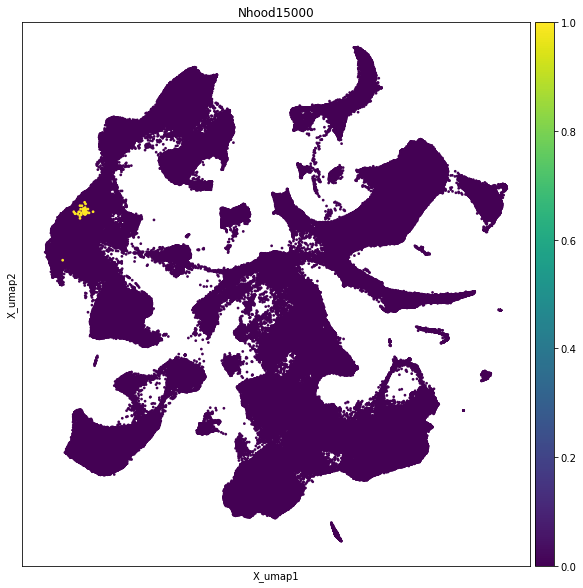

In [33]:
milopy.plot.plot_nhood(adata, ix)

Viz example counts for one nhood

In [485]:
nhood_count = nhood_adata[ix,:].X.toarray().ravel()
nhood_df = nhood_adata.var.copy()
nhood_df["cell_count"] = nhood_count
nhood_df["age"] = nhood_df["age"].astype("float")
nhood_df["parent_Multiplier"] = nhood_df["parent_Multiplier"].astype("float")

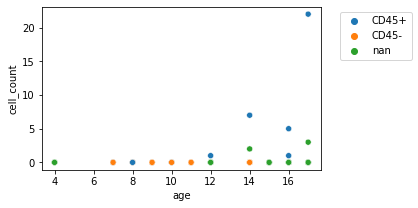

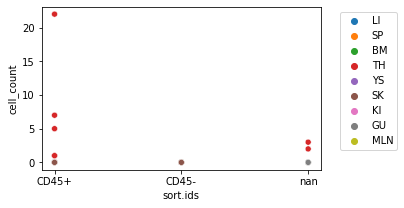

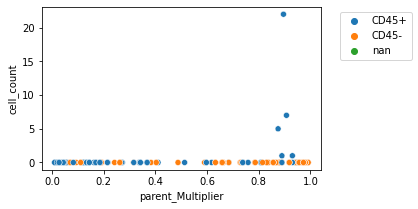

In [486]:
plt.rcParams["figure.figsize"] = [5,3]
sns.scatterplot(data=nhood_df, x="age", y="cell_count", hue="sort.ids");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()
sns.scatterplot(data=nhood_df, x="sort.ids", y="cell_count", hue="organ");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()
sns.scatterplot(data=nhood_df, x="parent_Multiplier", y="cell_count", hue="sort.ids");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()

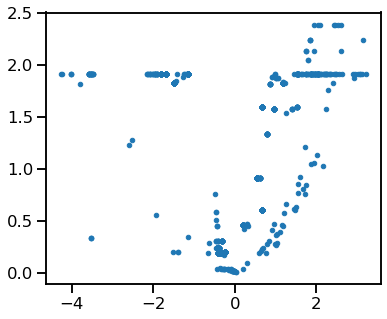

In [693]:
res_df_1 = milo_res_1["SK"]
plt.plot(res_df_1.logFC, -np.log10(res_df_1.FDR),'.')

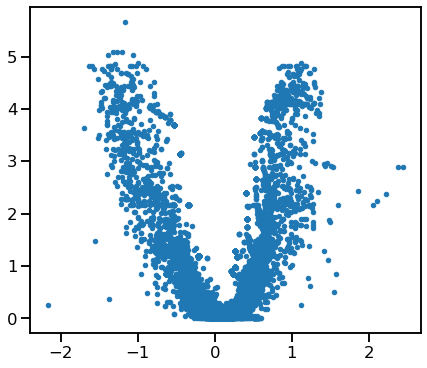

In [648]:
res_df_2 = milo_res_2["SK"]
# plt.hist(res_df.PValue)
plt.plot(res_df_2.logFC, -np.log10(res_df_2.FDR),'.')

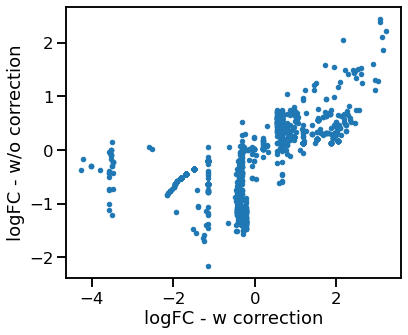

In [669]:
plt.plot(res_df_1["logFC"],res_df_2["logFC"], '.');
plt.xlabel("logFC - w correction"); plt.ylabel("logFC - w/o correction");

In [699]:
signif_nhoods_1 = res_df_1.index[(res_df_1["logFC"] < -3) & (res_df_1["FDR"] < 0.1)]

In [599]:
# isna = org_fc_1["logFC_SK"].isna().values
# issignif = (org_fdr_1["SpatialFDR_SK"] < 0.05).values
# signif_nhoods_1 = org_fc_1.index[issignif & ~isna]

# isna = org_fc_2["logFC_SK"].isna().values
# issignif = (org_fdr_2["SpatialFDR_SK"] < 0.05).values
# signif_nhoods_2= org_fc_2.index[issignif & ~isna]

In [655]:
milopy.utils.add_covariate_to_nhoods_var(adata, ["organ", "age_bins", "Sort_id"])

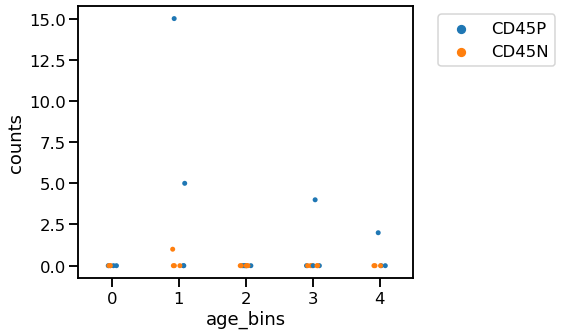

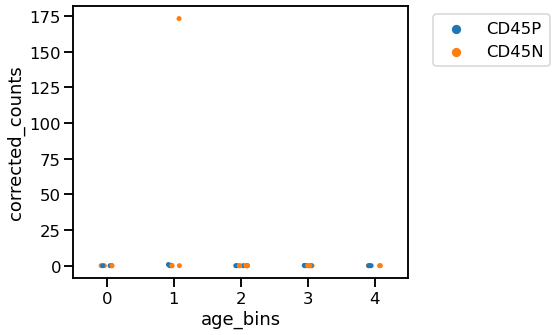

In [703]:
ix = 21
plt.rcParams["figure.figsize"] = [6,5]
counts = adata.uns["nhood_adata"][signif_nhoods_1[ix]].layers["X_counts"][0]
corr_counts = adata.uns["nhood_adata"][signif_nhoods_1[ix]].layers["X_counts_corrected"][0]
adata.uns["nhood_adata"].var["age_bins"] = adata.uns["nhood_adata"].var["age_bins"].astype("int")
df = adata.uns["nhood_adata"].var.copy()
df["counts"] = counts
df["corrected_counts"] = corr_counts
sns.stripplot(data=df[df.organ=="SK"], x="age_bins", y="counts", hue="Sort_id");
# sns.stripplot(data=df[df.organ=="SK"], x="age_bins", y="counts", hue="Sort_id");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()
# sns.stripplot(data=df, x="age_bins", y="corrected_counts", hue="organ");
sns.stripplot(data=df[df.organ=="SK"], x="age_bins", y="corrected_counts", hue="Sort_id");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');


Transform to a proportion of CD45+ and CD45- for each sample

In [269]:
smp_metadata[(smp_metadata["donor"] == "F34") & (smp_metadata["organ"] == "LI")]

,sort.ids,parent_Multiplier,organ,age,Sample.lanes,donor
index,,,,,,
FCAImmP7352195-CGTTCTGGTAGCGATG,CD45-,0.888749,LI,8,FCAImmP7352195,F34
FCAImmP7352193-CAGGTGCCAATGACCT,CD45+,0.111251,LI,8,FCAImmP7352193,F34
FCAImmP7352192-TTTCCTCAGAAACCGC,CD45+,0.111251,LI,8,FCAImmP7352192,F34
FCAImmP7352196-CGACCTTTCTCGATGA,CD45+,0.111251,LI,8,FCAImmP7352196,F34
FCAImmP7352194-CTCAGAACACTTAAGC,CD45-,0.888749,LI,8,FCAImmP7352194,F34


In [270]:
facs_prop_df[(facs_prop_df["orig.ident"] == "F34") & (facs_prop_df["origin"] == "liver")]

,orig.ident,Sample.lanes,age,sort.ids,origin,count,total_live_events,parent_Multiplier,remarks,file
66,F34,FCAImmP7352192,8,CD45+,liver,1763,15847,0.111251,NaN,FCAImmP7352192
67,F34,FCAImmP7352193,8,CD45+,liver,1763,15847,0.111251,NaN,FCAImmP7352193
68,F34,FCAImmP7352194,8,CD45-,liver,14084,15847,0.888749,NaN,FCAImmP7352194
69,F34,FCAImmP7352195,8,CD45-,liver,14084,15847,0.888749,NaN,FCAImmP7352195
70,F34,FCAImmP7352196,8,CD45+,liver,1763,15847,0.111251,NaN,FCAImmP7352196


In [271]:
smp_metadata[(smp_metadata["donor"] == "F45") & (smp_metadata["organ"] == "LI")]

,sort.ids,parent_Multiplier,organ,age,Sample.lanes,donor
index,,,,,,
FCAImmP7579227-GCAATCACACCGGAAA,CD45-,0.830810,LI,12,FCAImmP7579227,F45
FCAImmP7579223-GCAGTTAGTCTCTTAT,CD45-,0.786388,LI,12,FCAImmP7579223,F45
FCAImmP7579222-CATGGCGGTTCCGGCA,CD45+,0.213612,LI,12,FCAImmP7579222,F45
FCAImmP7579226-GGTATTGCAGGCAGTA,CD45+,0.169190,LI,12,FCAImmP7579226,F45


In [275]:
smp_metadata["donor_organ"] = smp_metadata["donor"].astype("str") + "_" + smp_metadata["organ"].astype("str")
# mean_p = smp_metadata[smp_metadata["sort.ids"] == 'CD45+'].groupby('donor_organ').mean('parent_Multiplier')['parent_Multiplier']
max_p_CD45p = smp_metadata[smp_metadata["sort.ids"] == 'CD45+'].groupby('donor_organ').max('parent_Multiplier')['parent_Multiplier']
max_p_CD45n = smp_metadata[smp_metadata["sort.ids"] == 'CD45-'].groupby('donor_organ').max('parent_Multiplier')['parent_Multiplier']

I am not sure about some of the values in the table you shared and I am not sure that the "parent multiplier" term is what we need here: in differential abundance analysis we are interested in identifying regions where the differences in cell numbers across age (or whatever covariate) are attributable to a differential distribution across age of samples with different sorting bias (as a stupid example, if we only had perfect CD45+ early and perfect CD45- late, we would find a relationship between cell numbers and age, but that would be a false positive driven by the sorting bias). To correct for this type of effect, we want to use a more accurate quanfication of CD45+/- ratios (where a perfect CD45+ sort would represent ratio=1 and a perfect CD45- would represent ratio=0). As far as I understand the 'parent_multiplier' term represents the _true_ fraction of CD45+ or CD45- cells in the sample from that organ and donor, based on the total number of cells. 

- Are the CD45+ and CD45- fractions for each sample (same organ, same donor) obtained from the same sort using the same gate? Or do they come from different sorts? 

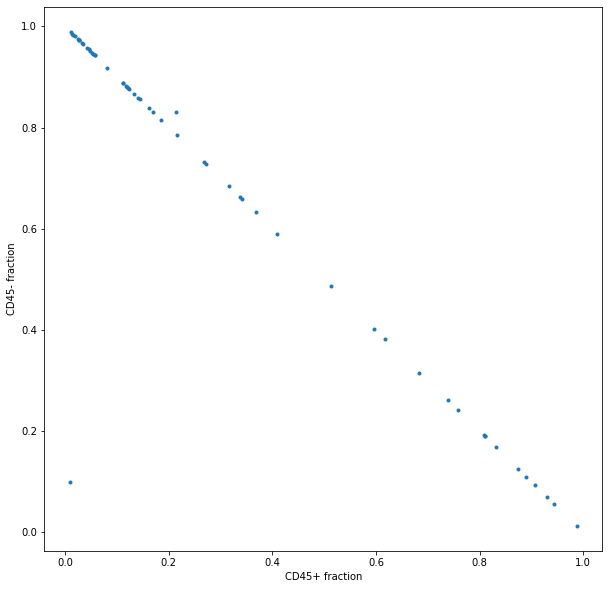

In [298]:
df = pd.concat([max_p_CD45p,max_p_CD45n],1)
df.columns = ["CD45p", "CD45n"]
plt.plot(df.CD45p, df.CD45n, '.');
plt.xlabel("CD45+ fraction");plt.ylabel("CD45- fraction");

## Build neighbourhoods and count cells

In [292]:
milo.make_nhoods(adata, neighbors_key="scvi", prop=0.05)

In [293]:
milo.count_nhoods(adata, sample_col="Sample.lanes")

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [294]:
import milopy
milopy.utils.add_covariate_to_nhoods_var(adata,["organ", "age", "parent_Multiplier", "sort.ids"])
nhood_adata = adata.uns["nhood_adata"].copy()
# help(milopy.utils.add_covariate_to_nhoods_var)

In [295]:
ix=15000

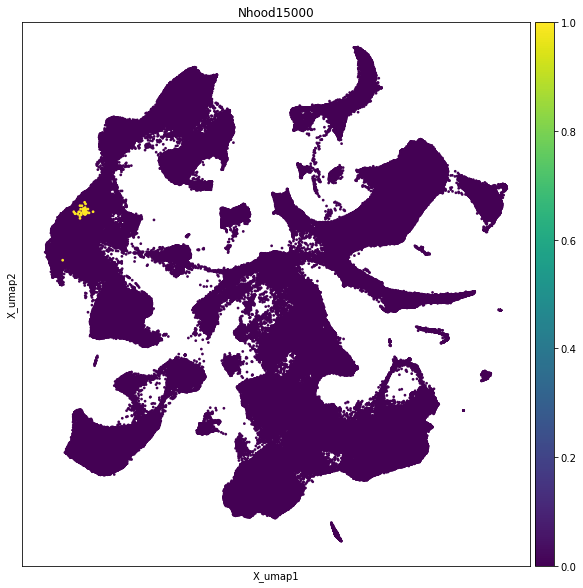

In [296]:
milopy.plot.plot_nhood(adata, ix)

In [297]:
nhood_count = nhood_adata[ix,:].X.toarray().ravel()
nhood_df = nhood_adata.var.copy()
nhood_df["cell_count"] = nhood_count
nhood_df["age"] = nhood_df["age"].astype("float")
nhood_df["parent_Multiplier"] = nhood_df["parent_Multiplier"].astype("float")

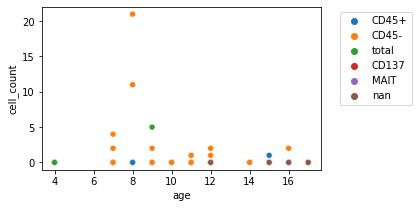

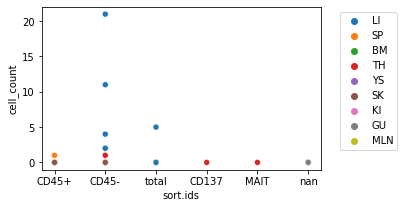

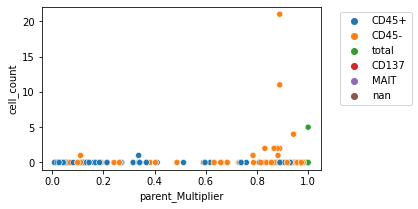

In [153]:
plt.rcParams["figure.figsize"] = [5,3]
sns.scatterplot(data=nhood_df, x="age", y="cell_count", hue="sort.ids");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()
sns.scatterplot(data=nhood_df, x="sort.ids", y="cell_count", hue="organ");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()
sns.scatterplot(data=nhood_df, x="parent_Multiplier", y="cell_count", hue="sort.ids");
plt.legend(  bbox_to_anchor=(1.05, 1), loc='upper left');
plt.show()